In [1]:
# imported from Pranav Sanghavi's notebook 
import glob
import os
import time
import h5py
import matplotlib.pylab as plt
import numpy as np
import numpy.ma as ma
from matplotlib.offsetbox import AnchoredText
from matplotlib.pylab import colorbar 
from skrf import Network, Frequency
import math
import psutil
import matplotlib.cm as cm
from scipy.interpolate import interp1d
from scipy.stats import pearsonr
import csv

style = 'fast'
tick_dir = 'in'
plt.style.use(style)
plt.rcParams['xtick.direction'] = tick_dir
plt.rcParams['ytick.direction'] = tick_dir
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['font.size'] = 15
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.5
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif"})

###################################################################################
# Analog chain labels
###################################################################################

#pathtoacfile = "/home/observer/tone_jupyter/anachainz.csv"
#ac = np.genfromtxt(pathtoacfile, delimiter=",", names=True,
#                   dtype=(int, int, 'U5', 'U5', int, 'U2', int))
#inputs = ac['feed']

def get_beam_fwhm(d=6.0, nu=600):
    fwhm = constants.c/(nu*1e6)/d   # lambda/D
    return np.rad2deg(fwhm * 1.22)

def gaussian(x, a, mean, sigma):
    val = a * np.exp(-(x - mean)**2 / sigma**2)
    return val

def scale_zero_one(x):
    return (x - x.min())/(x.max() - x.min())

def seconds_to_degrees(seconds, declination=22.0145):
    """
    convert seconds to degrees of sky motion at a latitude default TONE latitude default for cra
    """
    return seconds * np.cos(np.deg2rad(declination)) / 240

def read_corr_mode_h5(file_path, f_start=None, f_stop=None):
    """
    Reading all hdf5 files
    """
    class correlator_data:
        def __init__(self, vis, time, sat, index_map):
            self.vis = vis
            self.time = time
            self.sat = sat
            self.freq = index_map["freq"][:]
            self.prod = index_map['prod'][:]
    files = glob.glob(file_path + "*[!.lock]")
    files.sort()
    
    #grab different sets of files.  
    if f_start is not None:
        if f_stop is not None:
            files = files[f_start:f_stop]
        else:
            files = files[f_start:]
    if f_start is None:
        if f_stop is not None:
            files = files[:f_stop]

    try:
        t = 0
        for x in files:
            #print(f"Reading File: {x}")
            f = h5py.File(x, "r")
            index_map = f['index_map']
            if(t == 0):
                vis = f['vis'][:]
                time = index_map['time'][:]
                sat = f['sat'][:]
                #print("Appended vis data and time stream from %s" % (x))
                t = t + 1
            else:
                time = np.append(time, index_map['time'][:])
                vis = np.append(vis, f['vis'][:], axis=0)
                sat = np.append(sat, f['sat'][:], axis=0)
                #print("Appended vis data and time stream from %s" % (x))
        
        return correlator_data(
            vis,
            time,
            sat,
            index_map
        )
    finally:
        print("Done!!!!!!!")

def get_mag_phase(power0):
    """
    # return magnitude and phase in degrees of correlations
    """
    return np.absolute(power0), np.rad2deg(np.angle(power0))

def plot_waterfall_corr_data(data, corr_indices):
    plt.figure(figsize=(20, 20))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for i,auto in enumerate(corr_indices):
        plt.subplot(dim1, dim2, i + 1)
        wfall = data[:, :, auto] # auto -> corr index 
        plt.imshow(wfall, vmin = np.nanpercentile(wfall,5), vmax =np.nanpercentile(wfall,95), aspect='auto')
        plt.xlabel("freq index")
        plt.ylabel("time index")
        plt.title(f"corr {corr_data.prod[auto]}")
    plt.tight_layout()
    
def plot_freq_channel_corr_data(pow_mag, freq_index, freq, corr_indices):
    plt.figure(figsize=(20, 20))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for index, corr_index in enumerate(corr_indices):
            plt.subplot(dim1, dim2, index + 1)
            plt.title(f"Corr: {corr_data.prod[corr_index]}")
            #plt.plot(pow_mag[:, freq_index, corr_index]00000053.h5)
            plt.plot(pow_mag[:, :, corr_index])

    plt.suptitle(f"Frequency {freq} MHz")
    plt.tight_layout()


In [22]:
f = h5py.File("/Volumes/EXTRSSD/digital_gains_corr/20240628T164812Z_WVUc52_digitalgain/00000084.h5","r")

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/Volumes/EXTRSSD/digital_gains_corr/20240628T164812Z_WVUc52_digitalgain/00000084.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
print(list(f.attrs))
print(f.attrs['acquisition_name'])
print(f.attrs['archive_version'])
print(f.attrs['collection_server'])
print(f.attrs['git_version_tag'])
print(f.attrs['instrument_name'])
print(f.attrs['notes'])
print(f.attrs['system_user'])
print(f.attrs['type'])
print(f.attrs['version'])

print(list(f.items()))
print((f['compute_time']))
print((f['index_map']))
print((f['gain_coeff']))
print((f['gain_exp']))

inputs = (f['index_map']['input'][:])
frqs = f['index_map']['freq'][:]
gaincoeff = f['gain_coeff'][()]
gainexp = f['gain_exp'][()]
gain = gaincoeff.real*np.exp2(gainexp)

plt.figure(figsize=[16,18])
i = 0
for i in np.arange(0,2,1):  
    plt.subplot(8,2,i+1)
    #Digital gain of every channel
    plt.scatter(frqs['centre'], gain[0][:,i]) # i referes to input channel (total 16 ch on iceboard); 
    #plt.title( " %s and gain_exp = %s and rms %s for rms i/p %s" %(inputs[i], gainexp[:,i], rms[i][2], rms[i][0][2]))
    plt.title( " %s " %(inputs[i]))
plt.tight_layout()

In [ ]:
print(gainexp)
print(gaincoeff[0,:,1])
gain = gaincoeff.real*np.exp2(gainexp)
print(gain.shape)
print(gain[0,:,1])
print(gain[0,:,1].shape)
print(frqs['centre'])
print(inputs)
np.log2(1651456)

In [2]:
# reading correlation files 
corr_data_path = '/hirax/DNS_freespace/20240702T150724Z_WVUc52/corr/20240702T150821Z/'
file_path = corr_data_path
corr_data = read_corr_mode_h5(file_path, f_start=20, f_stop=22)
print("getting autocorrelation magnitudes and phase")
pow_mag, pow_phase = get_mag_phase(corr_data.vis)
print("done getting pow_mag and pow_phase")
sat_data = corr_data.sat.real # what is this paramater?

Done!!!!!!!
getting autocorrelation magnitudes and phase
done getting pow_mag and pow_phase


In [17]:
corr_data.vis[1][:][31] # correlation data having real and imag component 
print(corr_data.vis[:,0,0].shape) # time bins - freq bins - corr indices


(512,)


Each time bin is: 0.04194304 seconds
total time bins (considered for the plots) are 512
21.47483648 seconds of data (considered for the plots)


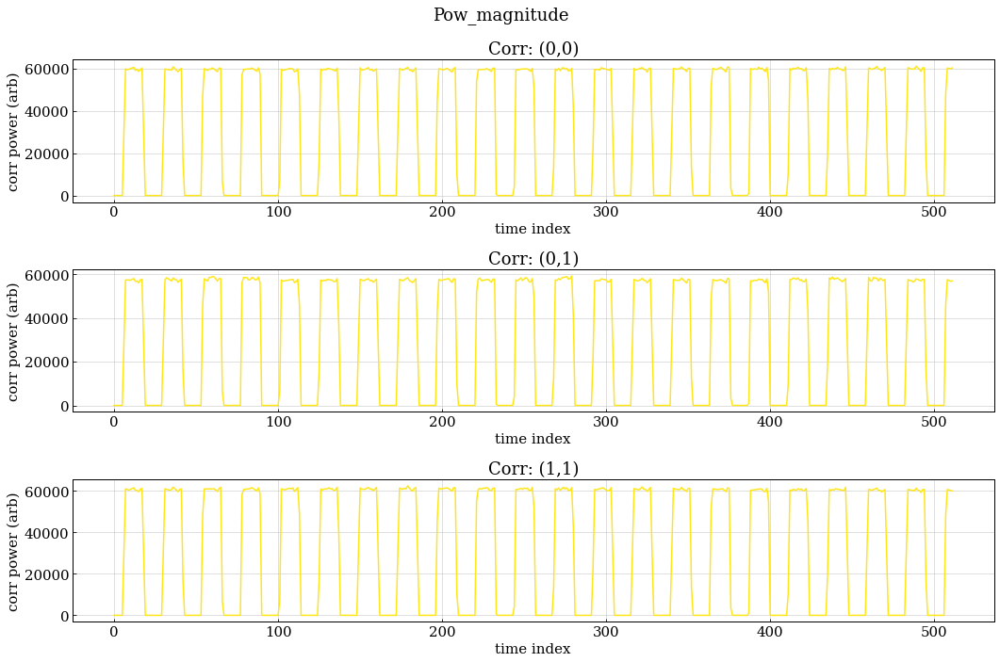

In [24]:
#plotting correlated power spectrum 
colorsarr=cm.gnuplot2(np.linspace(0,1,1024))
plt.figure(figsize=[15,10])
fbin=890
k=50
tmin,tmax=[0,6600]

plt.subplot(3,1,1)
plt.plot(pow_mag[tmin:tmax,fbin,0], c=colorsarr[fbin])
#plt.ylim(60000,65000)
plt.title(f"Corr: (0,0)")
plt.xlabel("time index")
plt.ylabel("corr power (arb)")

plt.subplot(3,1,2)
plt.plot(pow_mag[tmin:tmax,fbin,1], c=colorsarr[fbin]) 
#plt.ylim(55000,65000)
plt.title(f"Corr: (0,1)")
plt.xlabel("time index")
plt.ylabel("corr power (arb)")

plt.subplot(3,1,3)
plt.plot(pow_mag[tmin:tmax,fbin,4],c=colorsarr[fbin]) 
#plt.ylim(60000,65000)
plt.title(f"Corr: (1,1)")
plt.xlabel("time index")
plt.ylabel("corr power (arb)")

plt.suptitle(f"Pow_magnitude")
plt.tight_layout()

delta_time = np.diff(corr_data.time["irigb_time"])[1]*1e-9
print(f"Each time bin is: {delta_time} seconds")
print(f"total time bins (considered for the plots) are {len(corr_data.vis[:,0,0])}")
print(f"{delta_time*len(corr_data.vis[:,0,0])} seconds of data (considered for the plots)")

Text(0, 0.5, 'corr power (arb)')

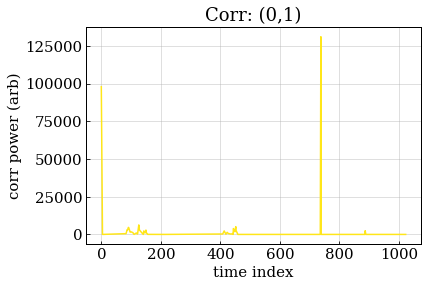

In [25]:
plt.plot(pow_mag[0,:,4], c=colorsarr[fbin]) 
#plt.ylim(55000,65000)
plt.title(f"Corr: (0,1)")
plt.xlabel("time index")
plt.ylabel("corr power (arb)")

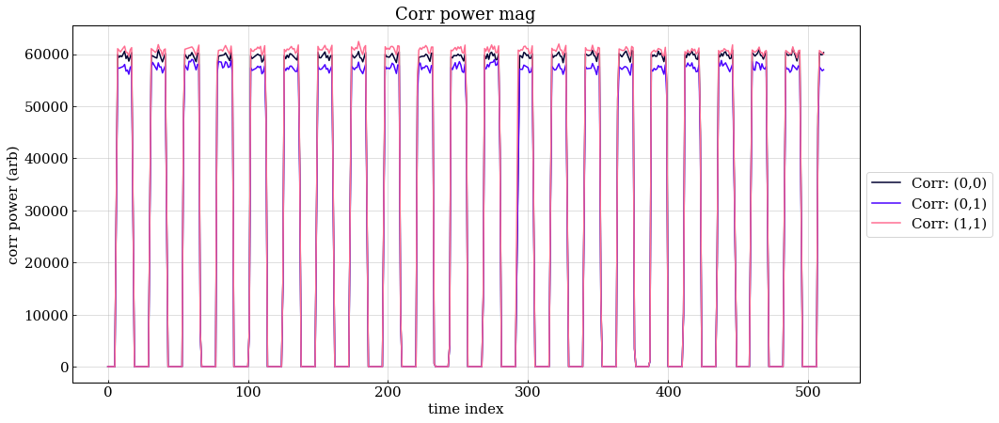

In [26]:
## overplotting autos and crosses power to check difference   
fig = plt.figure(figsize=[15,7])
ax = plt.subplot(111)

ax.plot(pow_mag[tmin:tmax,fbin,0], c=colorsarr[k],label='Corr: (0,0)' )
ax.plot(pow_mag[tmin:tmax,fbin,1],c=colorsarr[k+300], label='Corr: (0,1)')
ax.plot(pow_mag[tmin:tmax,fbin,4],c=colorsarr[k+600], label='Corr: (1,1)')
#plt.ylim(50000,70000)
plt.xlabel("time index")
plt.ylabel("corr power (arb)")
plt.title(f"Corr power mag")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [3]:
#Will's function for identifying pulse sections

import time_utils as tu

def Extract_Source_Pulses(self,Period=0.9998e6,Dutycycle=0.5e6,t_bounds=[0,-1],f_ind=890,minmaxpercents=[0.0001,100]):
    ## If we don't have any variables, then we haven't loaded a yaml yet... and must run the function:
        pow_mag, pow_phase = get_mag_phase(self.vis)
        ## Create Switch Signal
        self.pulse_period=Period
        self.pulse_dutycycle=Dutycycle
        delta_time = np.diff(self.time["irigb_time"])[1]*1e-9
        concat_duration=int(np.ceil(delta_time*len((self.vis)))) #actual full time in seconds
        time_s,time_dt,switch=tu.Pulsed_Data_Waveform(total_duration=concat_duration,period=self.pulse_period,duty_cycle_on=self.pulse_dutycycle)
        ## Create t_offset range (1 period) and Pearson_r vars:
        t_offset_dist=np.arange(-1.0*self.pulse_period*1e-6,0.0,0.001)
        n_channels = 3
        Pr_arr=np.NaN*np.ones((n_channels,t_offset_dist.shape[0]))
        Pr_max_ind_per_channel=np.NaN*np.ones(n_channels) 
        Pr_max_t_0_per_channel=np.NaN*np.ones(n_channels)
        # Given parameters
        num_bins = len(pow_mag[:,f_ind,1])
        time_bin_width = np.diff(self.time["irigb_time"])[1]*1e-9 # seconds
        # Create the array of time values
        t_full = np.arange(num_bins) * time_bin_width
        #t_full=np.array([(m-self.t_arr_datetime[0]).total_seconds() for m in self.t_arr_datetime[:]])

    
        ## Loop over channels to find/plot a time offset solution with some clever fitting:
        fig1,ax1=plt.subplots(nrows=1,ncols=1,figsize=(16,4))
        
        for i in range(n_channels):
            ## If we use a mean subtracted data cut we can find where power exceeds zero to find signal
            minsubdata=self.vis[:,f_ind,i]-np.percentile(self.vis[:,f_ind,i],minmaxpercents[0])
            normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])
            clipnormminsubdata=normminsubdata.clip(0,1)
            stepped_func=interp1d(t_full,clipnormminsubdata,kind='previous',fill_value='extrapolate')
            sniparr=np.where(time_s[np.where(time_s<=t_full[t_bounds[1]])[0]]>=t_full[t_bounds[0]])[0]
            t_restrict=np.intersect1d(np.arange(len(time_s))[~np.isnan(stepped_func(time_s))],sniparr)
            
            #plt.plot(stepped_func(time_s[t_restrict]))
            #shiftedswitch=np.interp(time_s,time_s+t_offset_dist[265],switch)
            #plt.plot(shiftedswitch[t_restrict]+0.5)
            #print(pearsonr(stepped_func(time_s[t_restrict]).real,(shiftedswitch[t_restrict]+0.5))[0])
            
            
            ## Loop over all time offsets in t_offset_dist to find maximum correlation between squarewave and data:
            for j,t_offset in enumerate(t_offset_dist):
                shiftedswitch=np.interp(time_s,time_s+t_offset,switch)
                try:
                    Pr_arr[i,j]=pearsonr(stepped_func(time_s[t_restrict]).real,(shiftedswitch[t_restrict]))[0]
                except ValueError:
                    Pr_arr[i,j]=np.NAN
                    print(str(j)+" failed: " +str(t_offset))
            
            
            ax1.plot(t_offset_dist,Pr_arr[i,:],'.',label=str(i))
           
            
            try:
                maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]
                
                ax1.plot(t_offset_dist[maxPrind],Pr_arr[i,maxPrind],'ro')

                
                Pr_max_ind_per_channel[i]=maxPrind
                Pr_max_t_0_per_channel[i]=t_offset_dist[maxPrind]
            except IndexError:
                Pr_max_ind_per_channel[i]=np.NAN
                Pr_max_t_0_per_channel[i]=np.NAN
        self.t_delta_pulse=Pr_max_t_0_per_channel[0]   
        ax1.axvline(self.t_delta_pulse,label="selected t_offset")
        ax1.legend(loc=1)
        plt.tight_layout()
        print("Maximum Pearson_R Correlations between data and square wave function:")
        print("  --> t_indices = {}".format(Pr_max_ind_per_channel))
        print("  --> t_deltas = {}".format(np.around(Pr_max_t_0_per_channel,decimals=3)))
        print("Selecting square wave function time offset:")
        print("  --> t_delta_pulse = {:.10f}".format(self.t_delta_pulse))
    
        #if self.save_traceback==True:
            #savefig(self.Output_Directory+self.Output_Prefix+"_t_delta_pulse_Pearson_R.png")
        #if self.save_traceback==False:
            #pass
    #elif self.traceback==False:
        #pass
        
        
        t_arr_datetime = t_full 
    ## Interpolate the switching function with the concat timestamps using either input or found t_delta_pulse:
        num_bins = len(pow_mag[:,f_ind,1])
        time_bin_width = np.diff(self.time["irigb_time"])[1]*1e-9 # seconds
        # Create the array of time values
        t_for_interp_out=np.arange(num_bins) * time_bin_width #defining same as t_full
        t_for_interp_in=np.array([m.total_seconds() for m in time_dt])
        switch_interp_f=np.interp(t_for_interp_out,t_for_interp_in+self.t_delta_pulse,switch)
        self.switch_signal=switch
        self.switch_time=t_for_interp_in
        self.switch_signal_interp=switch_interp_f
        #print(switch_interp_f)
        ## Once we have our time offset, we must extract indices where the source is on/off/rising:
        self.inds_span=np.union1d(list(set(np.where(np.diff(np.sign(switch_interp_f)))[0])),\
                                  np.intersect1d(np.where(1>switch_interp_f),np.where(switch_interp_f>0))).tolist()
    
        self.inds_on=list(set(np.where(switch_interp_f==1)[0])-set(self.inds_span))
        self.inds_off=list(set(np.where(switch_interp_f==0)[0])-set(self.inds_span))
        
        # Add this code snippet after interpolating switch_interp_f in Extract_Source_Pulses function


        #print("Inds span: " + str(self.inds_span))
        #print("Inds on: " + str(self.inds_on))
        #print("Inds off: " + str(self.inds_off))



    ## Each of these lists of indices should also have no overlap. Let's print to see:
        print("Finding relevant pulsing indices and checking for overlaps:")
        print("  --> on/off ind intersection:",np.intersect1d(self.inds_on,self.inds_off))
        print("  --> on/span ind intersection:",np.intersect1d(self.inds_on,self.inds_span))
        print("  --> off/span ind intersection:",np.intersect1d(self.inds_off,self.inds_span))

    
        channel_indicies = [0,1,4]
        on_avgs = []
        on_stds=[]
        fig3=plt.figure(figsize=(16,int(4*n_channels/2)))
        
        for i in range(n_channels):
            all_data = pow_mag[:,f_ind,channel_indicies[i]]
            
            
            # Assume self.inds_on and all_data are already defined

            # Calculate z-scores
            #z_scores = np.abs((all_data[self.inds_on] - np.mean(all_data[self.inds_on])) / np.mean(all_data[self.inds_on]))
            #print(z_scores)
            # Identify outliers
            #outlier_indices = np.where(z_scores > .3)[0]
            # Print outliers if any
            #print("Outlier indices:", outlier_indices)  # Check the values of outlier_indices
            #print("Outlier Z values:", z_scores[outlier_indices])
            # Remove outliers
            #inds_on_clean = np.delete(self.inds_on, outlier_indices)
            # Calculate mean and std with cleaned indices
            on_avgs.append(np.mean(all_data[self.inds_on]))
            on_stds.append(np.std(all_data[self.inds_on]))

            
            ax=fig3.add_subplot(n_channels,1,i+1)
            ax.plot(t_arr_datetime[:],all_data[:],label='data')
            ax.scatter(t_arr_datetime[self.inds_on],all_data[self.inds_on],label='on',color='red',s=10)
            ax.scatter(t_arr_datetime[self.inds_off],all_data[self.inds_off],label='off',color='green',s=10)
            ax.scatter(t_arr_datetime[self.inds_span],all_data[self.inds_span],label='span',color='blue',s=10)
            #ax.semilogy(t_arr_datetime[:],self.vis[:,f_ind,i],'k.',label='all')
            #plt.plot(t_arr_datetime[:],self.vis[:,f_ind,i],'k.',label='all')
            #ax.semilogy(t_arr_datetime[self.inds_on],self.vis[self.inds_on,f_ind,i],'.',label='on')
            #ax.semilogy(t_arr_datetime[self.inds_off],self.vis[self.inds_off,f_ind,i],'.',label='off')
            #ax.semilogy(t_arr_datetime[self.inds_span],self.vis[self.inds_span,f_ind,i],'x',label='span')
            #ax.semilogy(t_arr_datetime[:],(np.nanmax(self.vis[self.inds_on,f_ind,i])*switch_interp_f)+np.nanmin(self.vis[self.inds_on,f_ind,i]),'--',alpha=0.5,label='switch, t_offset={:.2f}'.format(self.t_delta_pulse))
            ax.set_ylabel("Log Power Received [$ADU^2$]")
            ax.set_xlabel("Datetime")
            #ax.set_title("Channel {}".format(self.chmap[i]))
            ax.legend(loc=3)
            #ax.set_xlim(t_arr_datetime[t_bounds[0]],t_arr_datetime[t_bounds[1]])
            
        # Visualize alignment of switch_interp_f with actual data
        fig_align, ax_align = plt.subplots(figsize=(12, 6))
        ax_align.plot(t_arr_datetime, all_data, label='Actual Data')
        ax_align.plot(t_arr_datetime, switch_interp_f * np.nanmax(all_data), label='Interpolated Switch')
        ax_align.set_xlabel('Datetime')
        ax_align.set_ylabel('Data / Interpolated Switch')
        ax_align.set_title('Alignment of Interpolated Switch with Actual Data')
        ax_align.legend()
        plt.tight_layout()
        plt.show()
        
        print("Frequency bin: "+str(f_ind))

        return on_avgs, on_stds, self.inds_on, self.inds_off, self.inds_span

Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [274. 764. 262.]
  --> t_deltas = [-0.726 -0.236 -0.738]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7258000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


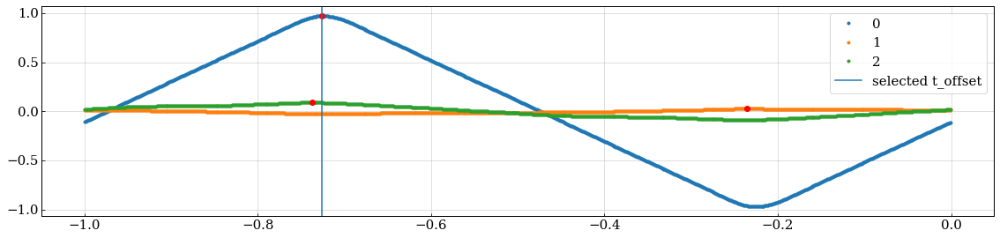

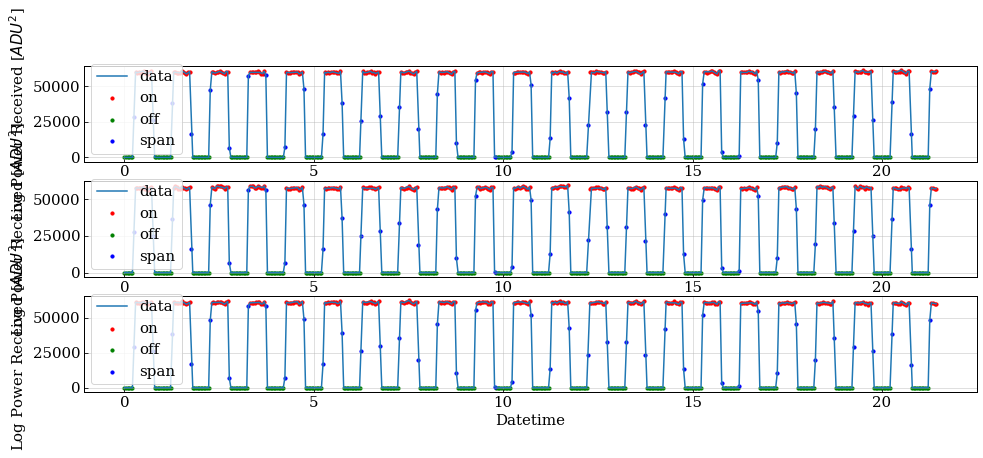

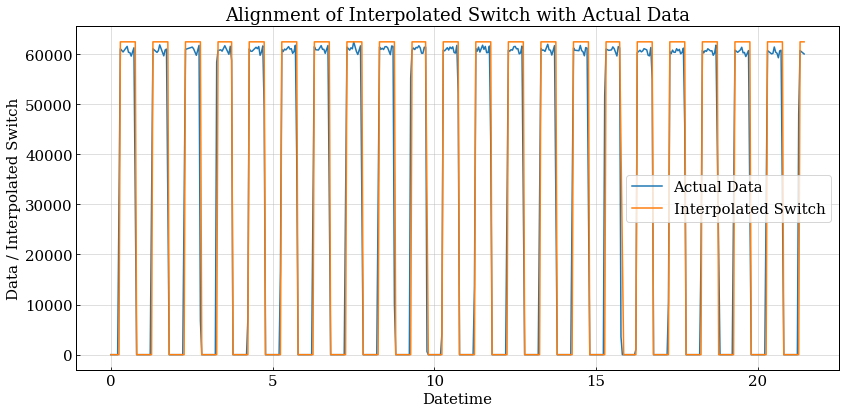

Frequency bin: 890


In [11]:
avgs,stds,on_inds,off_inds,span = Extract_Source_Pulses(corr_data)

In [3]:
#Angles and corresponding file ranges for this particular data run

angle_to_files = {
    0: [20, 22],
    -10: [56, 57, 58],
    -20: [62, 63, 64],
    -30: [69, 70, 71],
    -40: [75, 76, 77],
    -50: [82, 83, 84, 85],
    -60: [90, 91, 92],
    -70: [98, 99, 100],
    -80: [104, 105, 106],
    -90: [113, 114, 115],
    -100: [120, 121, 122],
    -110: [127, 128, 129],
    -120: [133, 134, 135],
    -130: [140, 141, 142],
    -140: [147, 148, 149],
    10: [159, 160, 161],
    20: [164, 165, 166],
    30: [170, 171, 172],
    40: [180, 181, 182],
    50: [187, 188, 189],
    60: [195, 196, 197],
    70: [202, 203, 204],
    80: [210, 211, 212],
    90: [218, 219, 220],
    100: [226, 227, 228],
    110: [233, 234, 235],
    120: [240, 241, 242],
    130: [247, 248, 249],
    140: [255, 256, 257]
}


In [5]:
##Function that picks out the "On" points and saves their mean and standard deviation for each angle/channel
##Saves the results to a .csv file, helpful so you only have to do this once because it's pretty slow


#ONLY WORKS FOR ONE FREQUENCY AT A TIME 

fbin = 890


# Path to the master CSV file
master_csv_file = 'on_stats_f'+str(fbin)+'_0702.csv'

# Define headers for the CSV file
fieldnames = ['Angle', 'Mean_00', 'Mean_01', 'Mean_11', 'Standard_Deviation_00', 'Standard_Deviation_01', 'Standard_Deviation_11']

# Function to initialize or create the CSV file with headers
def initialize_csv_file():
    if not os.path.exists(master_csv_file):
        with open(master_csv_file, mode='w', newline='') as file:
            writer = csv.DictWriter(file, fieldnames=fieldnames)
            writer.writeheader()

# Function to save avgs and stds to the CSV file
def corr_on_stats(angle,period=0.9998e6,duty_cycle=0.5e6,file_path=file_path):
    f_start = angle_to_files[angle][0]
    f_stop = angle_to_files[angle][-1]
    corr_data = read_corr_mode_h5(file_path, f_start=f_start, f_stop=f_stop)
    avgs, stds, on_inds, off_inds, span = Extract_Source_Pulses(corr_data,Period=period,Dutycycle=duty_cycle,f_ind=fbin)
    
    # Read existing data from CSV file
    rows_to_write = []
    if os.path.exists(master_csv_file):
        print(master_csv_file)
        with open(master_csv_file, mode='r', newline='') as file_read:
            reader = csv.DictReader(file_read)
            rows = list(reader)
            
            # Check if there is already a row for this angle; if so, update it
            angle_exists = False
            for row in rows:
                if row['Angle'] == str(angle):
                    row['Mean_00'] = avgs[0]
                    row['Mean_01'] = avgs[1]
                    row['Mean_11'] = avgs[2]
                    row['Standard_Deviation_00'] = stds[0]
                    row['Standard_Deviation_01'] = stds[1]
                    row['Standard_Deviation_11'] = stds[2]
                    angle_exists = True
                rows_to_write.append(row)
    
    # If angle doesn't exist, add a new row
    if not angle_exists:
        rows_to_write.append({
            'Angle': str(angle),
            'Mean_00': avgs[0],
            'Mean_01': avgs[1],
            'Mean_11': avgs[2],
            'Standard_Deviation_00': stds[0],
            'Standard_Deviation_01': stds[1],
            'Standard_Deviation_11': stds[2]
        })
    
    # Write all rows (updated or new) back to the CSV file
    with open(master_csv_file, mode='w', newline='') as file_write:
        writer = csv.DictWriter(file_write, fieldnames=fieldnames)
        writer.writeheader()  # Write headers
        writer.writerows(rows_to_write)

# Initialize or create the CSV file with headers
initialize_csv_file()

# Example usage:
# corr_data_stats(0)  # Call this function as needed with different angles


Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [274. 778. 262.]
  --> t_deltas = [-0.726 -0.222 -0.738]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7258000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


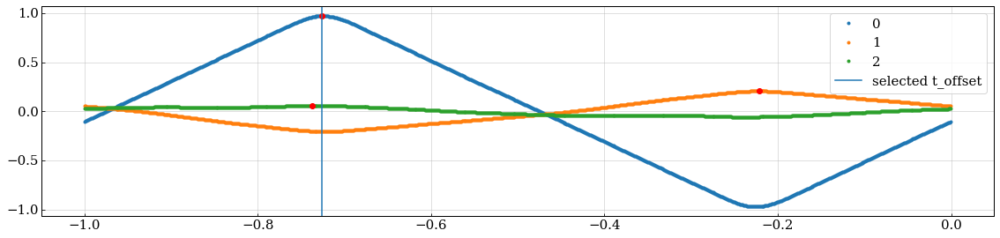

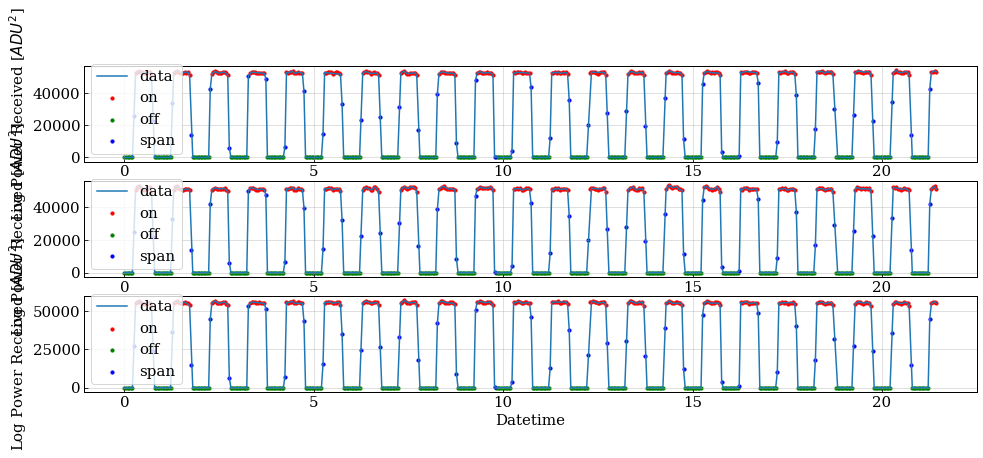

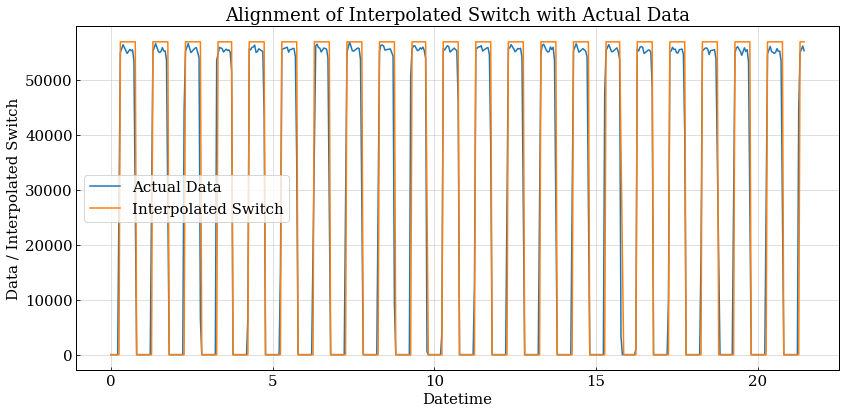

Frequency bin: 600
on_stats_f600_0702.csv


In [140]:
corr_on_stats(0)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [727. 810. 226.]
  --> t_deltas = [-0.273 -0.19  -0.774]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2728000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


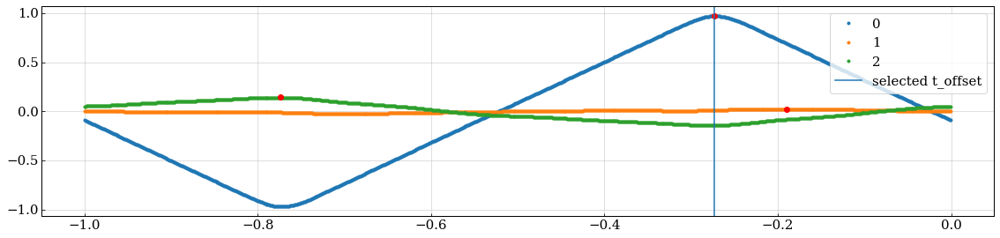

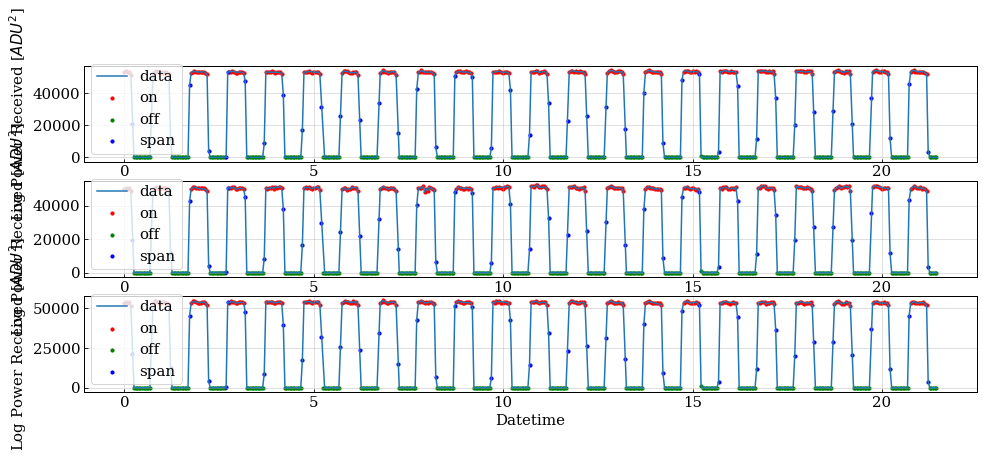

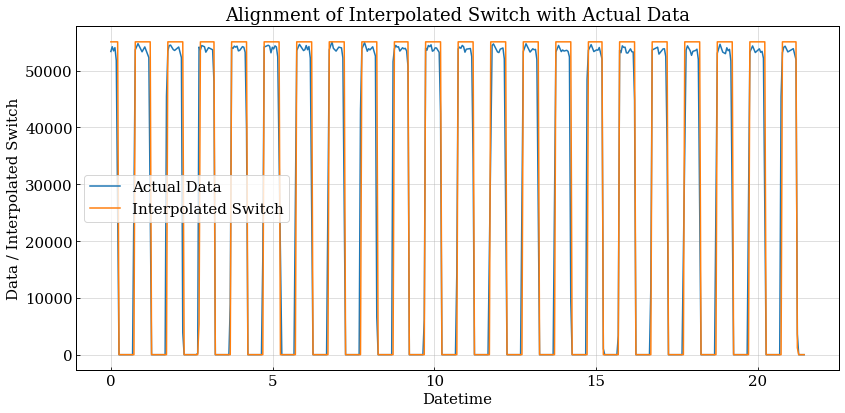

Frequency bin: 600
on_stats_f600_0702.csv


In [141]:
corr_on_stats(-10)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [303. 303. 803.]
  --> t_deltas = [-0.697 -0.697 -0.197]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6968000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


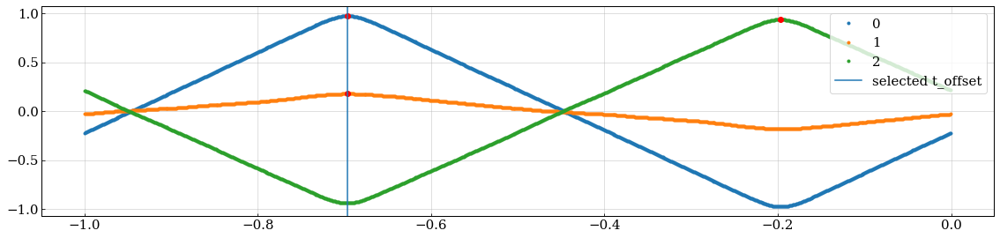

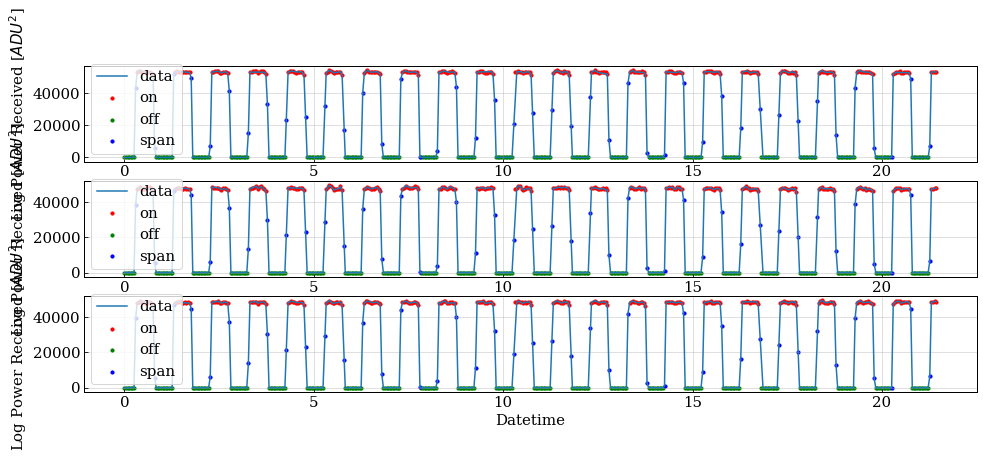

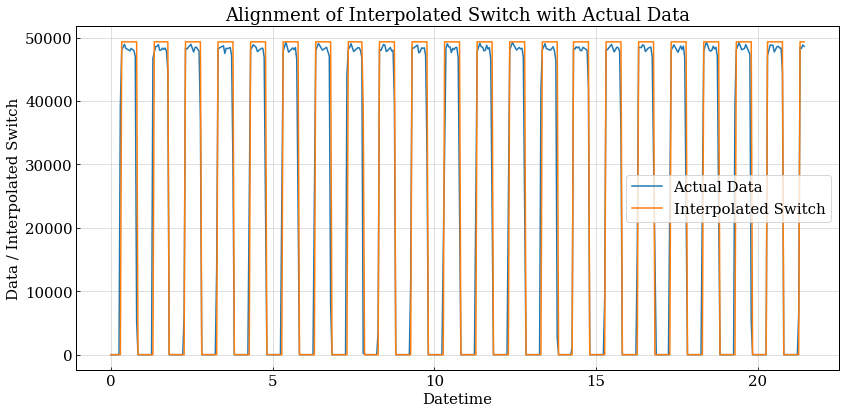

Frequency bin: 600
on_stats_f600_0702.csv


In [142]:
corr_on_stats(-20)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [140. 645. 636.]
  --> t_deltas = [-0.86  -0.355 -0.364]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8598000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


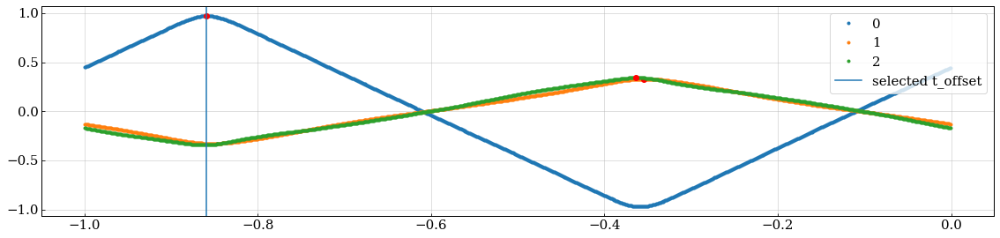

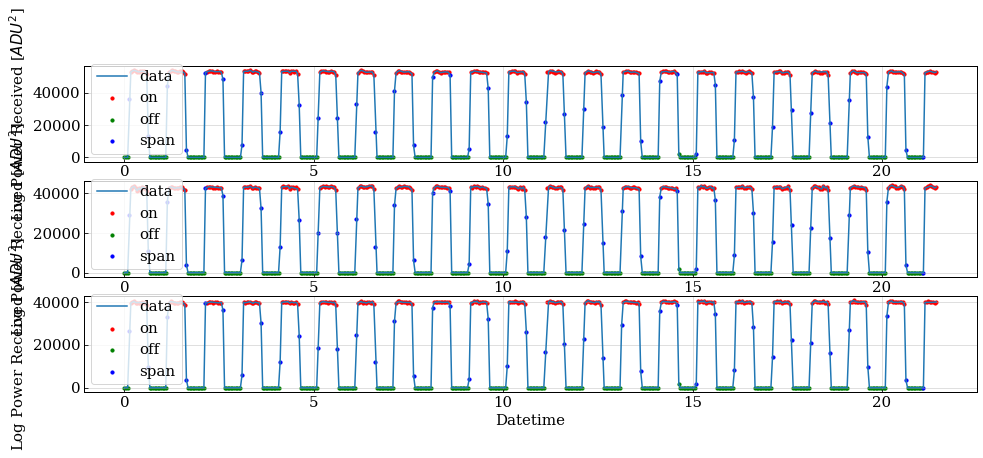

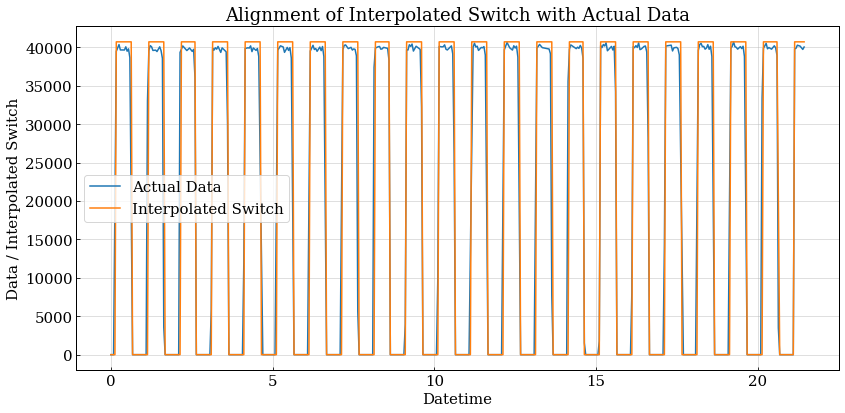

Frequency bin: 600
on_stats_f600_0702.csv


In [143]:
corr_on_stats(-30)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [718. 717. 215.]
  --> t_deltas = [-0.282 -0.283 -0.785]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2818000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


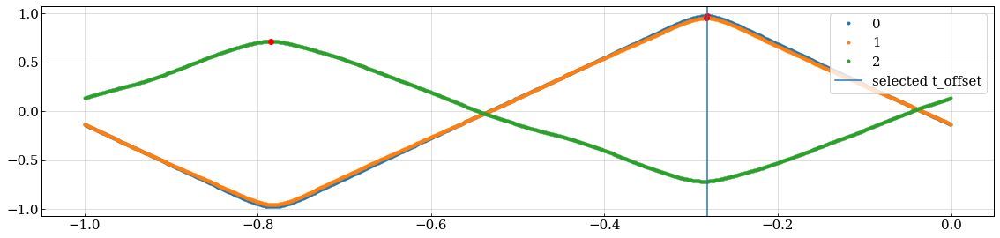

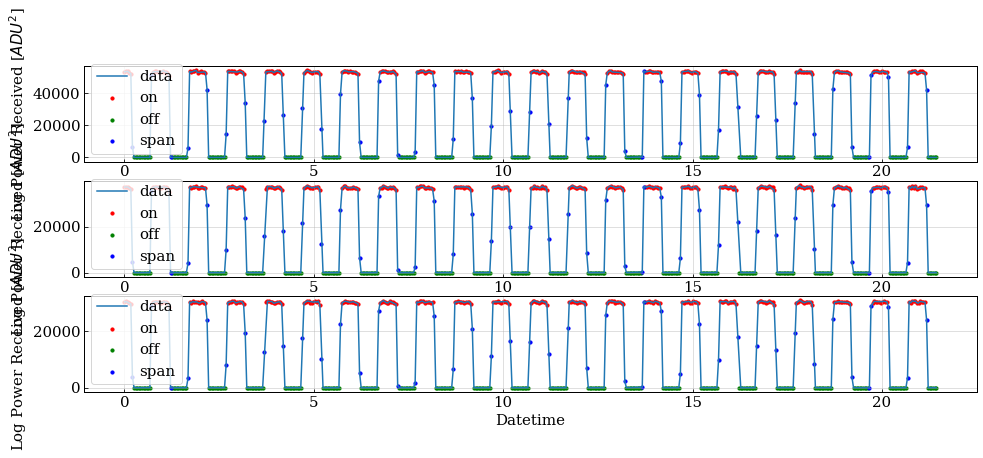

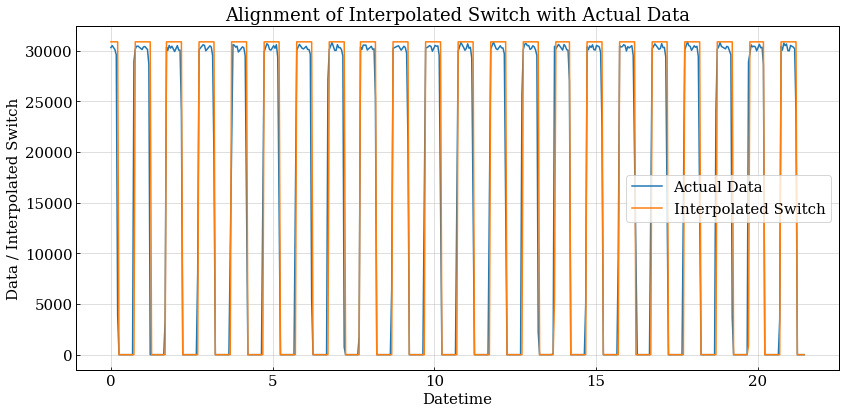

Frequency bin: 600
on_stats_f600_0702.csv


In [144]:
corr_on_stats(-40)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [555.  58. 557.]
  --> t_deltas = [-0.445 -0.942 -0.443]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4448000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


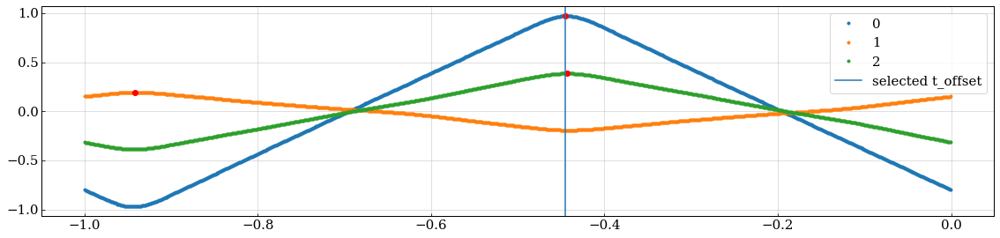

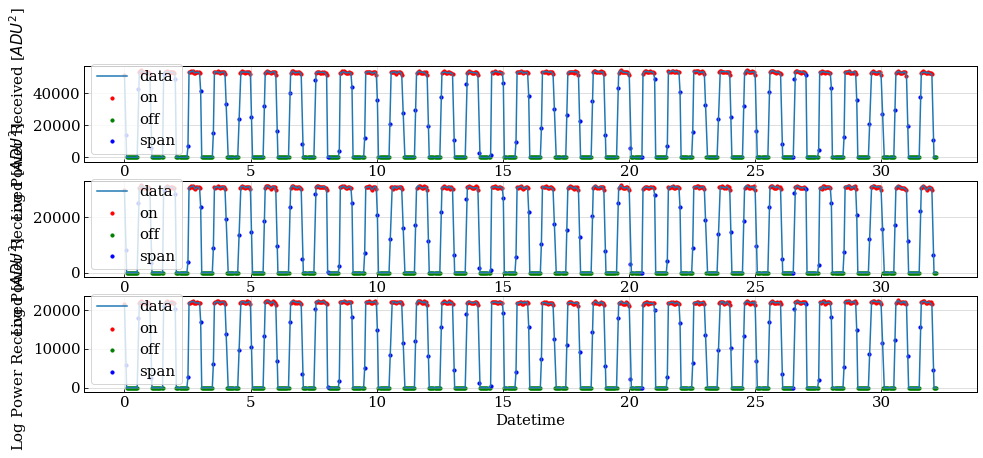

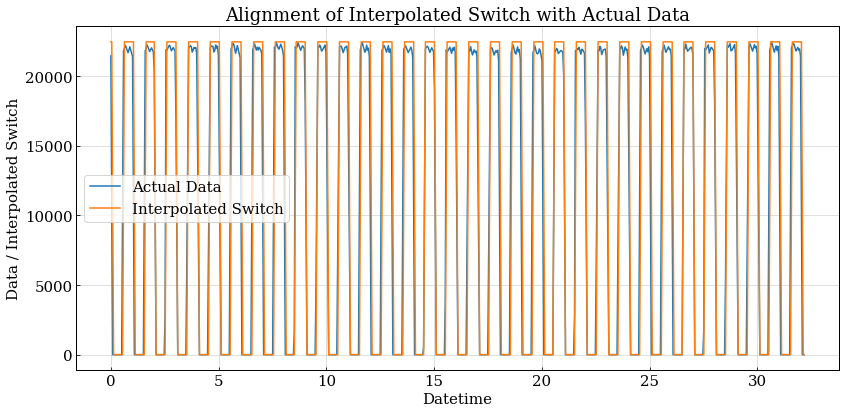

Frequency bin: 600
on_stats_f600_0702.csv


In [145]:
corr_on_stats(-50)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [656. 155. 655.]
  --> t_deltas = [-0.344 -0.845 -0.345]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3438000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


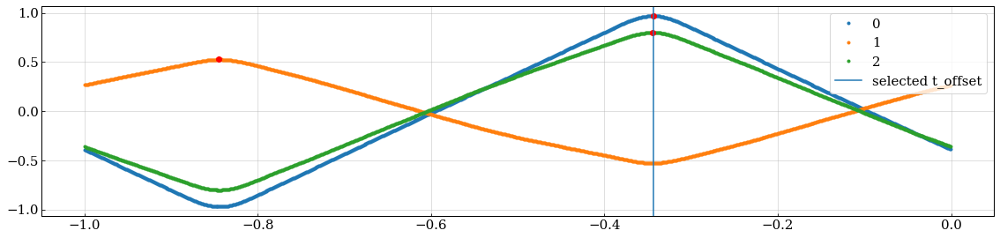

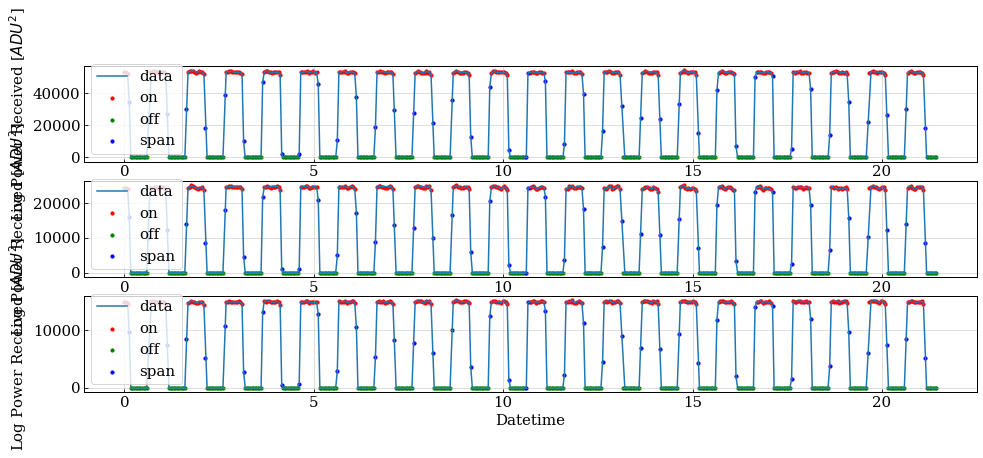

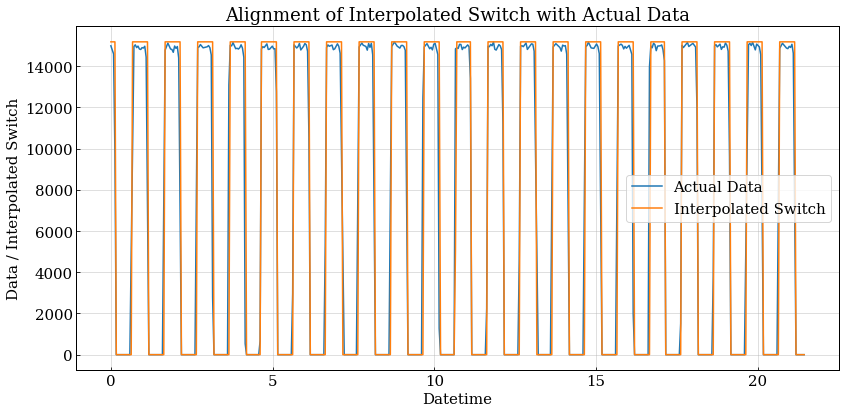

Frequency bin: 600
on_stats_f600_0702.csv


In [146]:
corr_on_stats(-60)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [757. 264. 760.]
  --> t_deltas = [-0.243 -0.736 -0.24 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2428000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


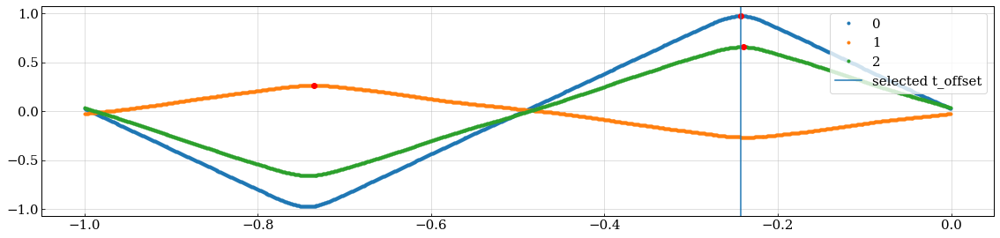

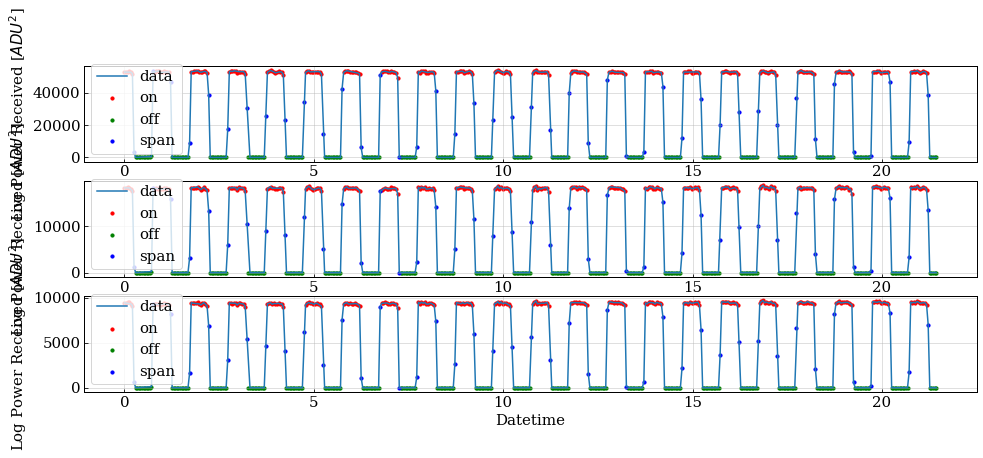

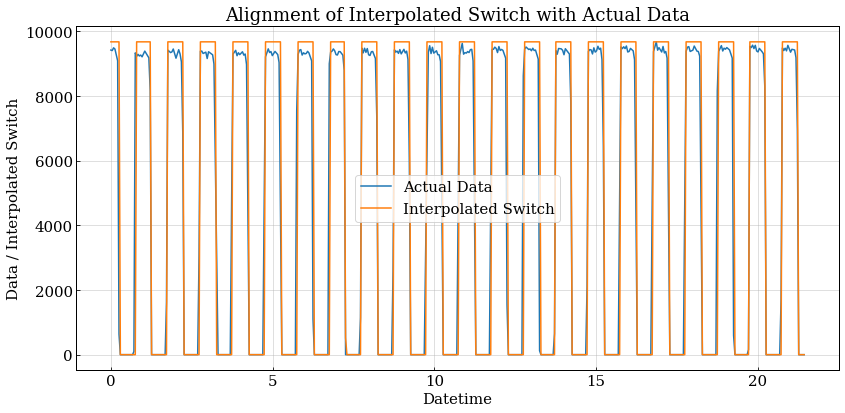

Frequency bin: 600
on_stats_f600_0702.csv


In [147]:
corr_on_stats(-70)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [334. 827. 333.]
  --> t_deltas = [-0.666 -0.173 -0.667]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6658000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


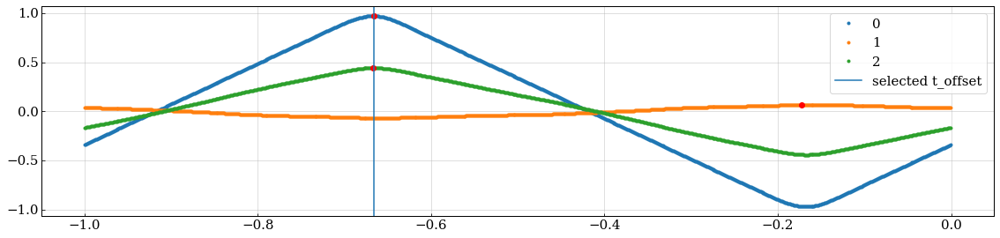

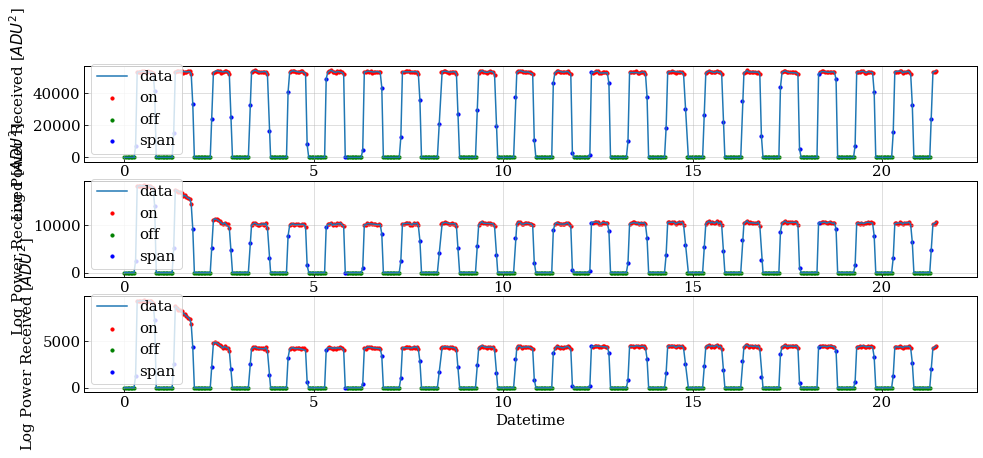

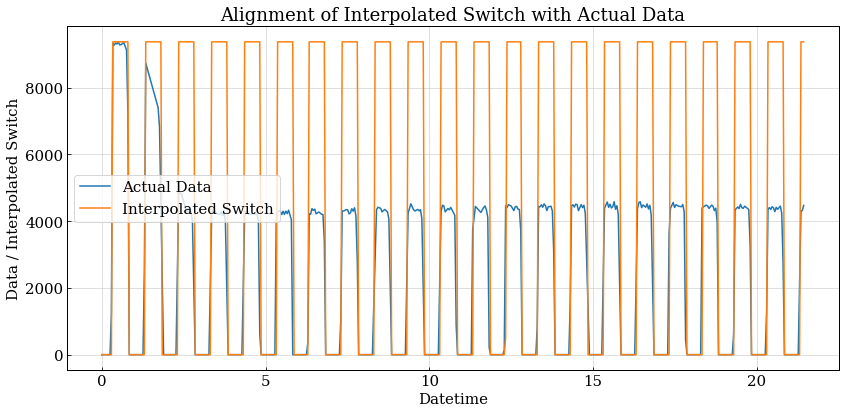

Frequency bin: 600
on_stats_f600_0702.csv


In [148]:
corr_on_stats(-80) #what happened here bro

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [694. 693. 694.]
  --> t_deltas = [-0.306 -0.307 -0.306]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3058000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


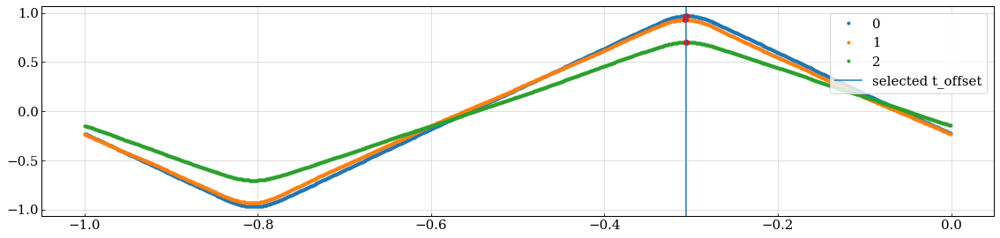

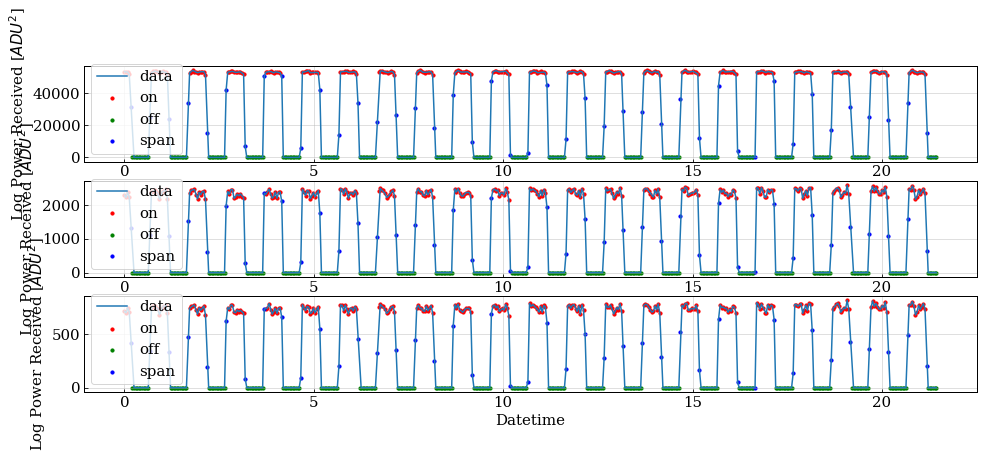

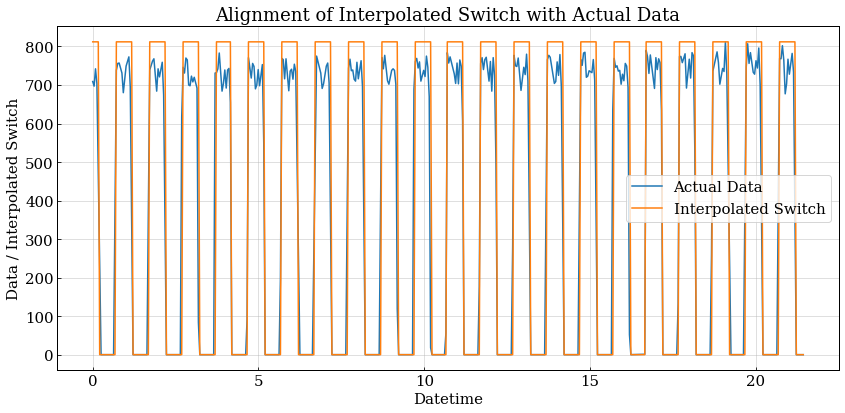

Frequency bin: 600
on_stats_f600_0702.csv


In [149]:
corr_on_stats(-90)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [534. 527. 535.]
  --> t_deltas = [-0.466 -0.473 -0.465]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4658000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


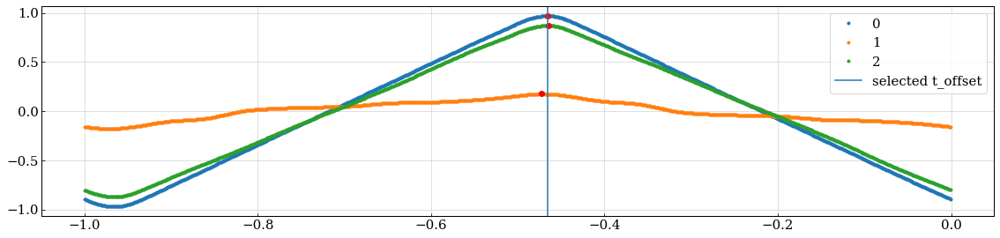

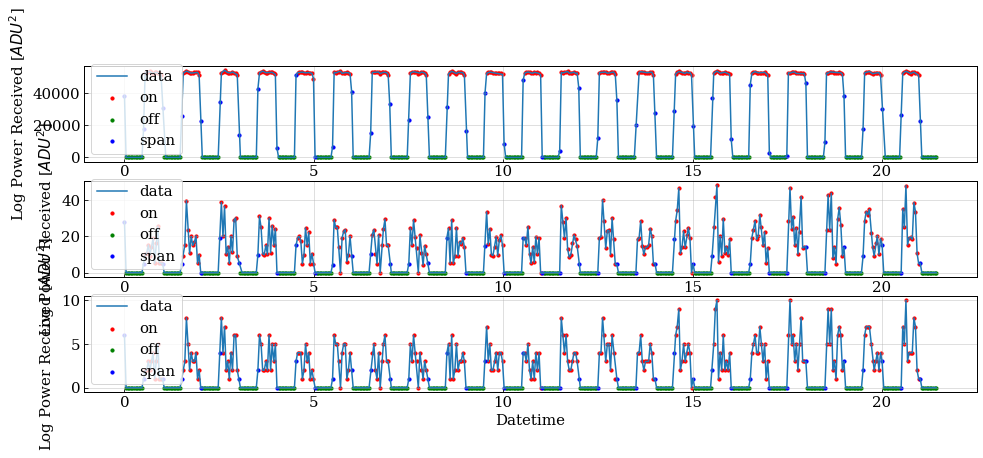

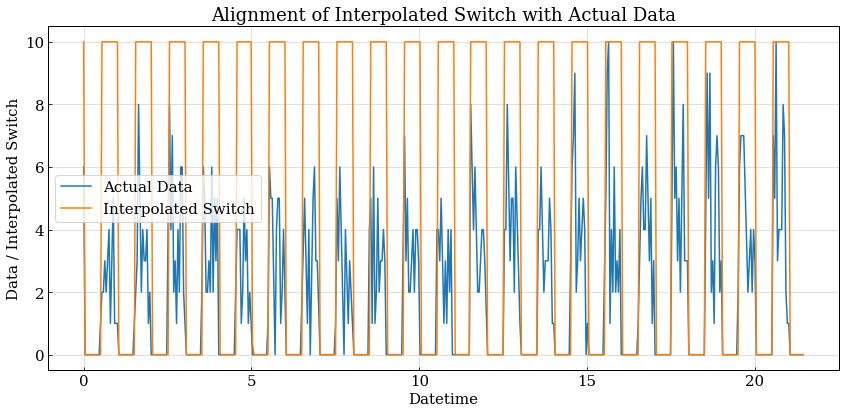

Frequency bin: 600
on_stats_f600_0702.csv


In [150]:
corr_on_stats(-100)

Done!!!!!!!


<ipython-input-3-35f56ef8a8f3>:34: RuntimeWarning: invalid value encountered in divide
  normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])


0 failed: -0.9997999999999999
1 failed: -0.9987999999999999
2 failed: -0.9977999999999999
3 failed: -0.9967999999999999
4 failed: -0.9957999999999999
5 failed: -0.9947999999999999
6 failed: -0.9937999999999999
7 failed: -0.9927999999999999
8 failed: -0.9917999999999999
9 failed: -0.9907999999999999
10 failed: -0.9897999999999999
11 failed: -0.9887999999999999
12 failed: -0.9877999999999999
13 failed: -0.9867999999999999
14 failed: -0.9857999999999999
15 failed: -0.9847999999999999
16 failed: -0.9837999999999999
17 failed: -0.9827999999999999
18 failed: -0.9817999999999999
19 failed: -0.9807999999999999
20 failed: -0.9797999999999999
21 failed: -0.9787999999999999
22 failed: -0.9777999999999999
23 failed: -0.9767999999999999
24 failed: -0.9757999999999999
25 failed: -0.9747999999999999
26 failed: -0.9737999999999999
27 failed: -0.9727999999999999
28 failed: -0.9717999999999999
29 failed: -0.9707999999999999
30 failed: -0.9697999999999999
31 failed: -0.9687999999999999
32 failed: -0.9677

<ipython-input-3-35f56ef8a8f3>:60: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [372.  nan 374.]
  --> t_deltas = [-0.628    nan -0.626]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6278000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


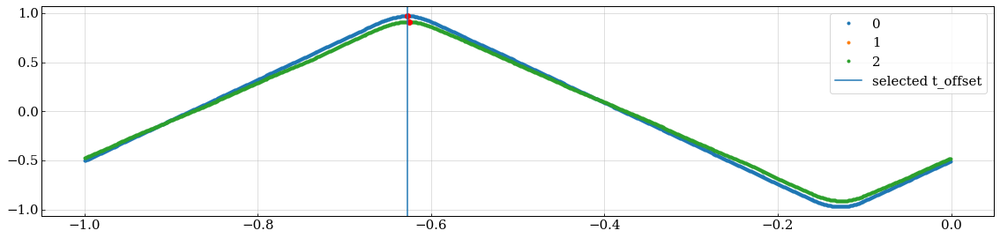

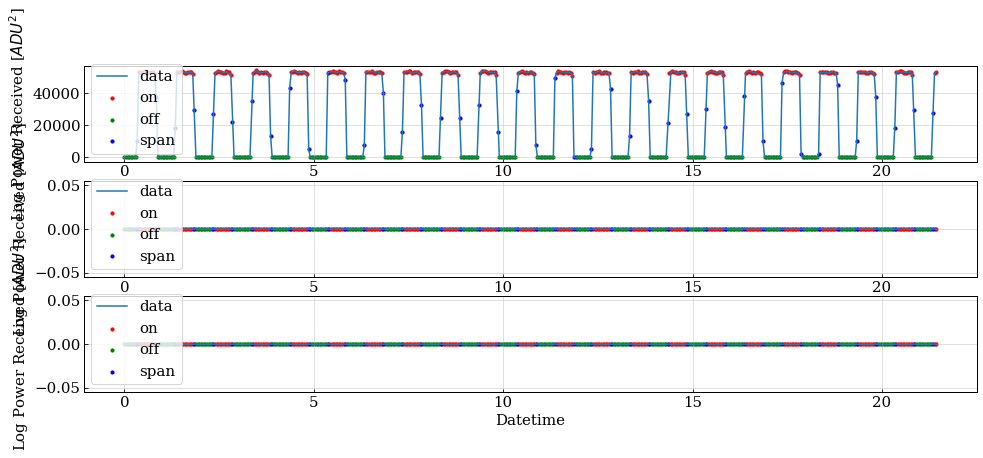

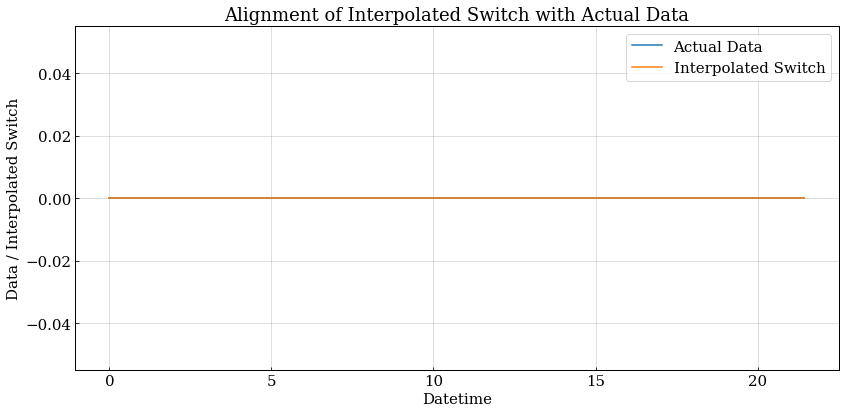

Frequency bin: 600
on_stats_f600_0702.csv


In [151]:
corr_on_stats(-110)

Done!!!!!!!


<ipython-input-3-35f56ef8a8f3>:34: RuntimeWarning: invalid value encountered in divide
  normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])


0 failed: -0.9987999999999999
1 failed: -0.9977999999999999
2 failed: -0.9967999999999999
3 failed: -0.9957999999999999
4 failed: -0.9947999999999999
5 failed: -0.9937999999999999
6 failed: -0.9927999999999999
7 failed: -0.9917999999999999
8 failed: -0.9907999999999999
9 failed: -0.9897999999999999
10 failed: -0.9887999999999999
11 failed: -0.9877999999999999
12 failed: -0.9867999999999999
13 failed: -0.9857999999999999
14 failed: -0.9847999999999999
15 failed: -0.9837999999999999
16 failed: -0.9827999999999999
17 failed: -0.9817999999999999
18 failed: -0.9807999999999999
19 failed: -0.9797999999999999
20 failed: -0.9787999999999999
21 failed: -0.9777999999999999
22 failed: -0.9767999999999999
23 failed: -0.9757999999999999
24 failed: -0.9747999999999999
25 failed: -0.9737999999999999
26 failed: -0.9727999999999999
27 failed: -0.9717999999999999
28 failed: -0.9707999999999999
29 failed: -0.9697999999999999
30 failed: -0.9687999999999999
31 failed: -0.9677999999999999
32 failed: -0.9667

<ipython-input-3-35f56ef8a8f3>:60: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [957.  nan 957.]
  --> t_deltas = [-0.042    nan -0.042]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0418000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


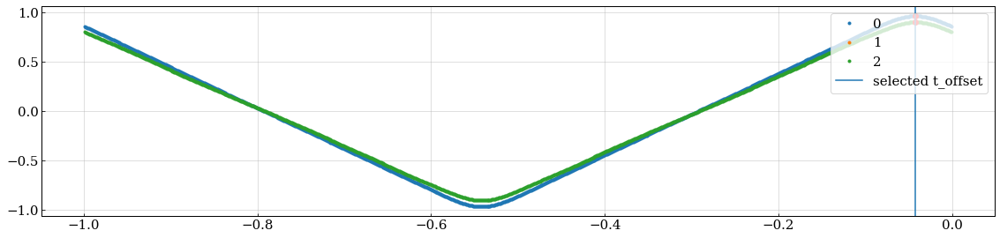

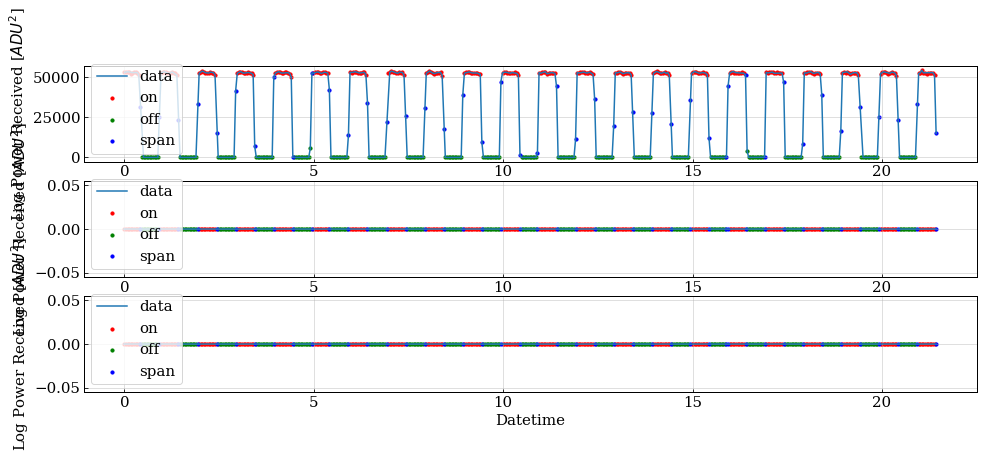

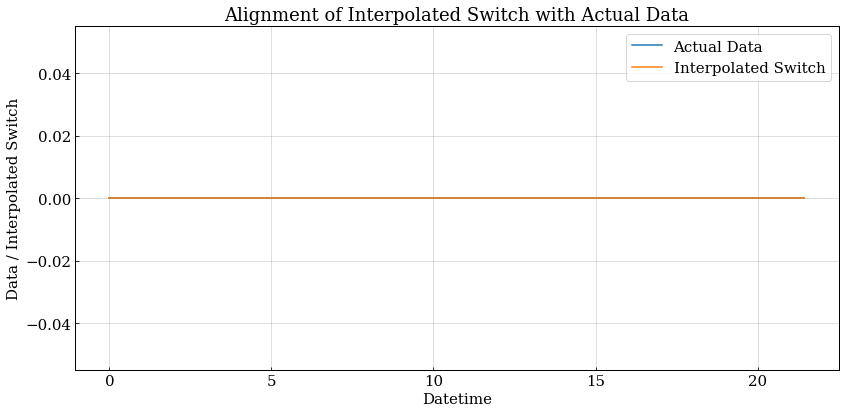

Frequency bin: 600
on_stats_f600_0702.csv


In [152]:
corr_on_stats(-120,period=0.9988e6)

Done!!!!!!!


<ipython-input-3-35f56ef8a8f3>:34: RuntimeWarning: invalid value encountered in divide
  normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])


0 failed: -0.9997999999999999
1 failed: -0.9987999999999999
2 failed: -0.9977999999999999
3 failed: -0.9967999999999999
4 failed: -0.9957999999999999
5 failed: -0.9947999999999999
6 failed: -0.9937999999999999
7 failed: -0.9927999999999999
8 failed: -0.9917999999999999
9 failed: -0.9907999999999999
10 failed: -0.9897999999999999
11 failed: -0.9887999999999999
12 failed: -0.9877999999999999
13 failed: -0.9867999999999999
14 failed: -0.9857999999999999
15 failed: -0.9847999999999999
16 failed: -0.9837999999999999
17 failed: -0.9827999999999999
18 failed: -0.9817999999999999
19 failed: -0.9807999999999999
20 failed: -0.9797999999999999
21 failed: -0.9787999999999999
22 failed: -0.9777999999999999
23 failed: -0.9767999999999999
24 failed: -0.9757999999999999
25 failed: -0.9747999999999999
26 failed: -0.9737999999999999
27 failed: -0.9727999999999999
28 failed: -0.9717999999999999
29 failed: -0.9707999999999999
30 failed: -0.9697999999999999
31 failed: -0.9687999999999999
32 failed: -0.9677

<ipython-input-3-35f56ef8a8f3>:60: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [785.  nan 783.]
  --> t_deltas = [-0.215    nan -0.217]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2148000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


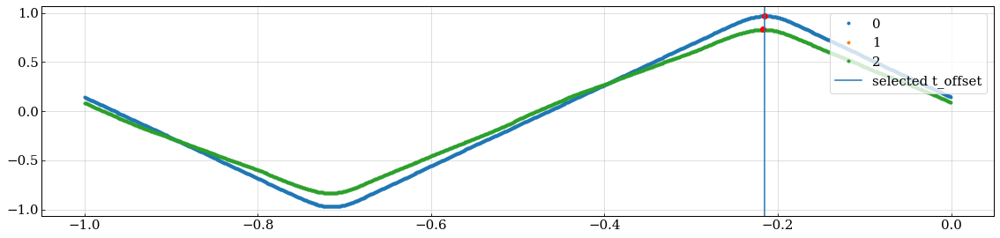

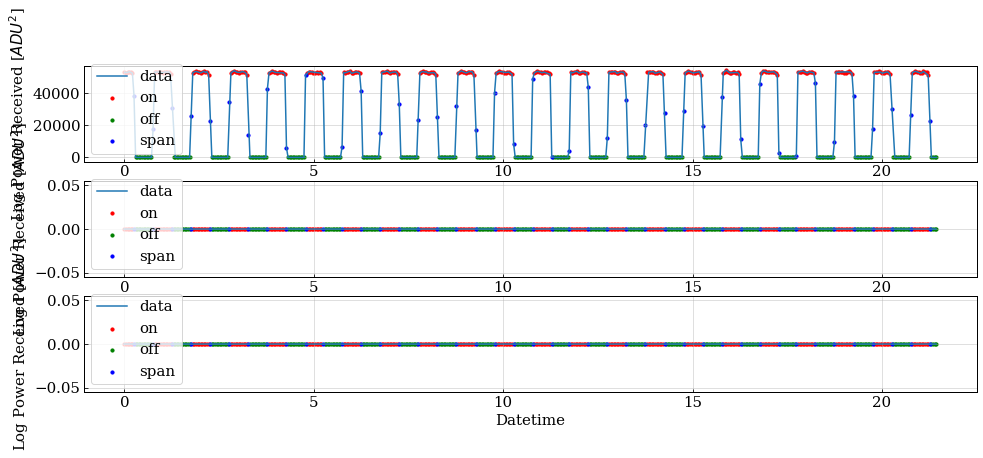

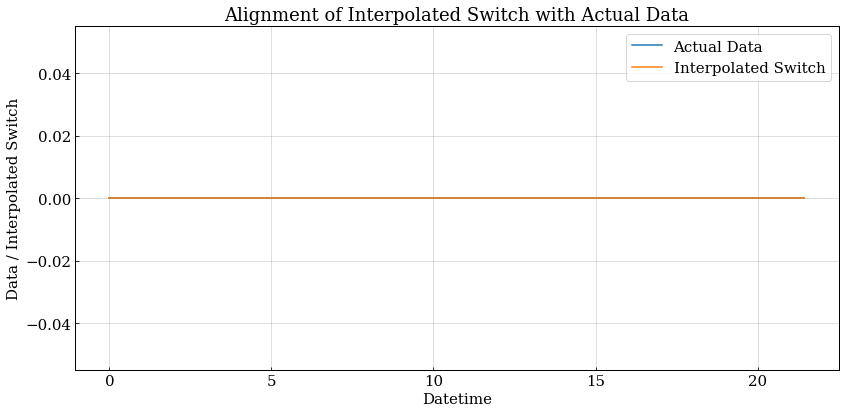

Frequency bin: 600
on_stats_f600_0702.csv


In [153]:
corr_on_stats(-130)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [624.  20. 625.]
  --> t_deltas = [-0.376 -0.98  -0.375]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3758000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


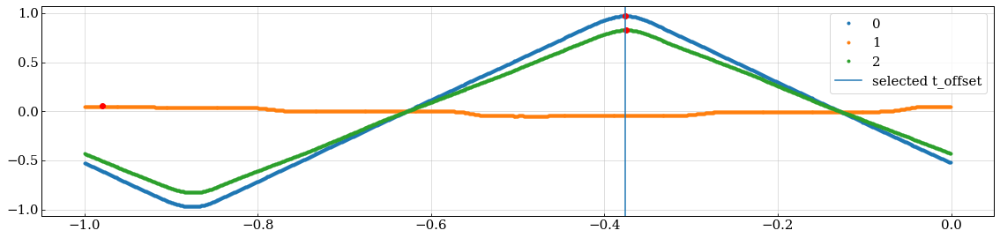

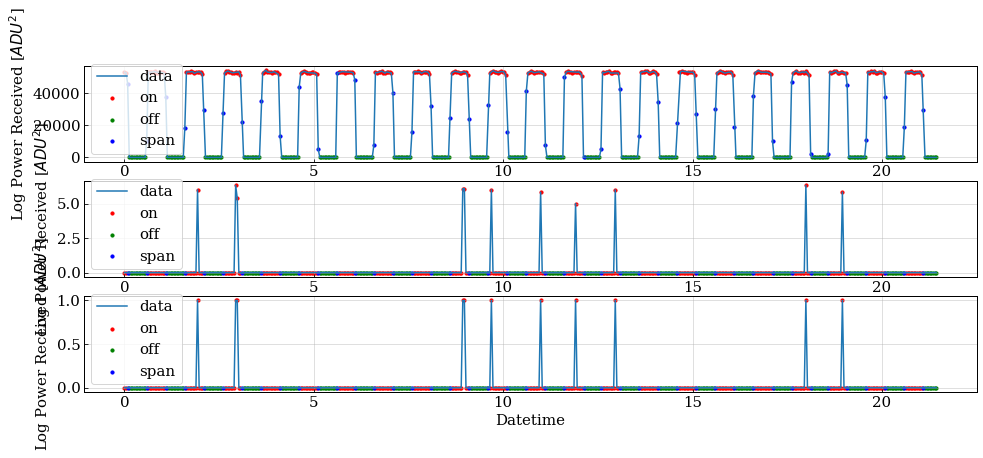

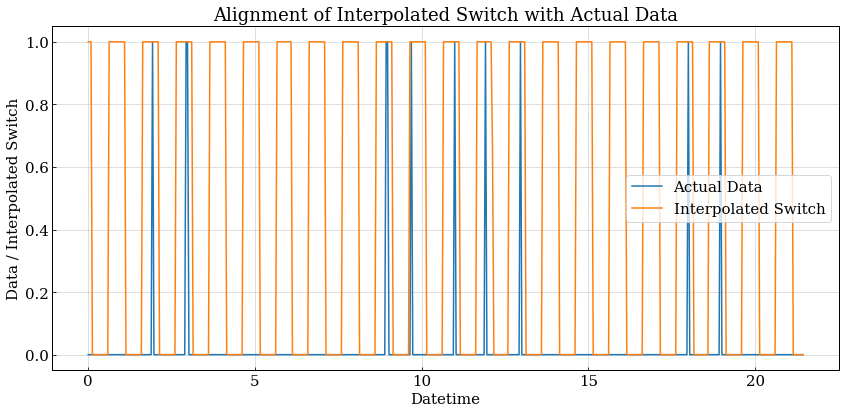

Frequency bin: 600
on_stats_f600_0702.csv


In [154]:
corr_on_stats(-140)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [772. 280. 772.]
  --> t_deltas = [-0.228 -0.72  -0.228]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2278000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


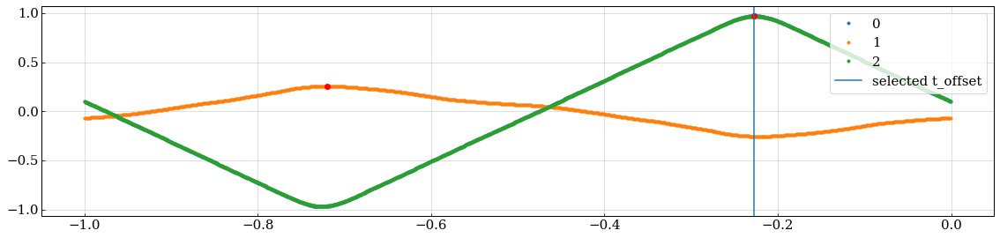

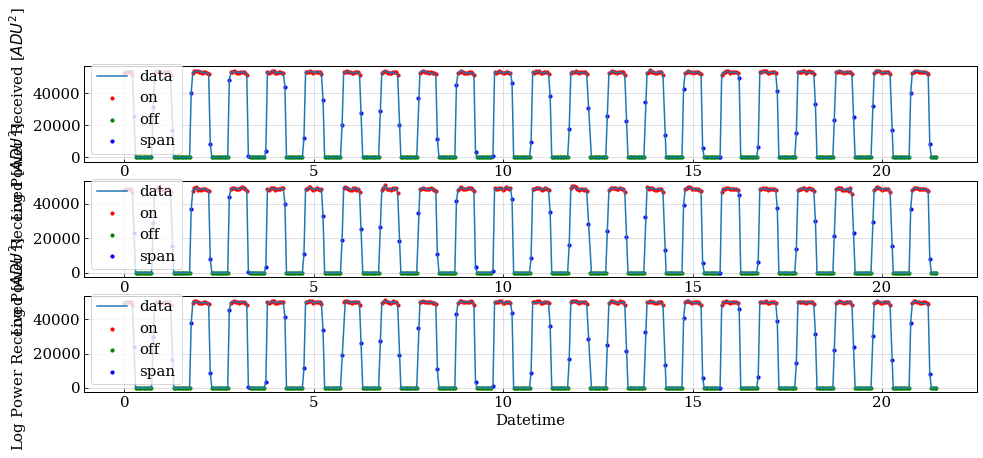

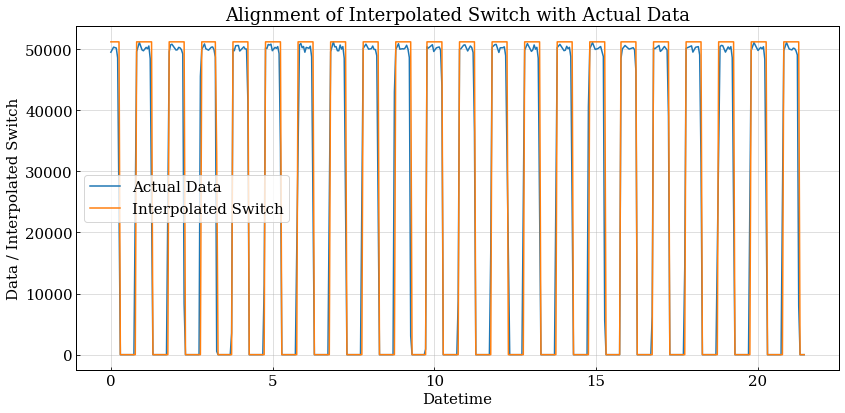

Frequency bin: 600
on_stats_f600_0702.csv


In [155]:
corr_on_stats(10)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 88. 427. 588.]
  --> t_deltas = [-0.912 -0.573 -0.412]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9118000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


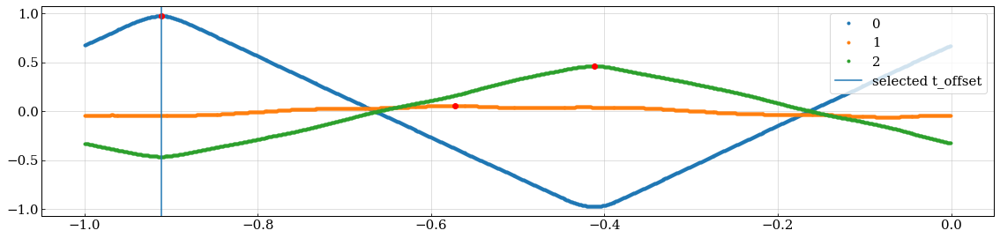

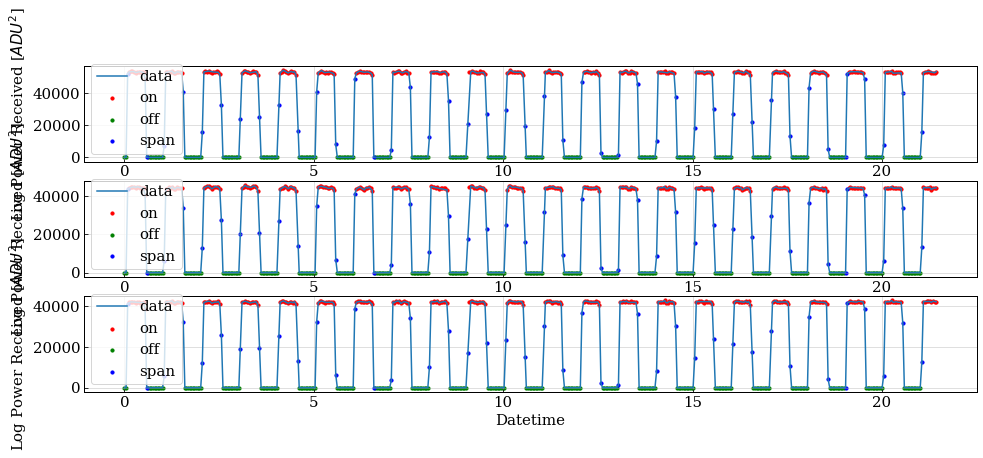

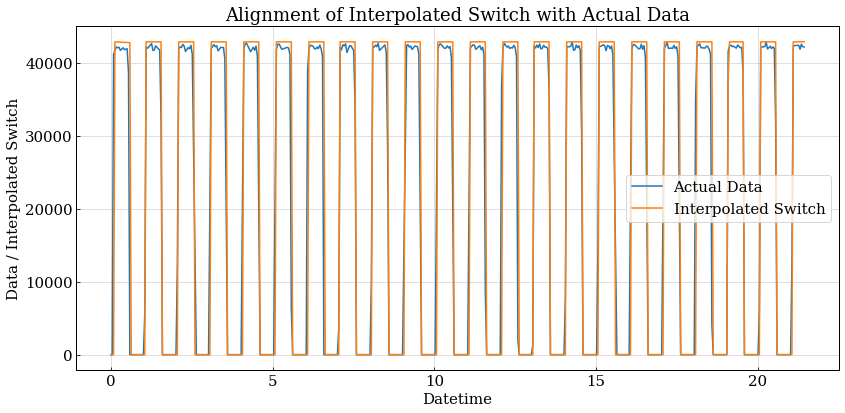

Frequency bin: 600
on_stats_f600_0702.csv


In [7]:
corr_on_stats(20)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [664. 656. 665.]
  --> t_deltas = [-0.336 -0.344 -0.335]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3358000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


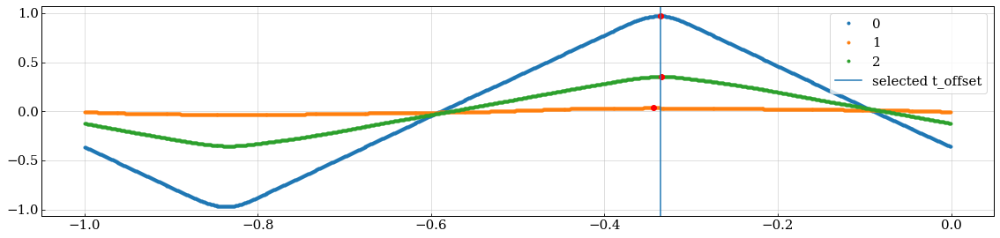

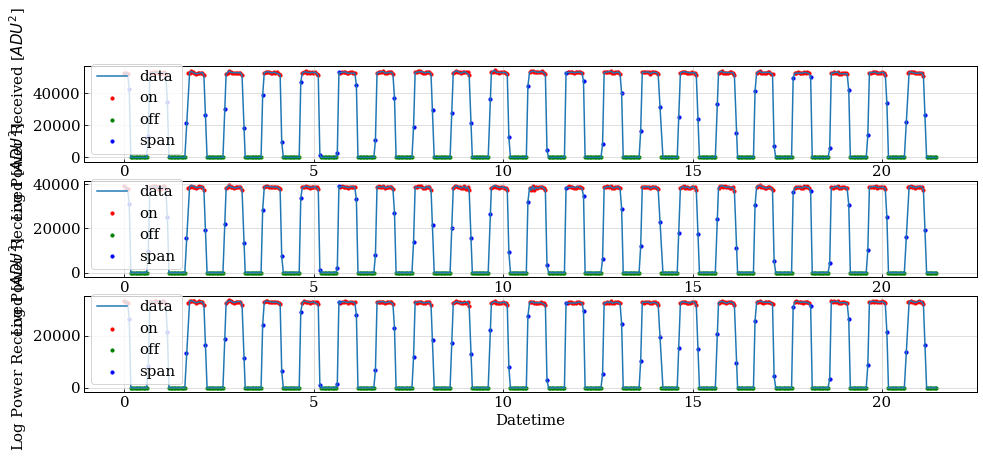

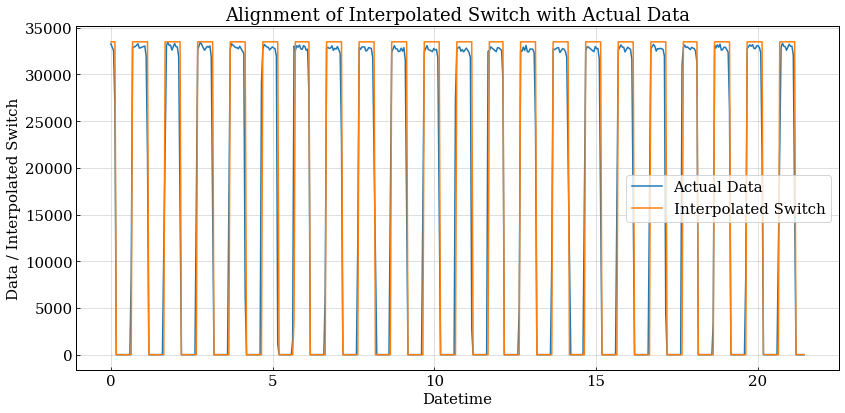

Frequency bin: 600
on_stats_f600_0702.csv


In [8]:
corr_on_stats(30)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [290. 293. 288.]
  --> t_deltas = [-0.71  -0.707 -0.712]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7098000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


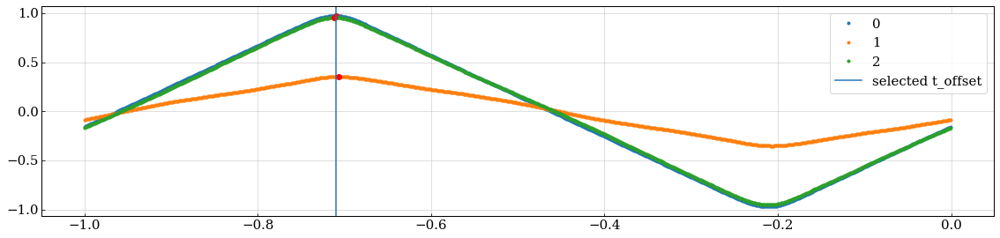

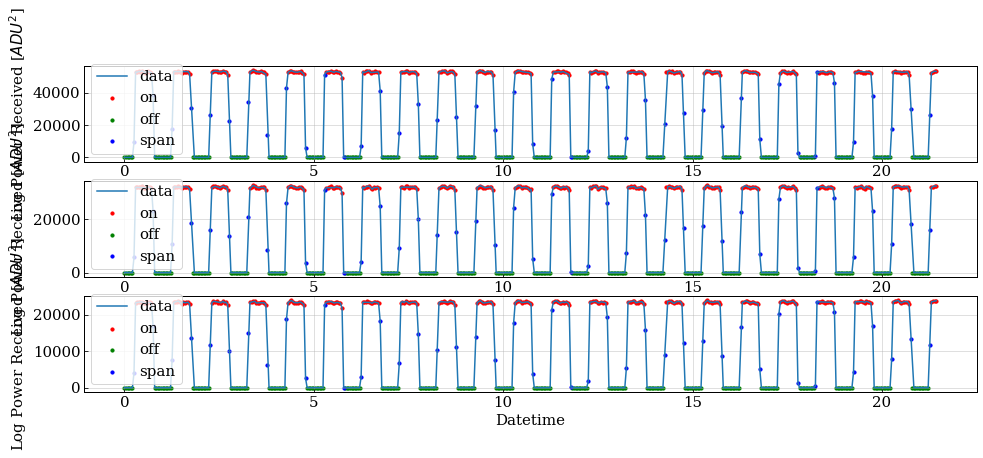

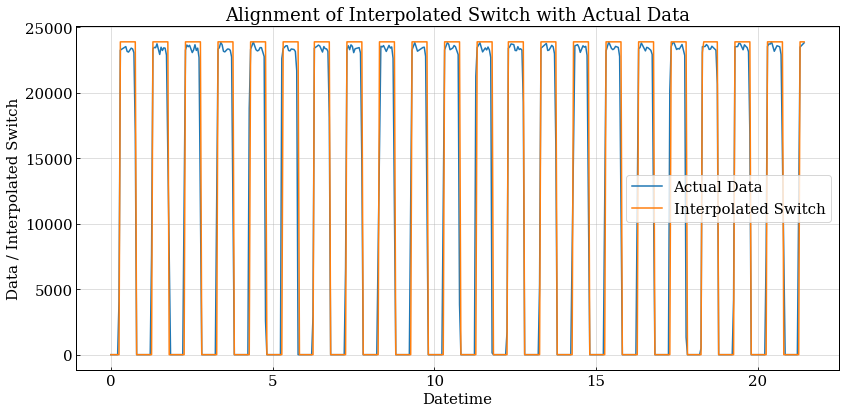

Frequency bin: 600
on_stats_f600_0702.csv


In [9]:
corr_on_stats(40)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [127. 126. 626.]
  --> t_deltas = [-0.873 -0.874 -0.374]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8728000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


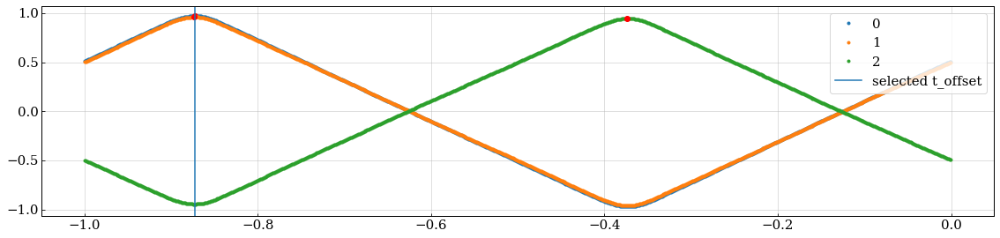

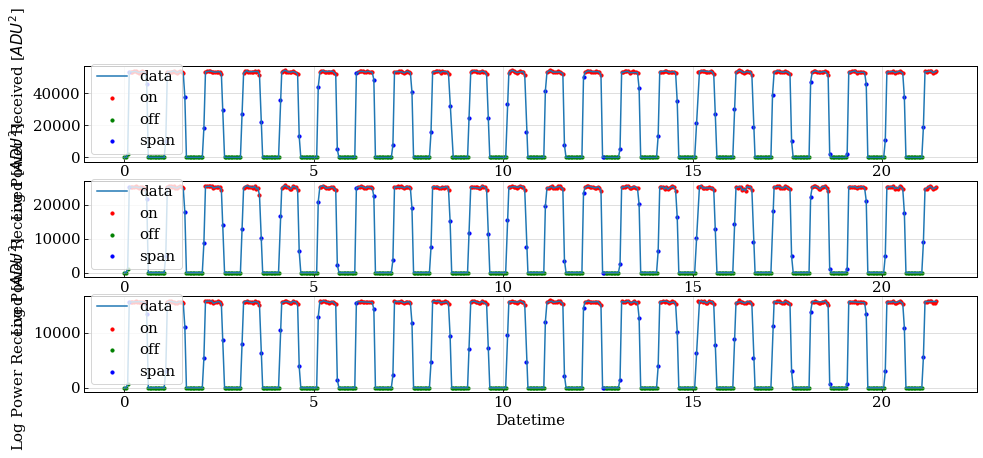

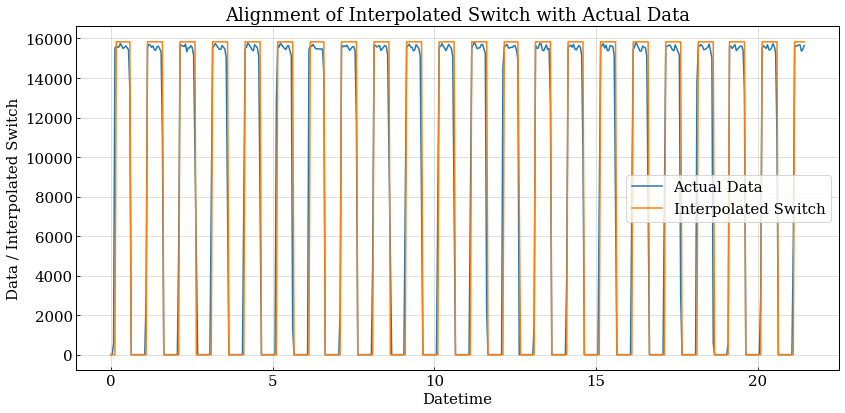

Frequency bin: 600
on_stats_f600_0702.csv


In [10]:
corr_on_stats(50)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [226. 732. 227.]
  --> t_deltas = [-0.774 -0.268 -0.773]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7738000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


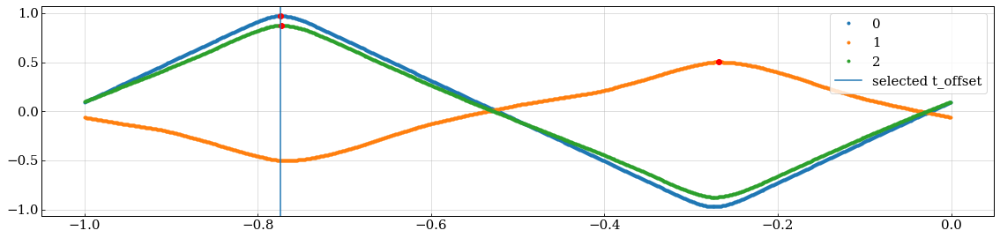

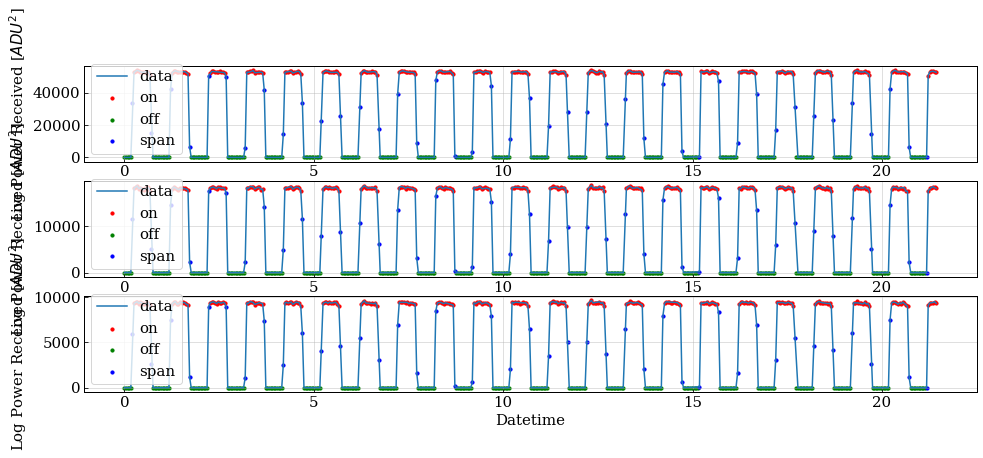

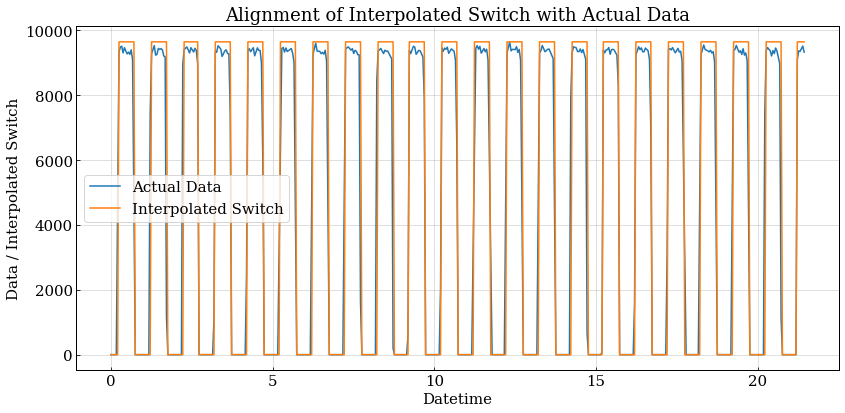

Frequency bin: 600
on_stats_f600_0702.csv


In [11]:
corr_on_stats(60)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 64. 561.  62.]
  --> t_deltas = [-0.936 -0.439 -0.938]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9358000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


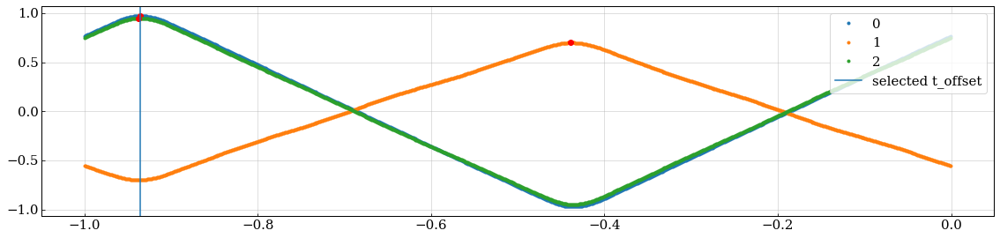

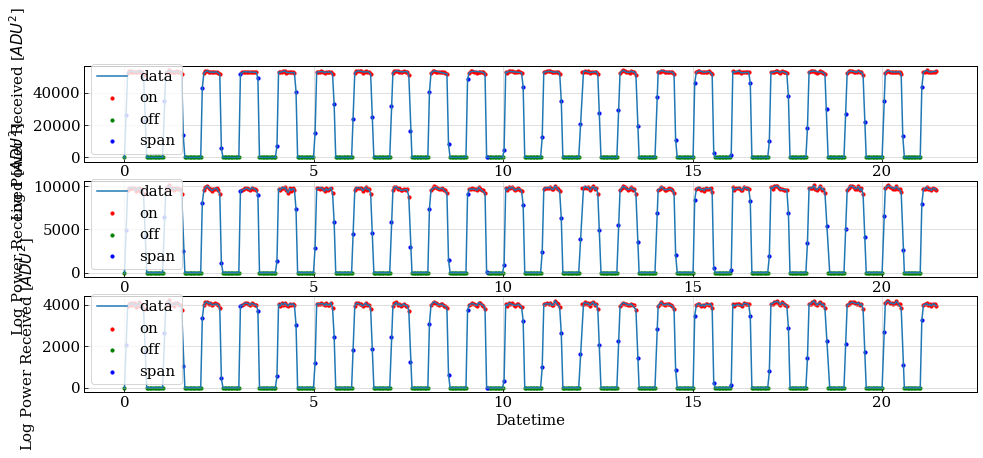

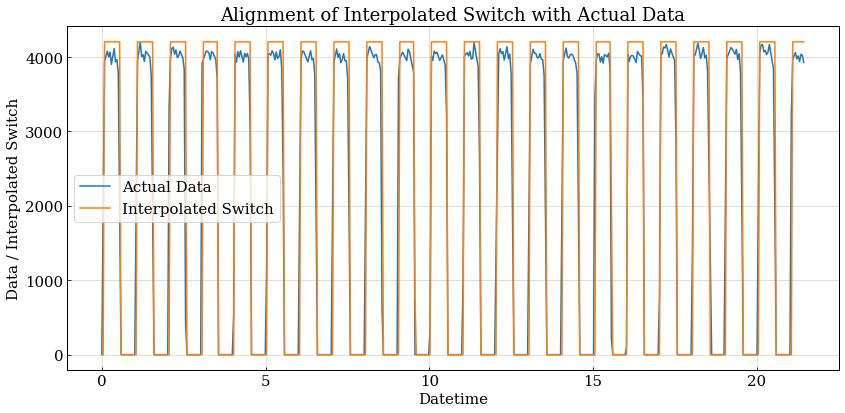

Frequency bin: 600
on_stats_f600_0702.csv


In [12]:
corr_on_stats(70)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [167. 164. 168.]
  --> t_deltas = [-0.833 -0.836 -0.832]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8328000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


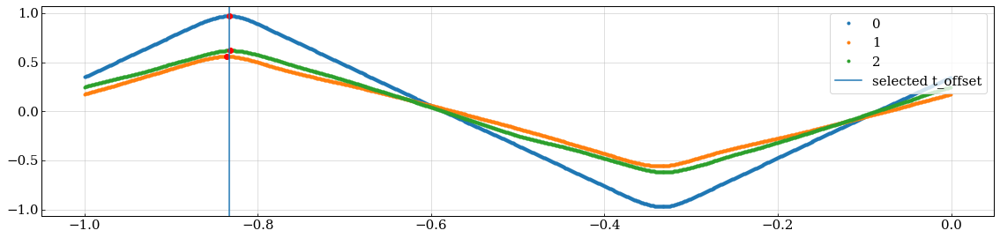

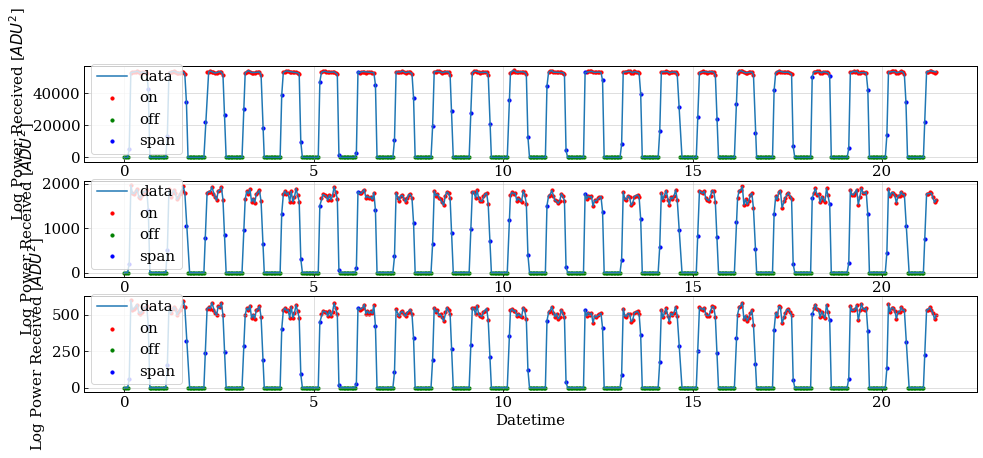

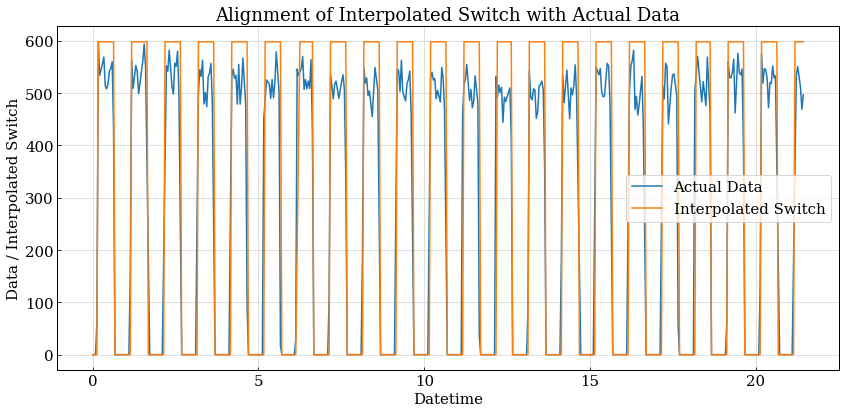

Frequency bin: 600
on_stats_f600_0702.csv


In [13]:
corr_on_stats(80)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [265. 437. 264.]
  --> t_deltas = [-0.735 -0.563 -0.736]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7348000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


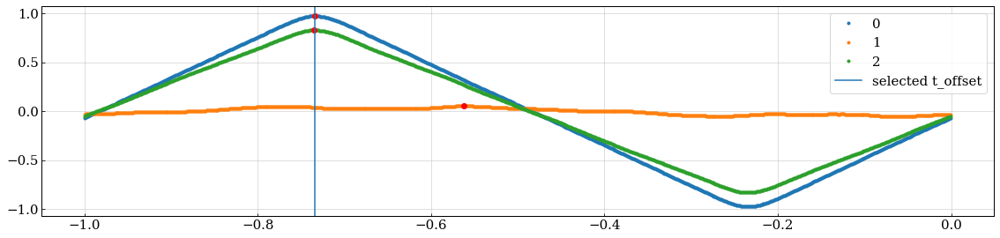

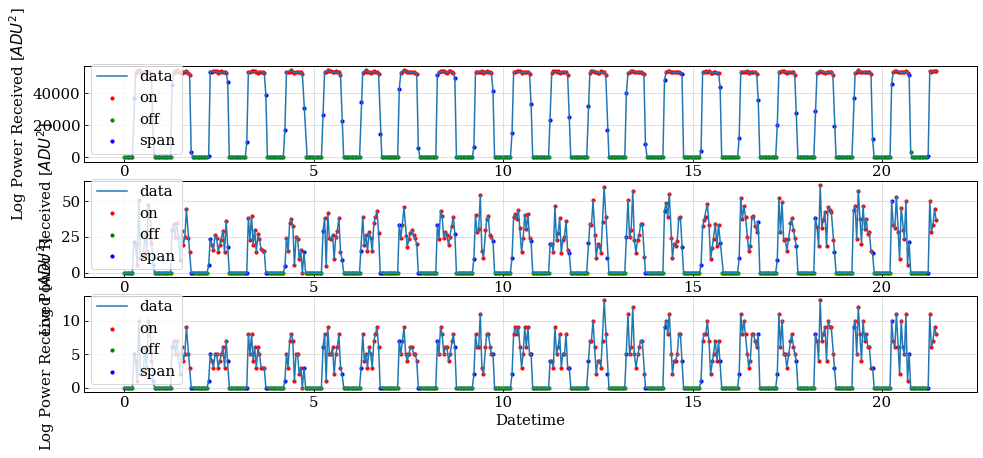

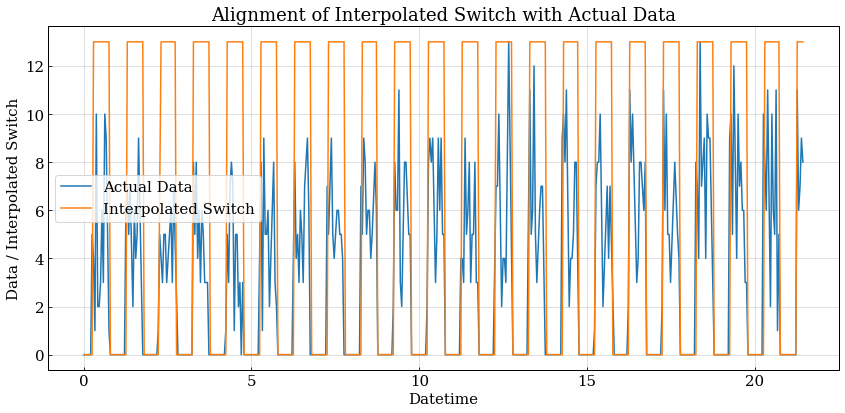

Frequency bin: 600
on_stats_f600_0702.csv


In [14]:
corr_on_stats(90)

Done!!!!!!!


<ipython-input-4-35f56ef8a8f3>:34: RuntimeWarning: invalid value encountered in divide
  normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])


0 failed: -0.9997999999999999
1 failed: -0.9987999999999999
2 failed: -0.9977999999999999
3 failed: -0.9967999999999999
4 failed: -0.9957999999999999
5 failed: -0.9947999999999999
6 failed: -0.9937999999999999
7 failed: -0.9927999999999999
8 failed: -0.9917999999999999
9 failed: -0.9907999999999999
10 failed: -0.9897999999999999
11 failed: -0.9887999999999999
12 failed: -0.9877999999999999
13 failed: -0.9867999999999999
14 failed: -0.9857999999999999
15 failed: -0.9847999999999999
16 failed: -0.9837999999999999
17 failed: -0.9827999999999999
18 failed: -0.9817999999999999
19 failed: -0.9807999999999999
20 failed: -0.9797999999999999
21 failed: -0.9787999999999999
22 failed: -0.9777999999999999
23 failed: -0.9767999999999999
24 failed: -0.9757999999999999
25 failed: -0.9747999999999999
26 failed: -0.9737999999999999
27 failed: -0.9727999999999999
28 failed: -0.9717999999999999
29 failed: -0.9707999999999999
30 failed: -0.9697999999999999
31 failed: -0.9687999999999999
32 failed: -0.9677

<ipython-input-4-35f56ef8a8f3>:60: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [367.  nan 367.]
  --> t_deltas = [-0.633    nan -0.633]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6328000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


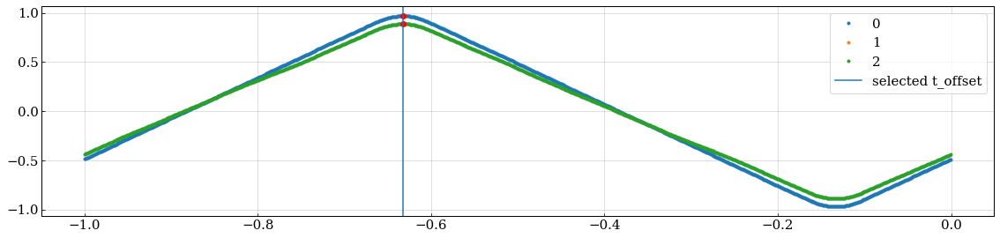

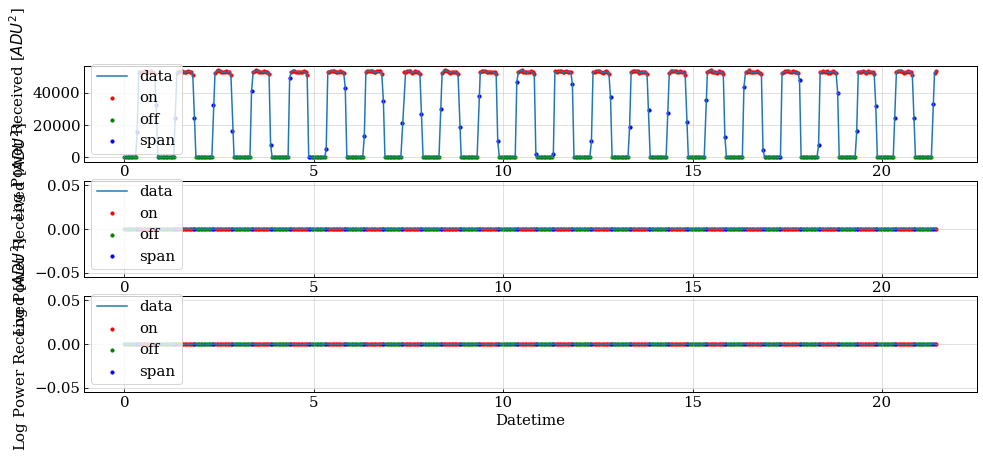

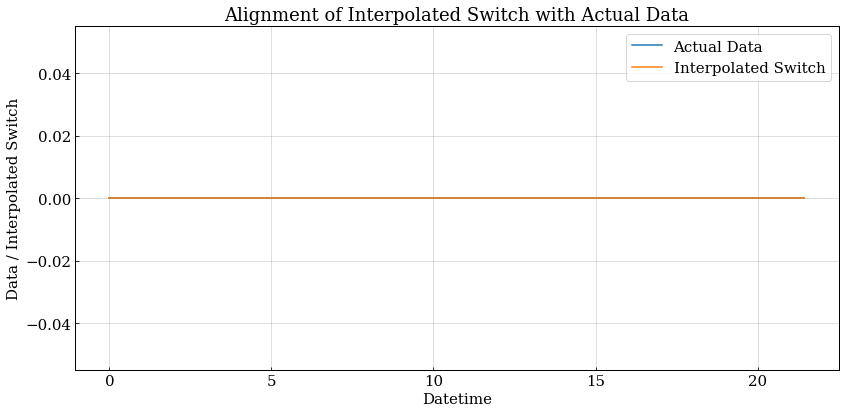

Frequency bin: 600
on_stats_f600_0702.csv


In [15]:
corr_on_stats(100)

Done!!!!!!!


<ipython-input-4-35f56ef8a8f3>:34: RuntimeWarning: invalid value encountered in divide
  normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])


0 failed: -0.9997999999999999
1 failed: -0.9987999999999999
2 failed: -0.9977999999999999
3 failed: -0.9967999999999999
4 failed: -0.9957999999999999
5 failed: -0.9947999999999999
6 failed: -0.9937999999999999
7 failed: -0.9927999999999999
8 failed: -0.9917999999999999
9 failed: -0.9907999999999999
10 failed: -0.9897999999999999
11 failed: -0.9887999999999999
12 failed: -0.9877999999999999
13 failed: -0.9867999999999999
14 failed: -0.9857999999999999
15 failed: -0.9847999999999999
16 failed: -0.9837999999999999
17 failed: -0.9827999999999999
18 failed: -0.9817999999999999
19 failed: -0.9807999999999999
20 failed: -0.9797999999999999
21 failed: -0.9787999999999999
22 failed: -0.9777999999999999
23 failed: -0.9767999999999999
24 failed: -0.9757999999999999
25 failed: -0.9747999999999999
26 failed: -0.9737999999999999
27 failed: -0.9727999999999999
28 failed: -0.9717999999999999
29 failed: -0.9707999999999999
30 failed: -0.9697999999999999
31 failed: -0.9687999999999999
32 failed: -0.9677

<ipython-input-4-35f56ef8a8f3>:60: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [206.  nan 207.]
  --> t_deltas = [-0.794    nan -0.793]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7938000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


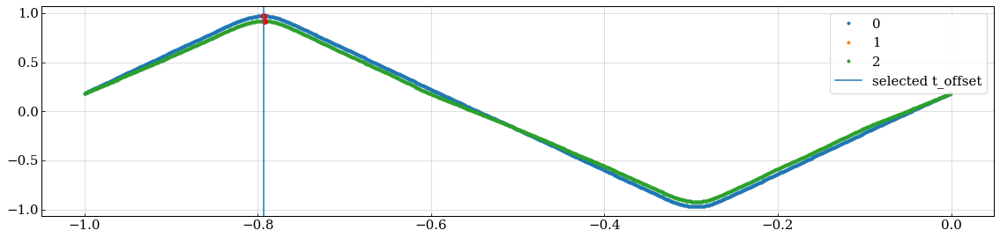

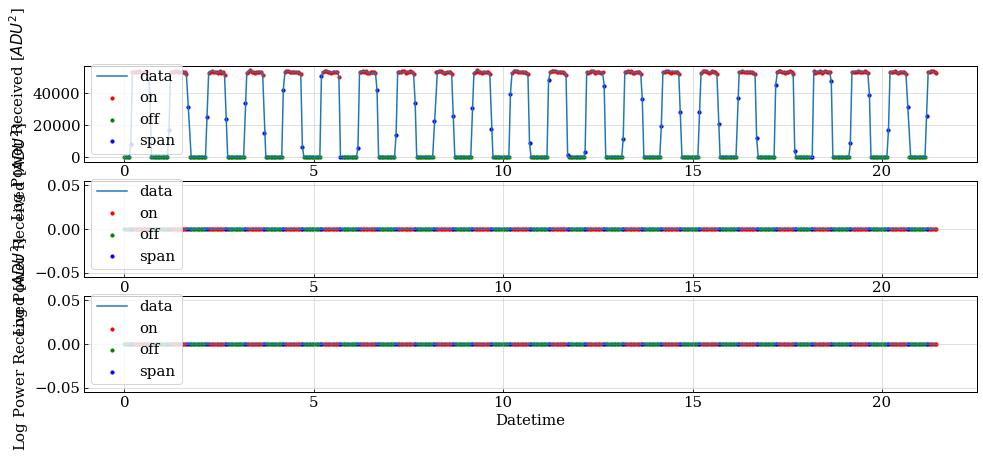

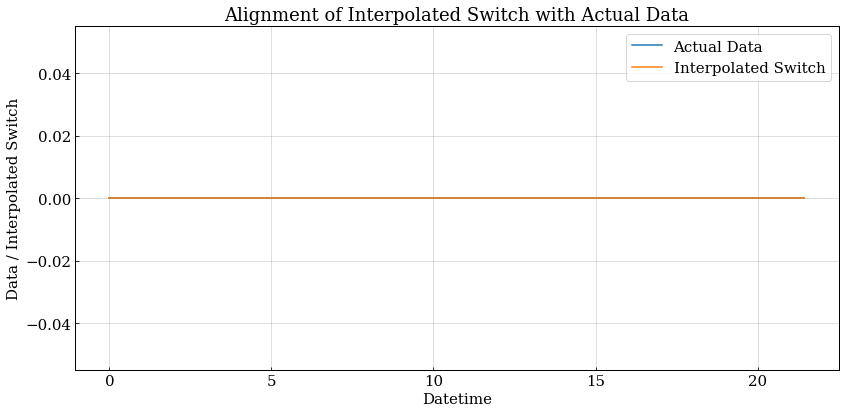

Frequency bin: 600
on_stats_f600_0702.csv


In [16]:
corr_on_stats(110)

Done!!!!!!!


<ipython-input-4-35f56ef8a8f3>:34: RuntimeWarning: invalid value encountered in divide
  normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])


0 failed: -0.9997999999999999
1 failed: -0.9987999999999999
2 failed: -0.9977999999999999
3 failed: -0.9967999999999999
4 failed: -0.9957999999999999
5 failed: -0.9947999999999999
6 failed: -0.9937999999999999
7 failed: -0.9927999999999999
8 failed: -0.9917999999999999
9 failed: -0.9907999999999999
10 failed: -0.9897999999999999
11 failed: -0.9887999999999999
12 failed: -0.9877999999999999
13 failed: -0.9867999999999999
14 failed: -0.9857999999999999
15 failed: -0.9847999999999999
16 failed: -0.9837999999999999
17 failed: -0.9827999999999999
18 failed: -0.9817999999999999
19 failed: -0.9807999999999999
20 failed: -0.9797999999999999
21 failed: -0.9787999999999999
22 failed: -0.9777999999999999
23 failed: -0.9767999999999999
24 failed: -0.9757999999999999
25 failed: -0.9747999999999999
26 failed: -0.9737999999999999
27 failed: -0.9727999999999999
28 failed: -0.9717999999999999
29 failed: -0.9707999999999999
30 failed: -0.9697999999999999
31 failed: -0.9687999999999999
32 failed: -0.9677

<ipython-input-4-35f56ef8a8f3>:60: RuntimeWarning: All-NaN slice encountered
  maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]


Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [44. nan 41.]
  --> t_deltas = [-0.956    nan -0.959]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9558000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


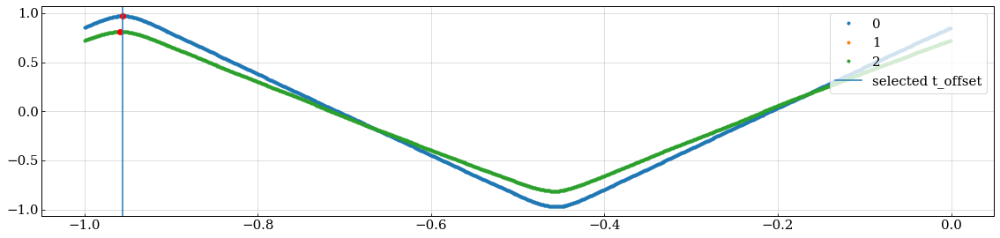

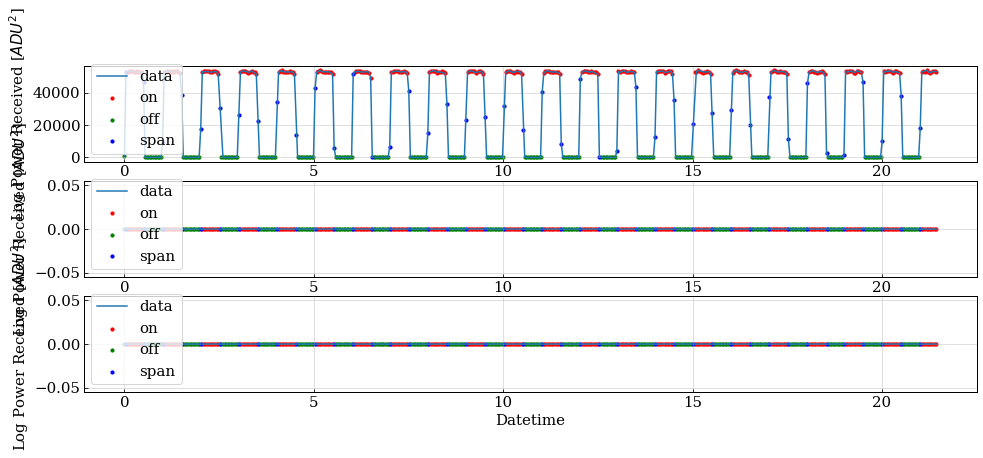

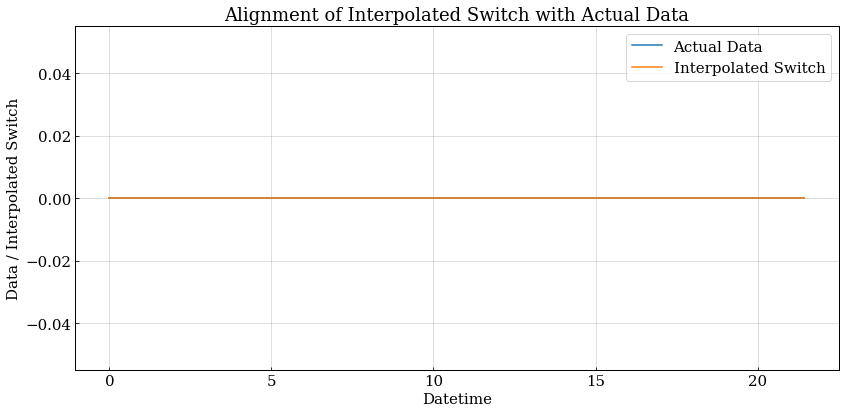

Frequency bin: 600
on_stats_f600_0702.csv


In [17]:
corr_on_stats(120)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [881. 164. 881.]
  --> t_deltas = [-0.119 -0.836 -0.119]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1188000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


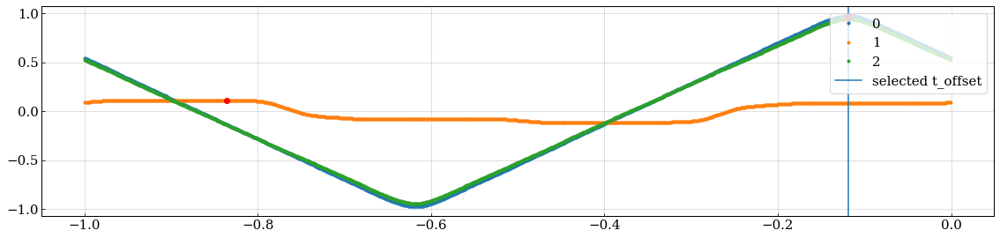

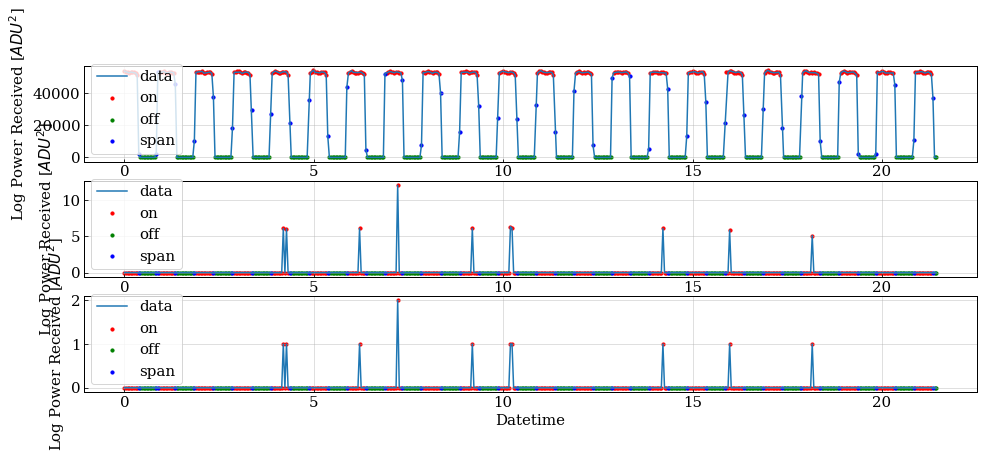

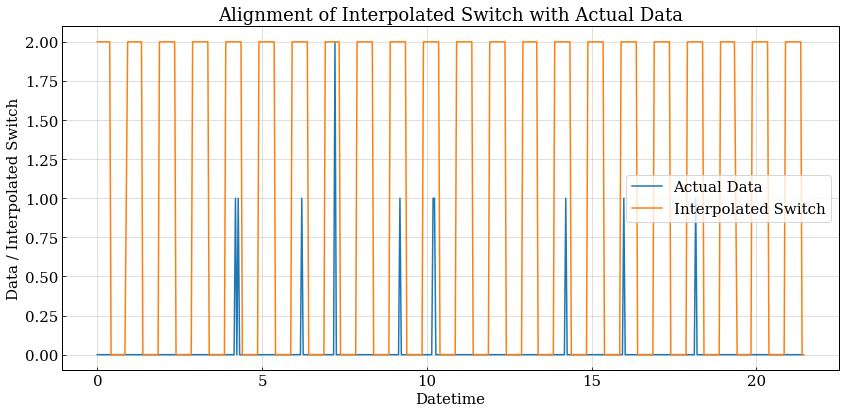

Frequency bin: 600
on_stats_f600_0702.csv


In [18]:
corr_on_stats(130)

Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [980. 981. 980.]
  --> t_deltas = [-0.02  -0.019 -0.02 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0198000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


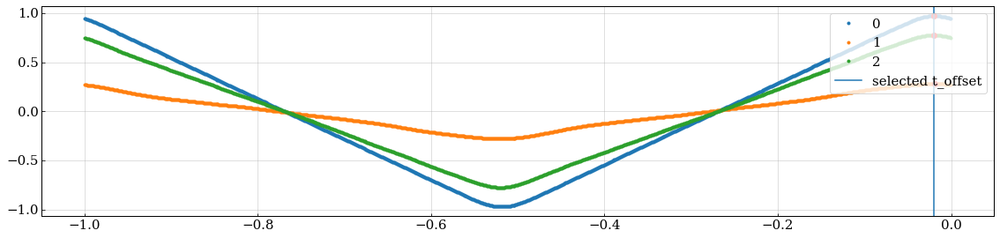

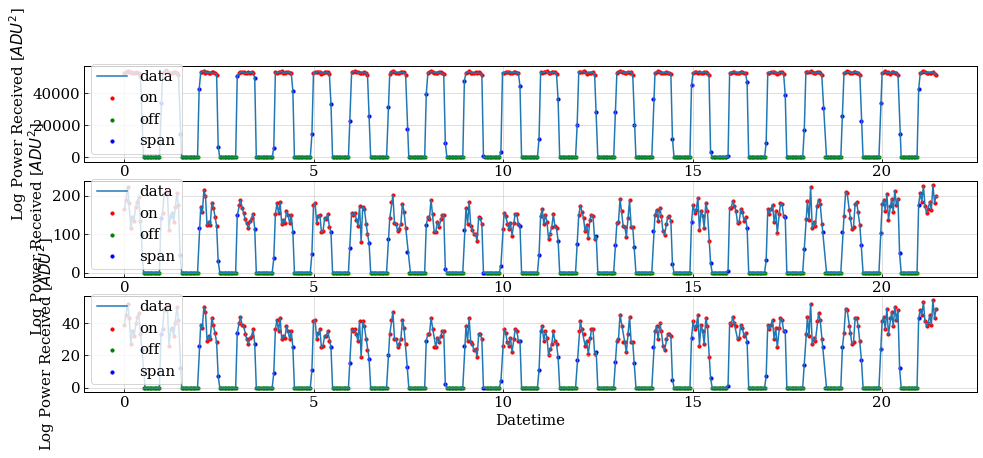

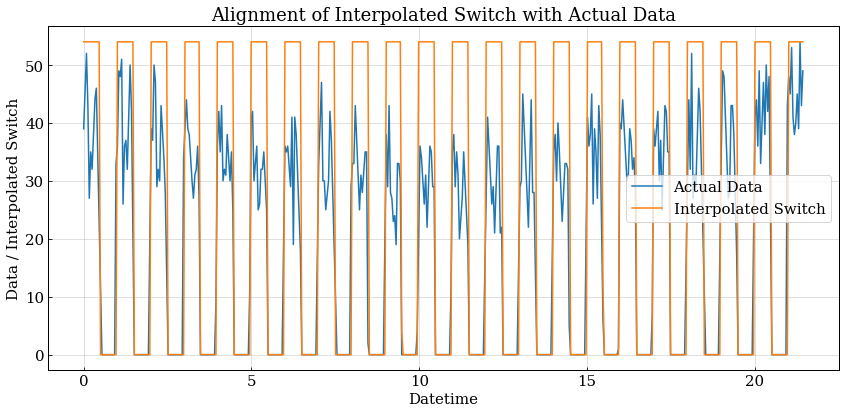

Frequency bin: 600
on_stats_f600_0702.csv


In [19]:
corr_on_stats(140)

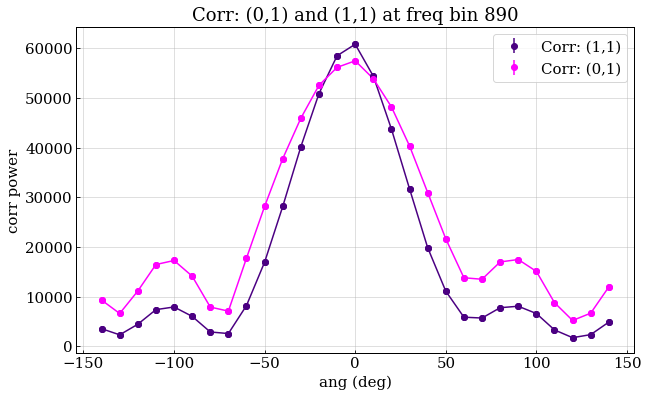

In [3]:
#plotting the resulting beam map using

f_plot = 890

# Specify the path to your CSV file
freq_csv = 'corr_stats/on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 
mean_01 = [float(row[2]) for row in data]
mean_11 = [float(row[3]) for row in data]
std_01 = [float(row[5]) for row in data]
std_11 = [float(row[6]) for row in data]


plt.figure(figsize=(10, 6))
plt.errorbar(angles,mean_11,yerr=std_11,fmt='o',label='Corr: (1,1)',color='indigo')
plt.errorbar(angles,mean_01,yerr=std_01,fmt='o',label='Corr: (0,1)',color='magenta')
sorted_indices = sorted(range(len(angles)), key=lambda k: angles[k])
plt.plot([angles[i] for i in sorted_indices], [mean_11[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
plt.plot([angles[i] for i in sorted_indices], [mean_01[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
plt.xlabel("ang (deg)")
plt.ylabel("corr power")
plt.title("Corr: (0,1) and (1,1) at freq bin "+str(f_plot))
plt.legend()

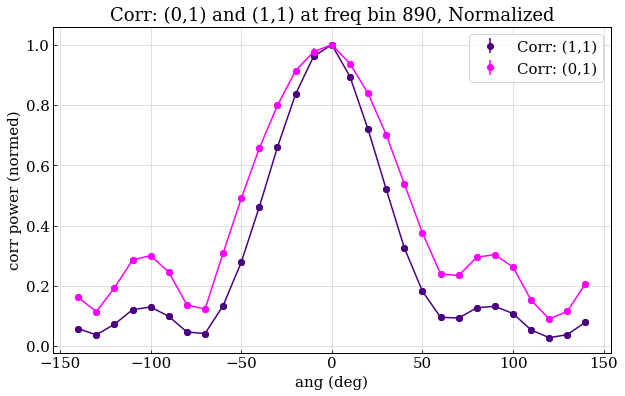

In [18]:
#normalizing to max value + plotting 

f_plot = 890

# Specify the path to your CSV file
freq_csv = 'on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 
mean_01 = [float(row[2]) for row in data]
mean_11 = [float(row[3]) for row in data]
std_01 = [float(row[5]) for row in data]
std_11 = [float(row[6]) for row in data]

# Normalize to maximum value
norm_mean_01 = mean_01 / np.max(mean_01)
norm_mean_11 = mean_11 / np.max(mean_11)
norm_std_01 = std_01 / np.max(mean_01)
norm_std_11 = std_11 / np.max(mean_11)

plt.figure(figsize=(10, 6))
plt.errorbar(angles,norm_mean_11,yerr=norm_std_11,fmt='o',label='Corr: (1,1)',color='indigo')
plt.errorbar(angles,norm_mean_01,yerr=norm_std_01,fmt='o',label='Corr: (0,1)',color='magenta')
sorted_indices = sorted(range(len(angles)), key=lambda k: angles[k])
plt.plot([angles[i] for i in sorted_indices], [norm_mean_11[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
plt.plot([angles[i] for i in sorted_indices], [norm_mean_01[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
plt.xlabel("ang (deg)")
plt.ylabel("corr power (normed)")
plt.title("Corr: (0,1) and (1,1) at freq bin "+str(f_plot)+", Normalized")
plt.legend()

<ipython-input-32-a0fab92eab9b>:39: RuntimeWarning: divide by zero encountered in log10
  mean_01_norm_db = 20*np.log10(mean_01_norm)
<ipython-input-32-a0fab92eab9b>:42: RuntimeWarning: divide by zero encountered in log10
  mean_11_norm_db = 10*np.log10(mean_11_norm)
<ipython-input-32-a0fab92eab9b>:50: RuntimeWarning: divide by zero encountered in log10
  mean_01_db_k = 20*np.log10(mean_01_norm_k)


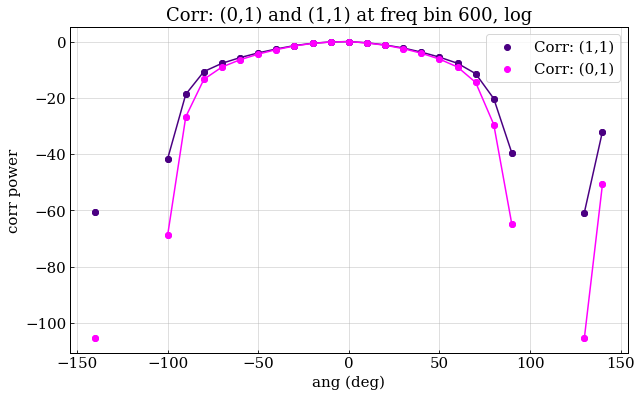

In [32]:
# plotting - logged and normalized

f_plot = 600


def db_convert(value):
    result = 10 * np.log10(value)  
    result[value == 0] = np.nan
    return result

# Specify the path to your CSV file
freq_csv = 'corr_stats/on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 
mean_01 = [float(row[2]) for row in data]
mean_11 = [float(row[3]) for row in data]
std_01 = [float(row[5]) for row in data]
std_11 = [float(row[6]) for row in data]
mean_00 = [float(row[1]) for row in data]
std_00 = [float(row[4]) for row in data]


mean_01_norm = mean_01 / np.max(mean_01)
mean_01_norm_db = 20*np.log10(mean_01_norm)

mean_11_norm = mean_11/np.max(mean_11)
mean_11_norm_db = 10*np.log10(mean_11_norm)



mean_01_k = mean_01 / np.sqrt(mean_00)

mean_01_norm_k = mean_01_k / np.max(mean_01_k)

mean_01_db_k = 20*np.log10(mean_01_norm_k)


plt.figure(figsize=(10, 6))
#plt.errorbar(angles,db_mean_11,yerr=db_std_11,fmt='o',label='Corr: (1,1)',color='indigo')
#plt.errorbar(angles,db_mean_01,yerr=db_std_01,fmt='o',label='Corr: (0,1)',color='magenta')
#plt.errorbar(angles,db_mean_01_k,yerr=db_std_01,fmt='o',label='Corr: (0,1) k',color='red')
#plt.errorbar(angles,db_mean_01_k_rescale,yerr=db_std_01,fmt='o',label='Corr: (0,1) k normed',color='orange')
plt.scatter(angles,mean_11_norm_db,label='Corr: (1,1)',color='indigo')
plt.scatter(angles,mean_01_norm_db,label='Corr: (0,1)',color='magenta')
#plt.scatter(angles,mean_01_db_k,label='Corr: (0,1) Kalyani',color='red',s=8)

#plt.scatter(angles,db_mean_01_k_rescale,label='Corr: (0,1) k normed',color='orange')
sorted_indices = sorted(range(len(angles)), key=lambda k: angles[k])
plt.plot([angles[i] for i in sorted_indices], [mean_11_norm_db[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
plt.plot([angles[i] for i in sorted_indices], [mean_01_norm_db[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
#plt.plot([angles[i] for i in sorted_indices], [mean_01_db_k[i] for i in sorted_indices], marker='o', linestyle='-', color='red')
#plt.plot([angles[i] for i in sorted_indices], [db_mean_01_k_rescale[i] for i in sorted_indices], marker='o', linestyle='-', color='orange')

plt.xlabel("ang (deg)")
plt.ylabel("corr power")
plt.title("Corr: (0,1) and (1,1) at freq bin "+str(f_plot)+", log")
plt.legend()

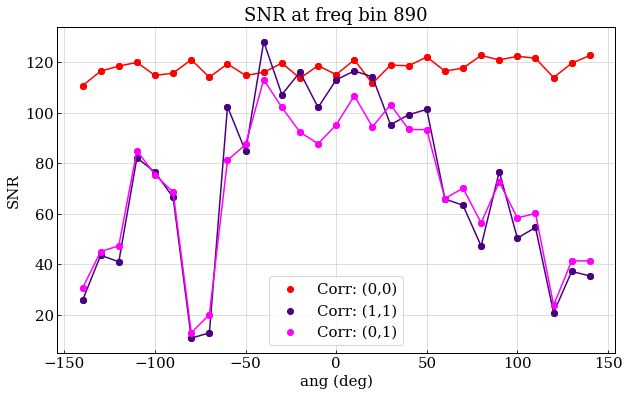

In [5]:
#Plotting SNR as a function of Angle


f_plot = 890

# Specify the path to your CSV file
freq_csv = 'corr_stats/on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 
mean_01 = [float(row[2]) for row in data]
mean_11 = [float(row[3]) for row in data]
std_01 = [float(row[5]) for row in data]
std_11 = [float(row[6]) for row in data]
mean_00 = [float(row[1]) for row in data]
std_00 = [float(row[4]) for row in data]


snr_00 = [a / b if b != 0 else math.nan for a, b in zip(mean_00, std_00)]
snr_11 = [a / b if b != 0 else math.nan for a, b in zip(mean_11, std_11)]
snr = [a / b if b != 0 else math.nan for a, b in zip(mean_01, std_01)]

plt.figure(figsize=(10, 6))
plt.scatter(angles,snr_00,label='Corr: (0,0)',color='red')
plt.scatter(angles,snr_11,label='Corr: (1,1)',color='indigo')
plt.scatter(angles,snr,label='Corr: (0,1)',color='magenta')
sorted_indices = sorted(range(len(angles)), key=lambda k: angles[k])
plt.plot([angles[i] for i in sorted_indices], [snr_00[i] for i in sorted_indices], marker='o', linestyle='-', color='red')
plt.plot([angles[i] for i in sorted_indices], [snr_11[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
plt.plot([angles[i] for i in sorted_indices], [snr[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
plt.xlabel("ang (deg)")
plt.ylabel("SNR")
plt.title("SNR at freq bin "+str(f_plot))
plt.legend()

In [9]:
#Grabbing all "On" indicies (instead of just saving the means/stds) and saving to csv

fbin = 890

# Path to the master CSV file
master_csv_file = 'on_inds_f'+str(fbin)+'_0702.csv'

# Define headers for the CSV file
fieldnames = ['Angle', 'On_Inds']

# Function to initialize or create the CSV file with headers
def initialize_csv_file():
    if not os.path.exists(master_csv_file):
        with open(master_csv_file, mode='w', newline='') as file:
            writer = csv.DictWriter(file, fieldnames=fieldnames)
            writer.writeheader()

# Function to save avgs and stds to the CSV file
def corr_on_inds(angle,period=0.9998e6,duty_cycle=0.5e6,file_path=file_path):
    print(angle)
    f_start = angle_to_files[angle][0]
    f_stop = angle_to_files[angle][-1]
    corr_data = read_corr_mode_h5(file_path, f_start=f_start, f_stop=f_stop)
    avgs, stds, on_inds, off_inds, span = Extract_Source_Pulses(corr_data,Period=period,Dutycycle=duty_cycle,f_ind=fbin)
    
    # Read existing data from CSV file
    rows_to_write = []
    if os.path.exists(master_csv_file):
        print(master_csv_file)
        with open(master_csv_file, mode='r', newline='') as file_read:
            reader = csv.DictReader(file_read)
            rows = list(reader)
            
            # Check if there is already a row for this angle; if so, update it
            angle_exists = False
            for row in rows:
                if row['Angle'] == str(angle):
                    row['On_Inds'] = on_inds
                    angle_exists = True
                rows_to_write.append(row)
    
    # If angle doesn't exist, add a new row
    if not angle_exists:
        rows_to_write.append({
            'Angle': str(angle),
            'On_Inds': on_inds
        })
    
    # Write all rows (updated or new) back to the CSV file
    with open(master_csv_file, mode='w', newline='') as file_write:
        writer = csv.DictWriter(file_write, fieldnames=fieldnames)
        writer.writeheader()  # Write headers
        writer.writerows(rows_to_write)

# Initialize or create the CSV file with headers
initialize_csv_file()

# Example usage:
# corr_data_stats(0)  # Call this function as needed with different angles




0.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [274. 764. 262.]
  --> t_deltas = [-0.726 -0.236 -0.738]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7258000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


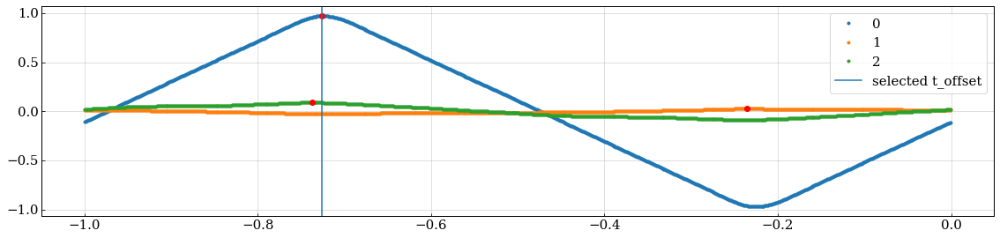

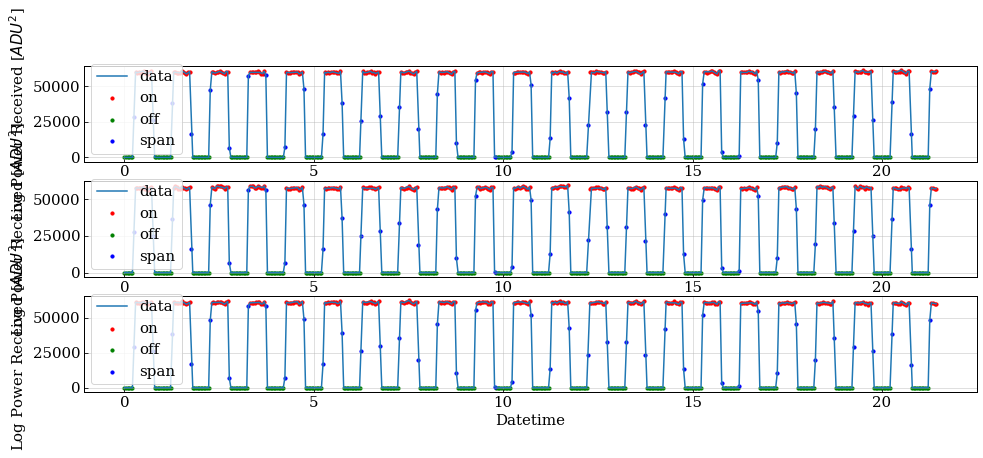

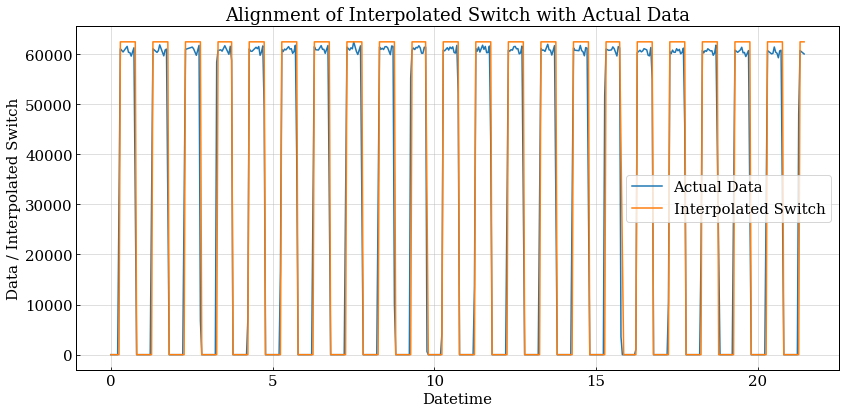

Frequency bin: 890
on_inds_f890_0702.csv
-10.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [727. 228. 726.]
  --> t_deltas = [-0.273 -0.772 -0.274]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2728000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


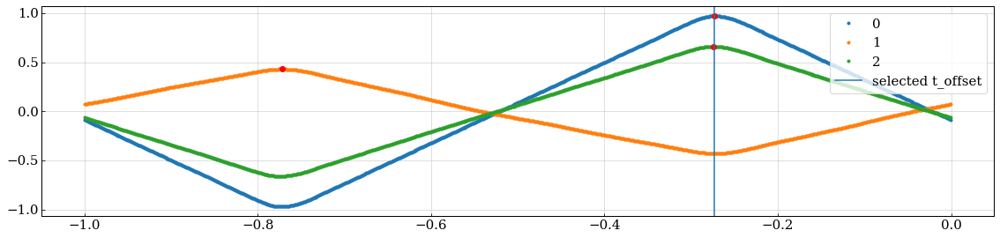

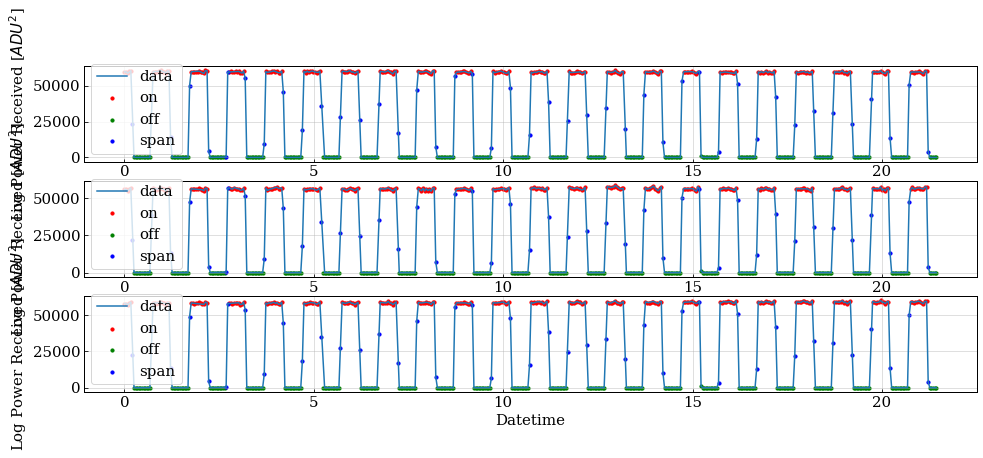

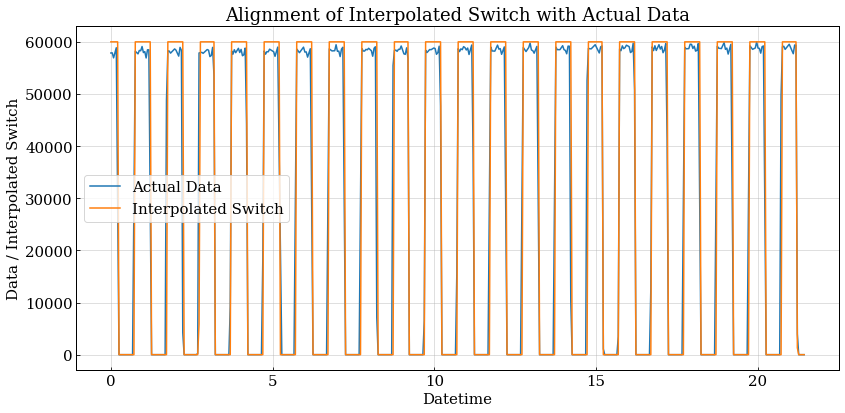

Frequency bin: 890
on_inds_f890_0702.csv
-20.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [304. 803. 304.]
  --> t_deltas = [-0.696 -0.197 -0.696]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6958000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


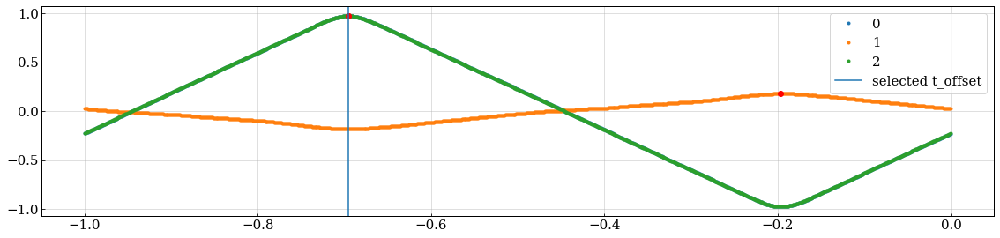

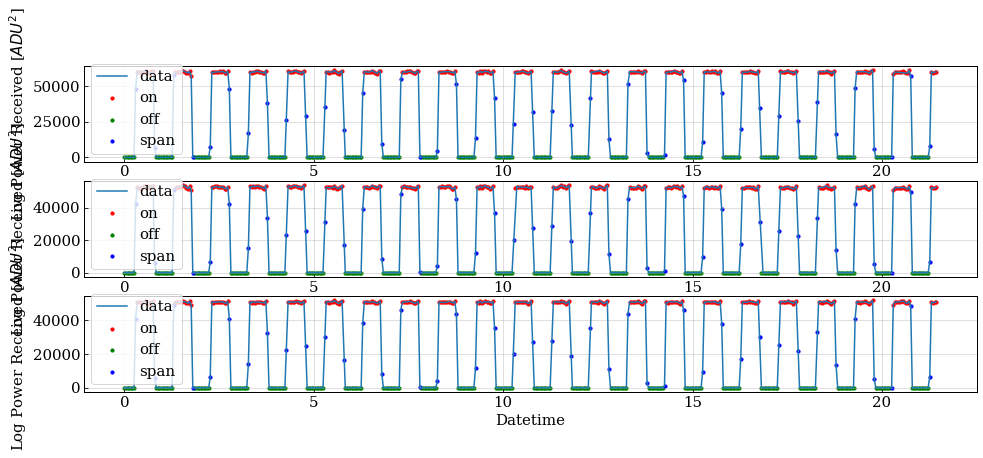

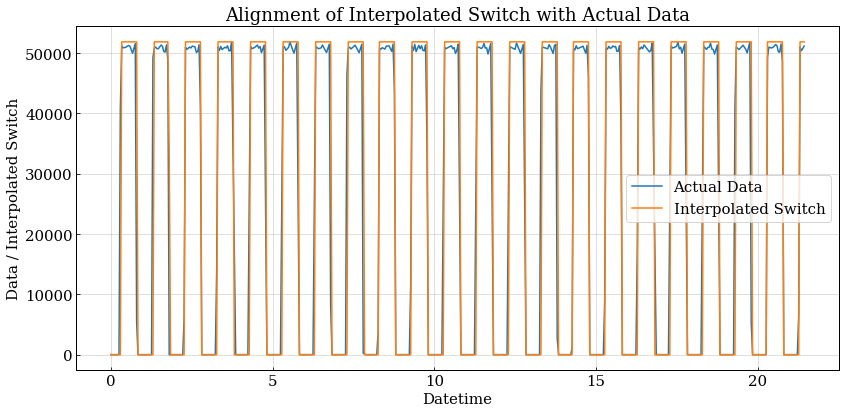

Frequency bin: 890
on_inds_f890_0702.csv
-30.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [141. 636. 142.]
  --> t_deltas = [-0.859 -0.364 -0.858]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8588000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


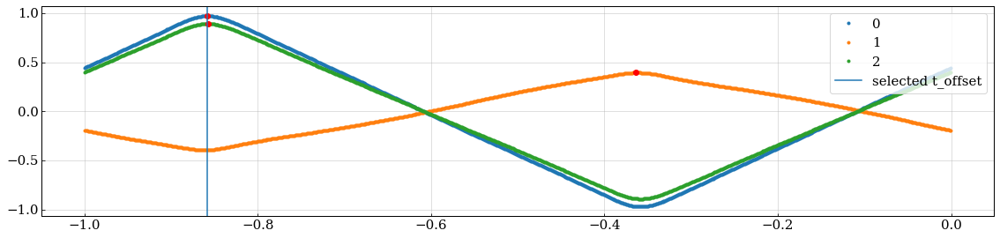

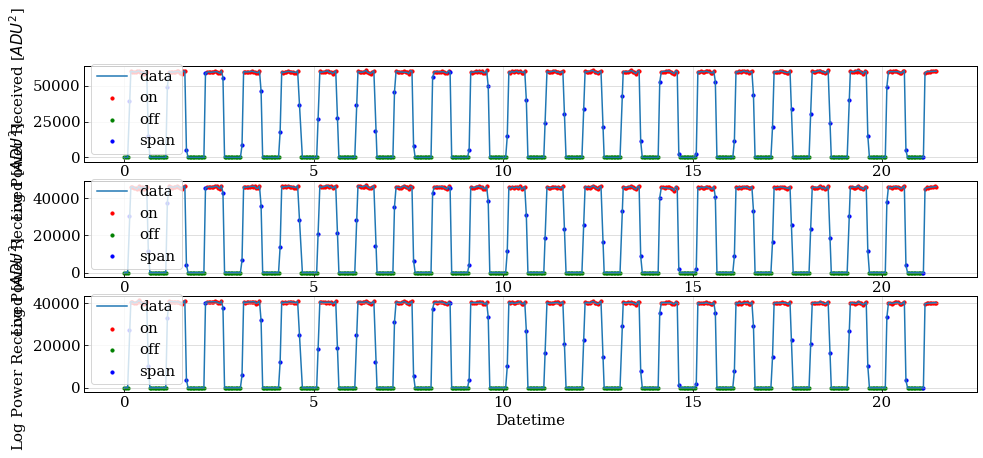

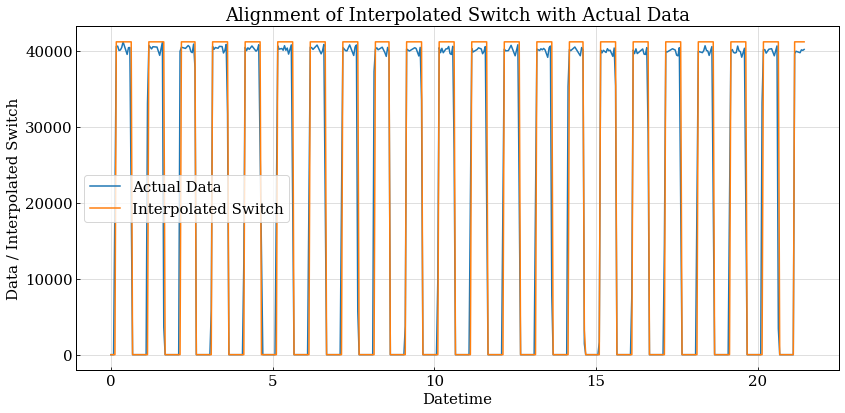

Frequency bin: 890
on_inds_f890_0702.csv
-40.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [718. 324. 218.]
  --> t_deltas = [-0.282 -0.676 -0.782]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2818000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


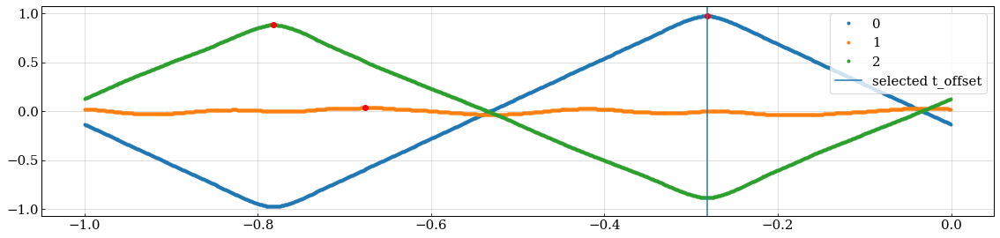

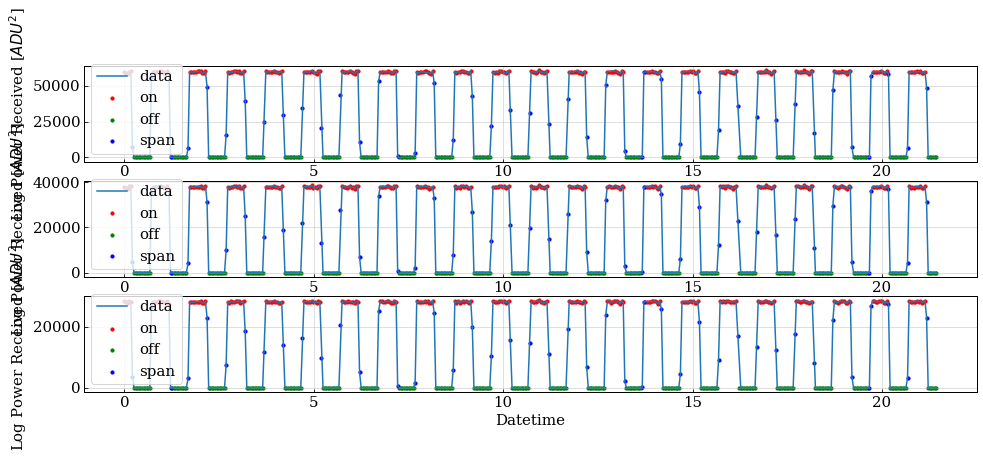

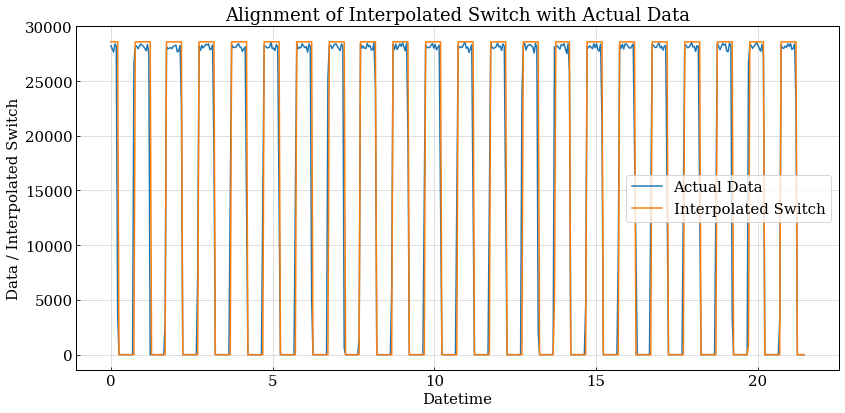

Frequency bin: 890
on_inds_f890_0702.csv
-50.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [556.  51. 557.]
  --> t_deltas = [-0.444 -0.949 -0.443]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4438000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


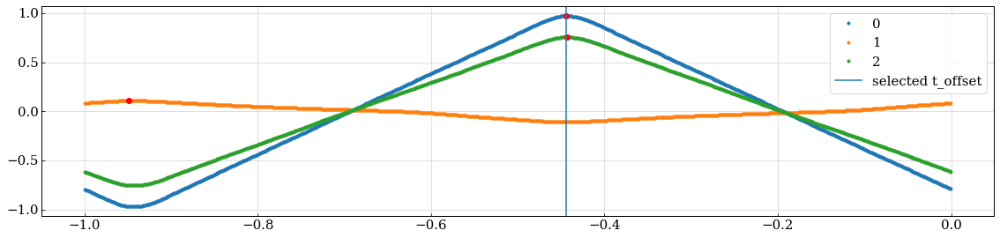

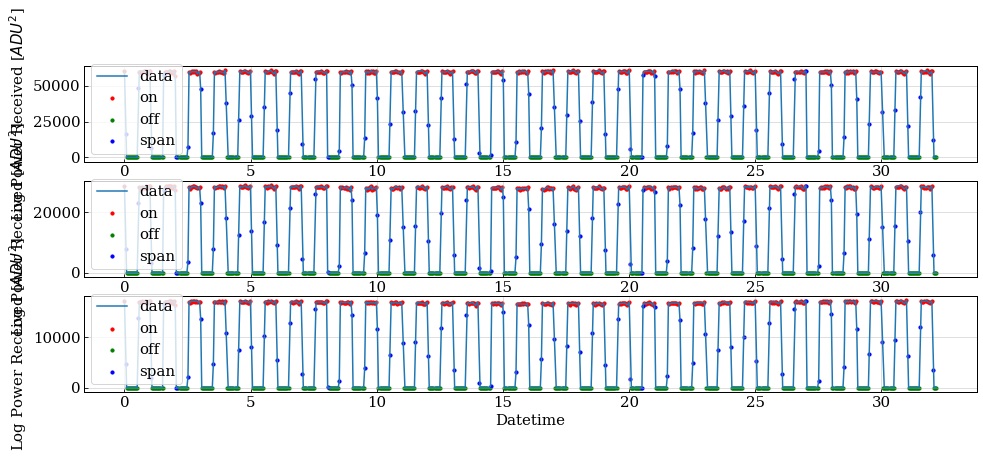

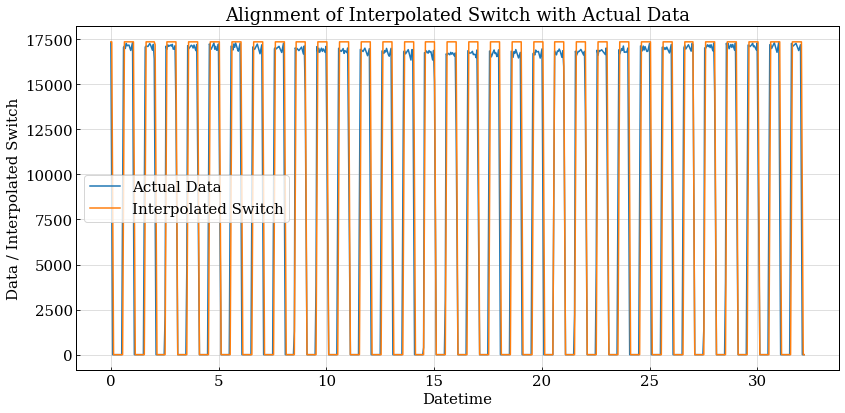

Frequency bin: 890
on_inds_f890_0702.csv
-60.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [656. 465. 656.]
  --> t_deltas = [-0.344 -0.535 -0.344]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3438000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


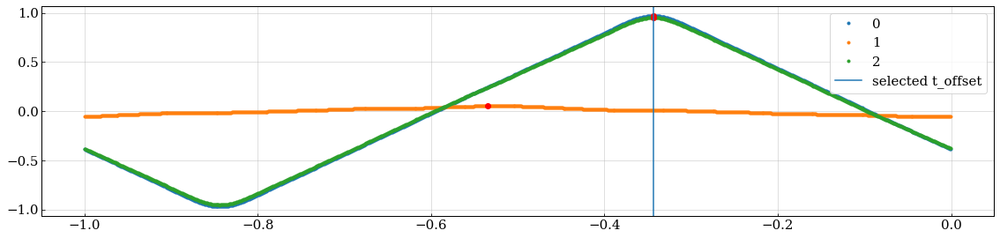

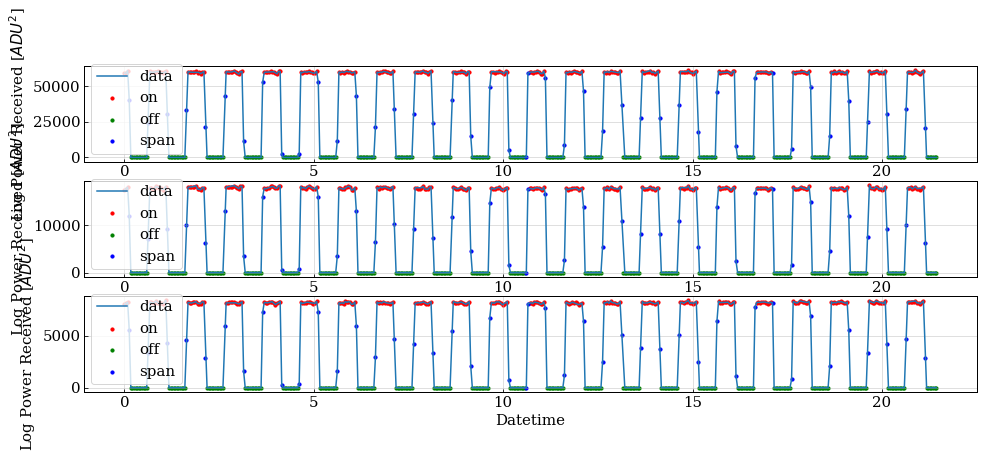

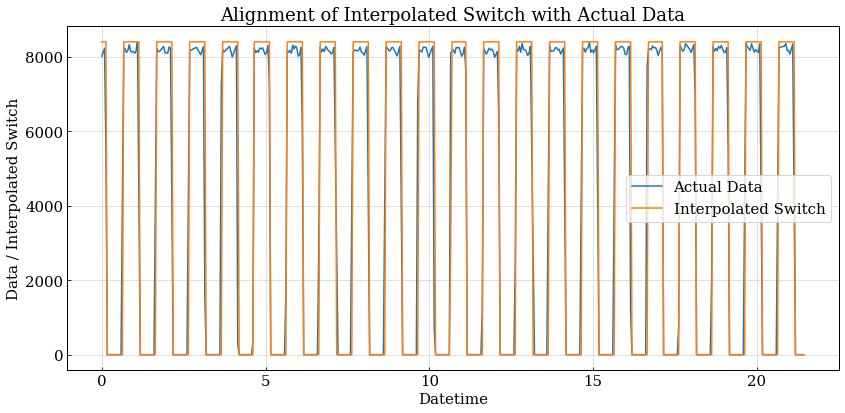

Frequency bin: 890
on_inds_f890_0702.csv
-70.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [758. 753. 760.]
  --> t_deltas = [-0.242 -0.247 -0.24 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2418000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


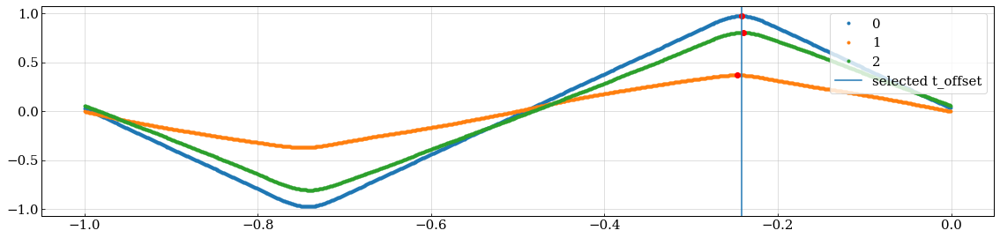

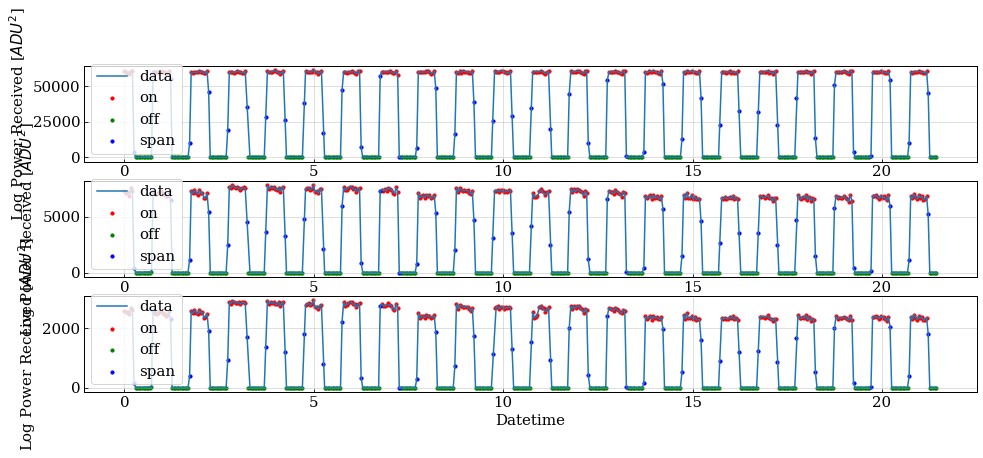

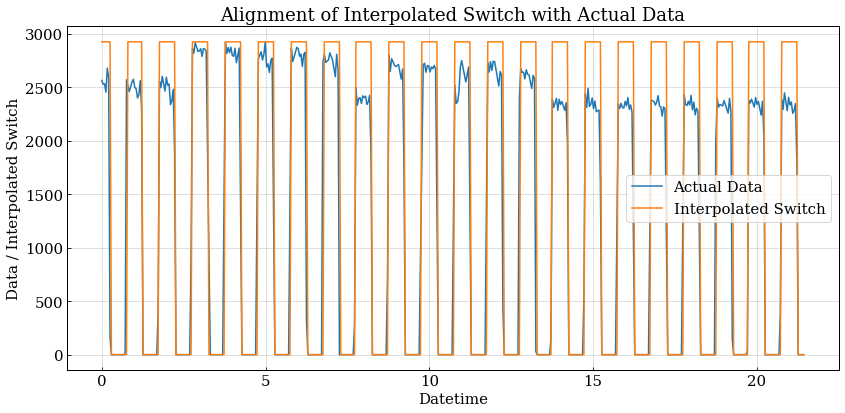

Frequency bin: 890
on_inds_f890_0702.csv
-80.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [334. 340. 332.]
  --> t_deltas = [-0.666 -0.66  -0.668]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6658000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


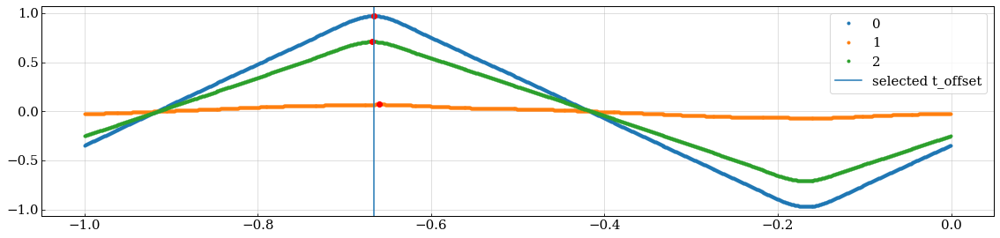

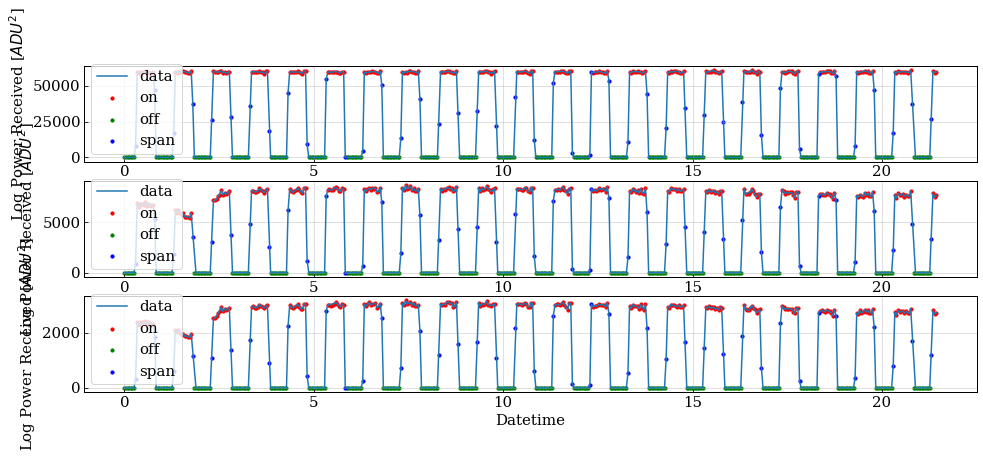

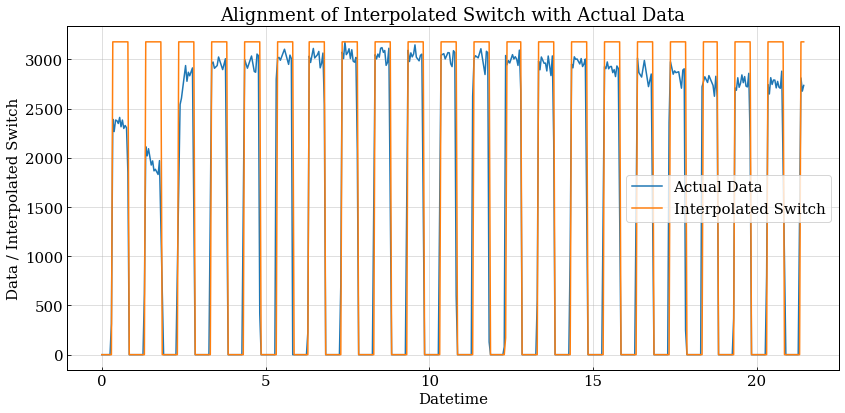

Frequency bin: 890
on_inds_f890_0702.csv
-90.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [695. 691. 700.]
  --> t_deltas = [-0.305 -0.309 -0.3  ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3048000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


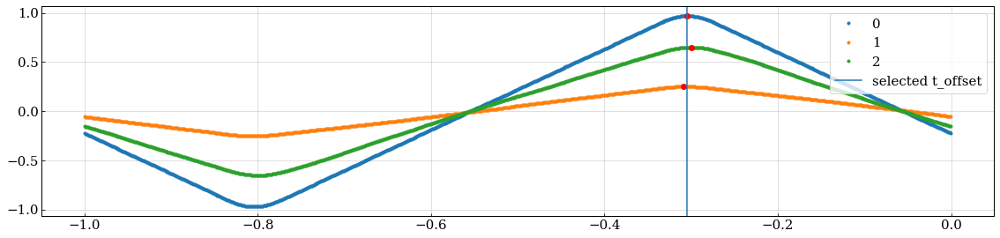

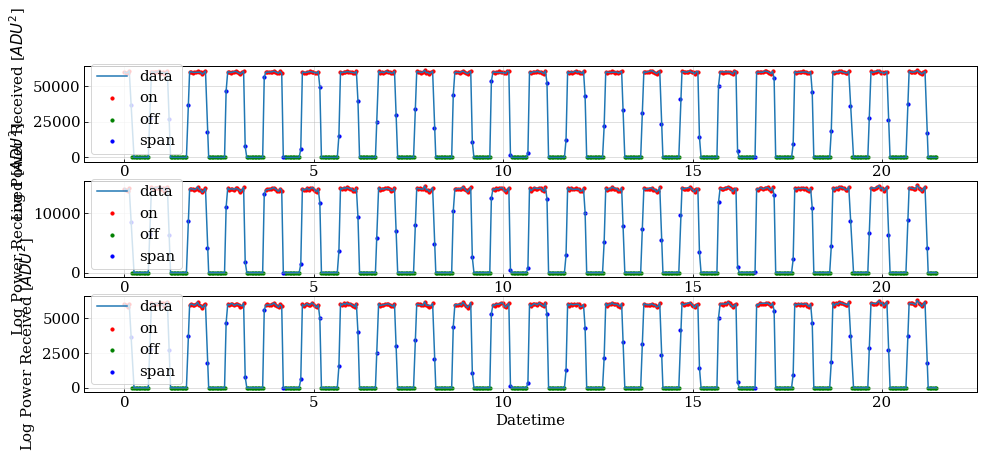

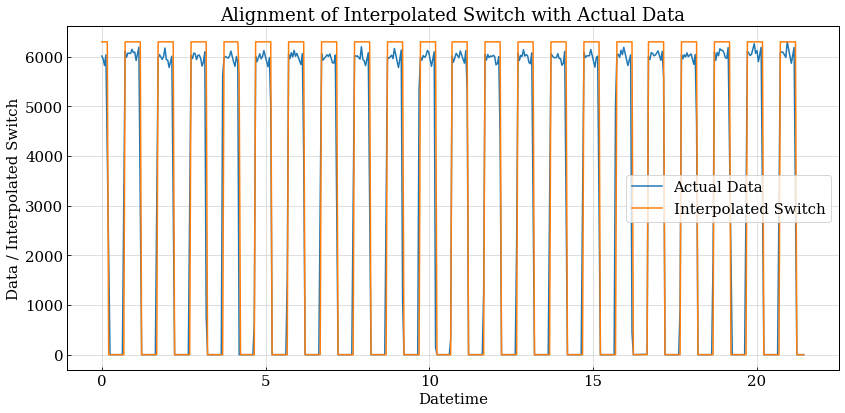

Frequency bin: 890
on_inds_f890_0702.csv
-100.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [535. 957. 531.]
  --> t_deltas = [-0.465 -0.043 -0.469]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4648000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


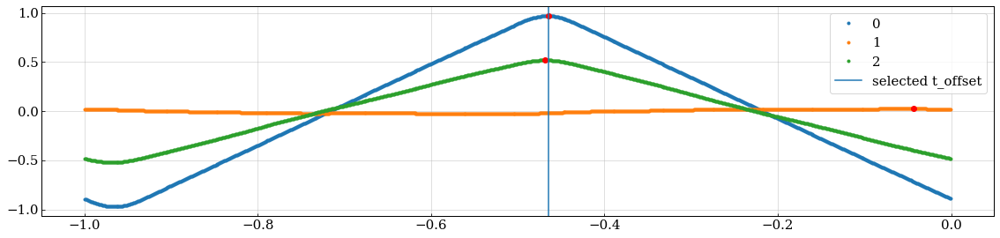

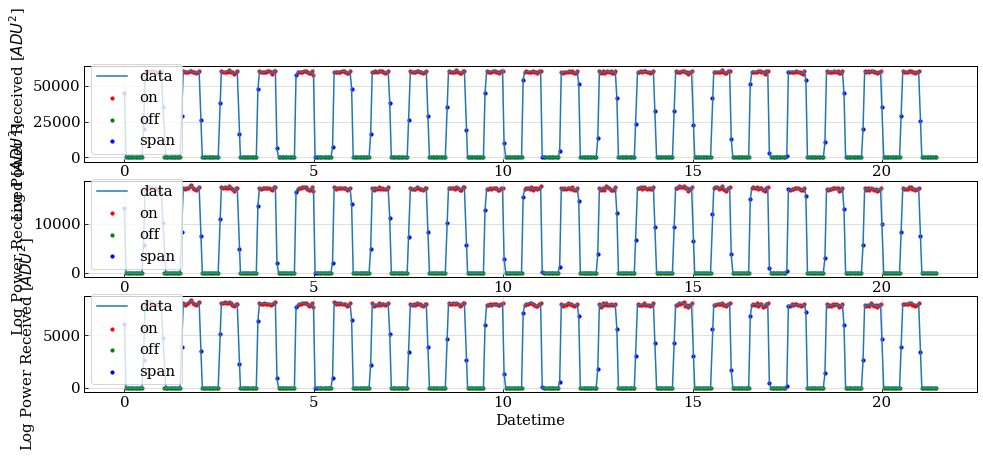

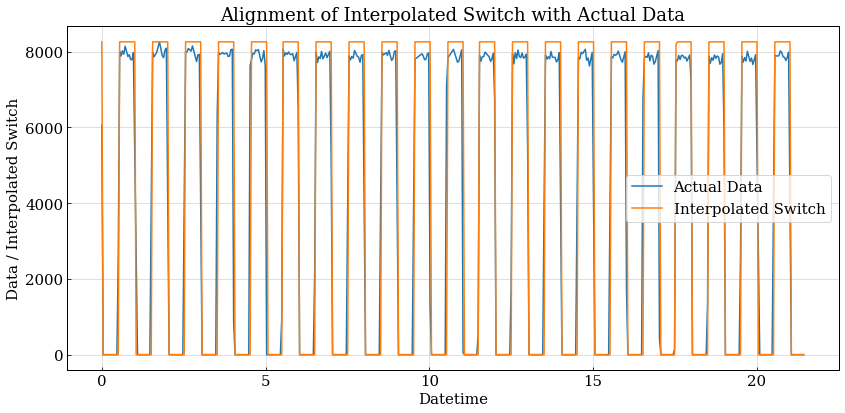

Frequency bin: 890
on_inds_f890_0702.csv
-110.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [372. 874. 374.]
  --> t_deltas = [-0.628 -0.126 -0.626]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6278000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


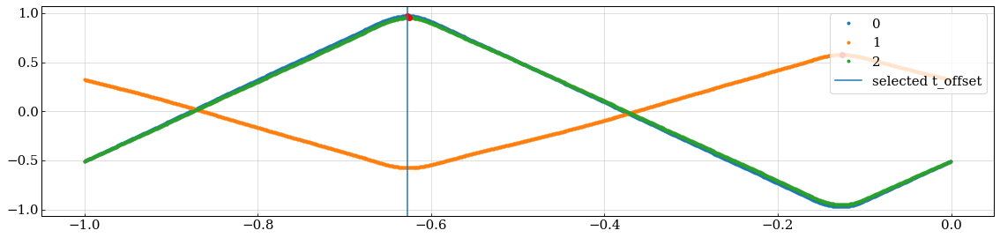

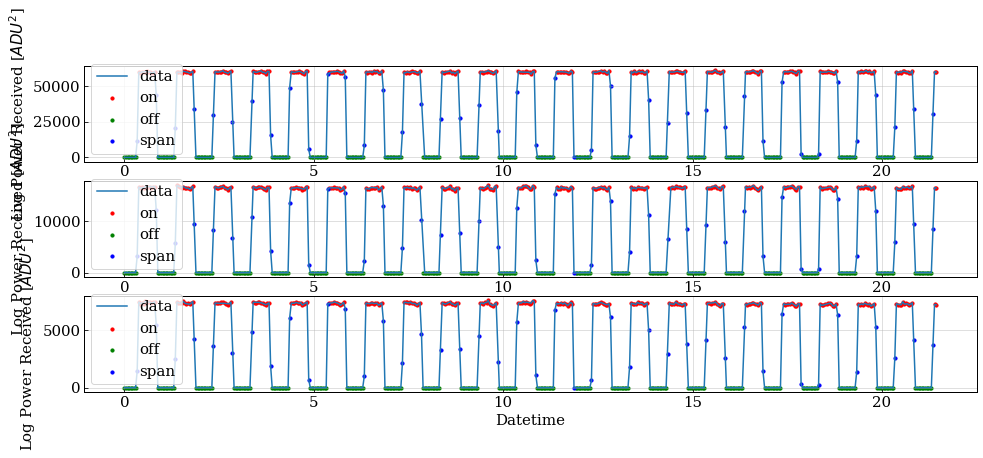

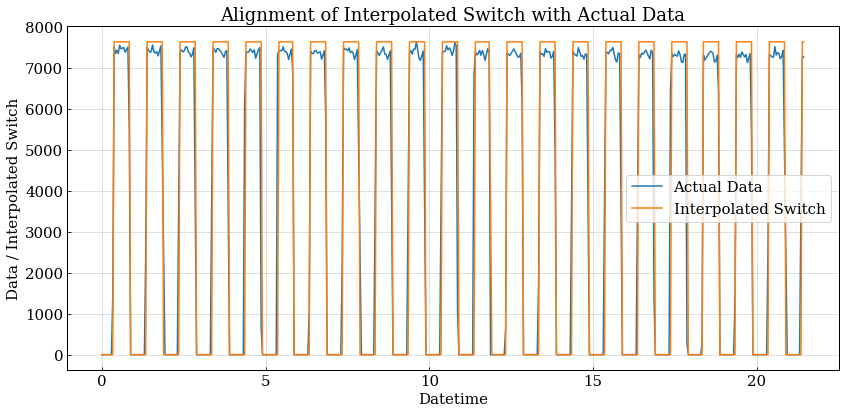

Frequency bin: 890
on_inds_f890_0702.csv
-120.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [946. 447. 945.]
  --> t_deltas = [-0.054 -0.553 -0.055]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0538000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


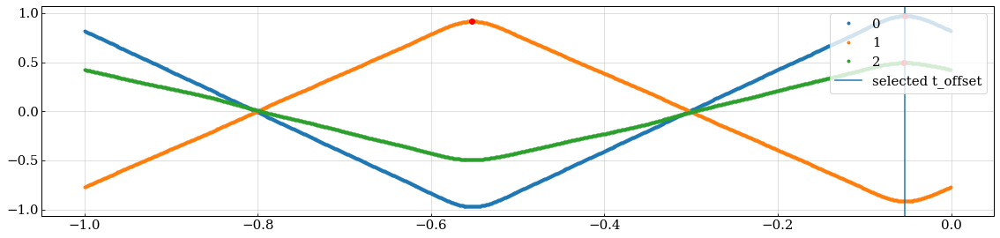

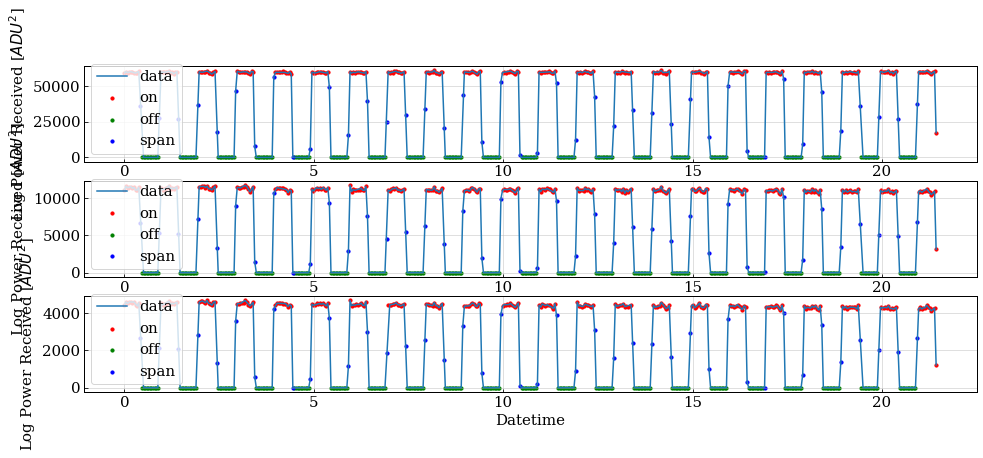

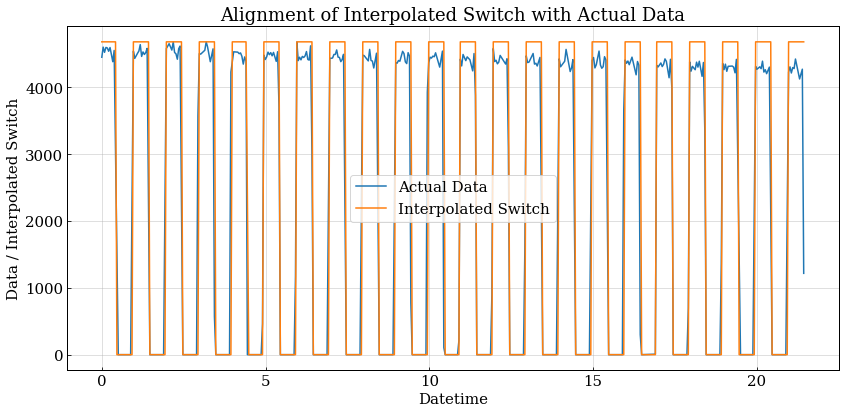

Frequency bin: 890
on_inds_f890_0702.csv
-130.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [786. 929. 285.]
  --> t_deltas = [-0.214 -0.071 -0.715]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2138000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


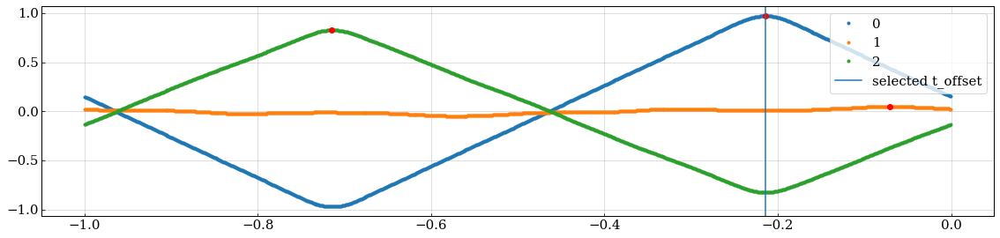

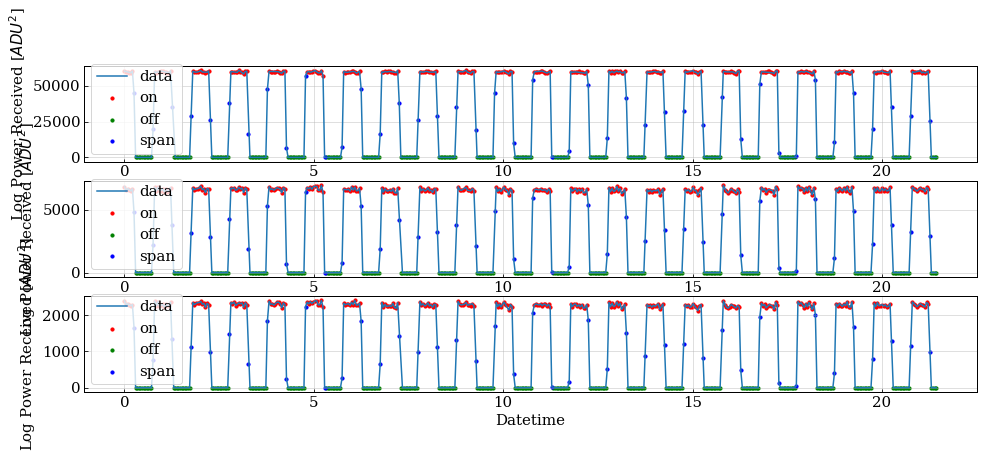

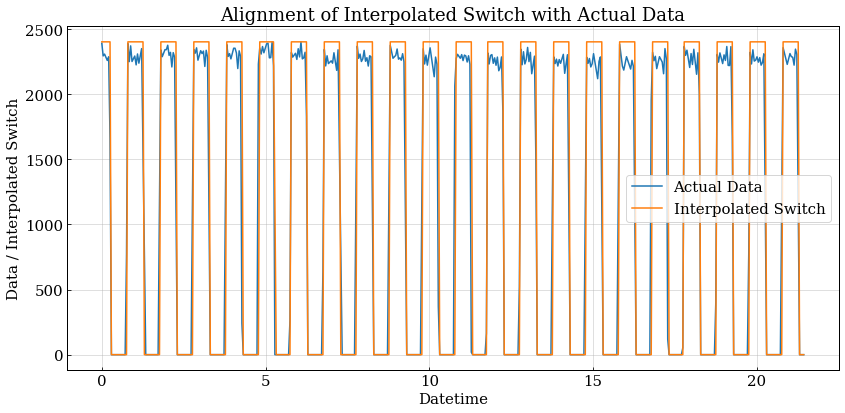

Frequency bin: 890
on_inds_f890_0702.csv
-140.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [625. 608. 630.]
  --> t_deltas = [-0.375 -0.392 -0.37 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3748000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


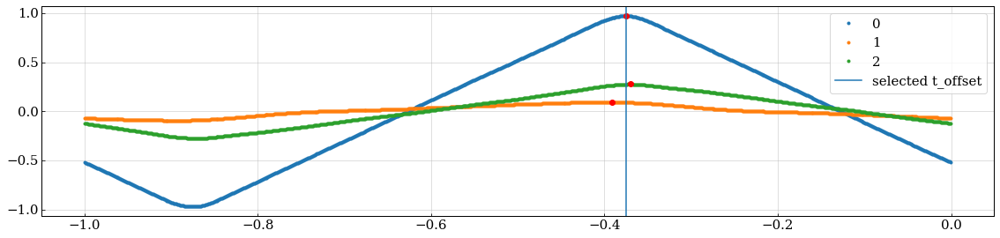

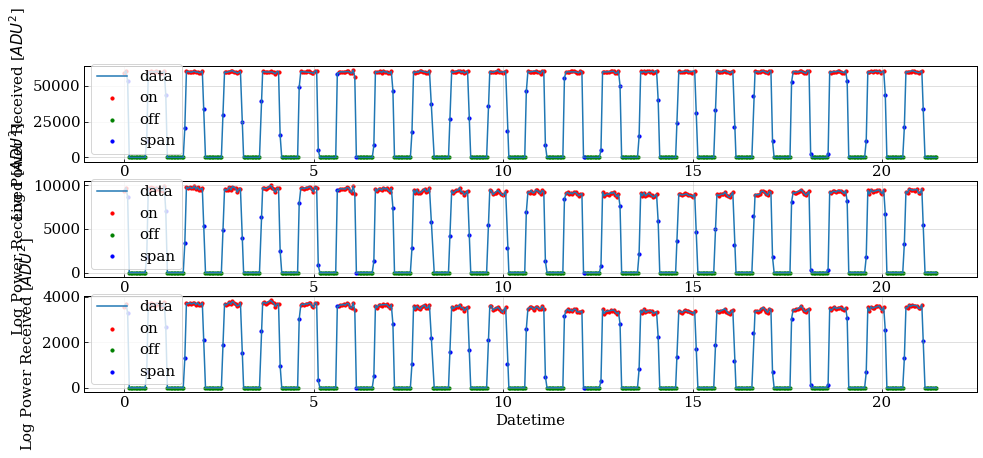

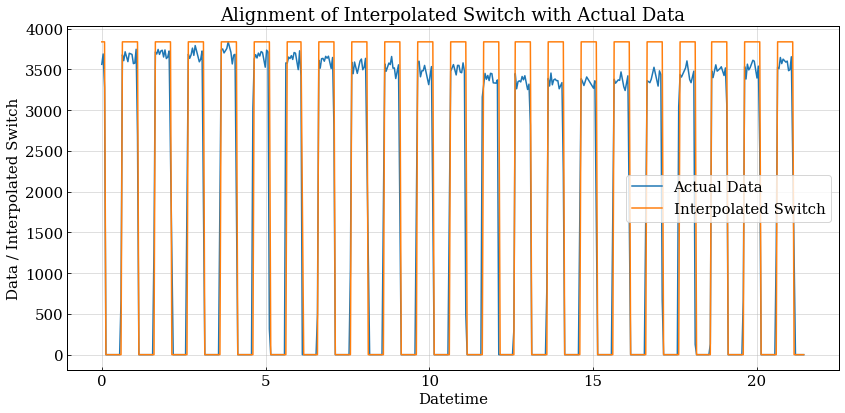

Frequency bin: 890
on_inds_f890_0702.csv
10.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [773. 273. 773.]
  --> t_deltas = [-0.227 -0.727 -0.227]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2268000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


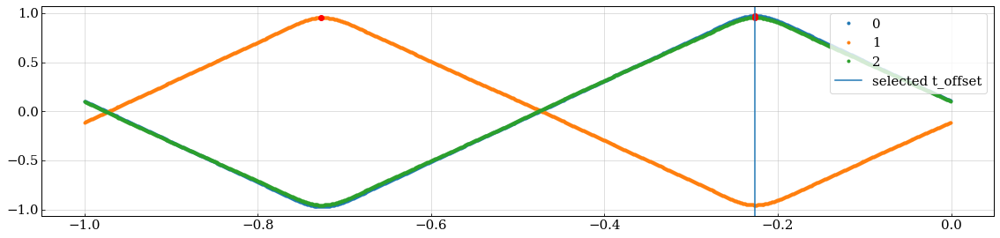

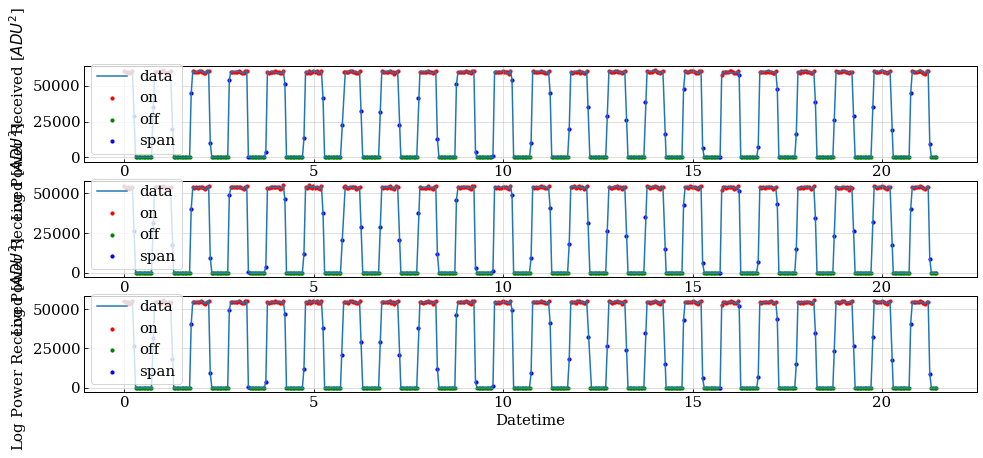

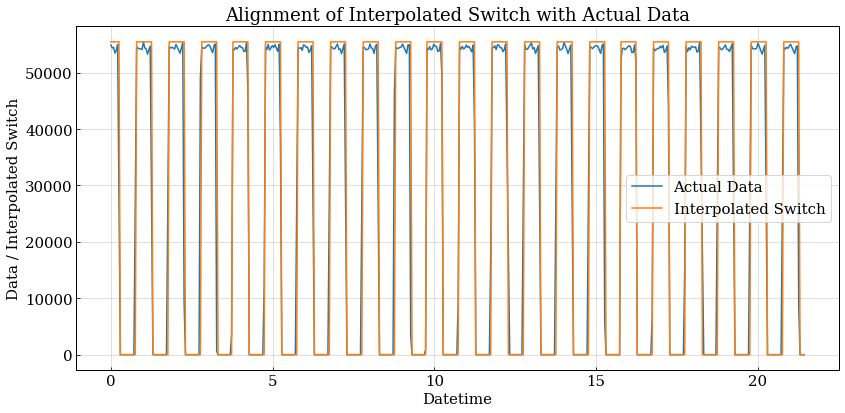

Frequency bin: 890
on_inds_f890_0702.csv
20.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [88. 88. 89.]
  --> t_deltas = [-0.912 -0.912 -0.911]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9118000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


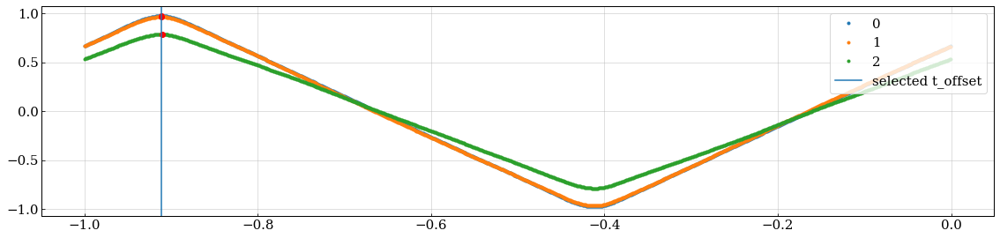

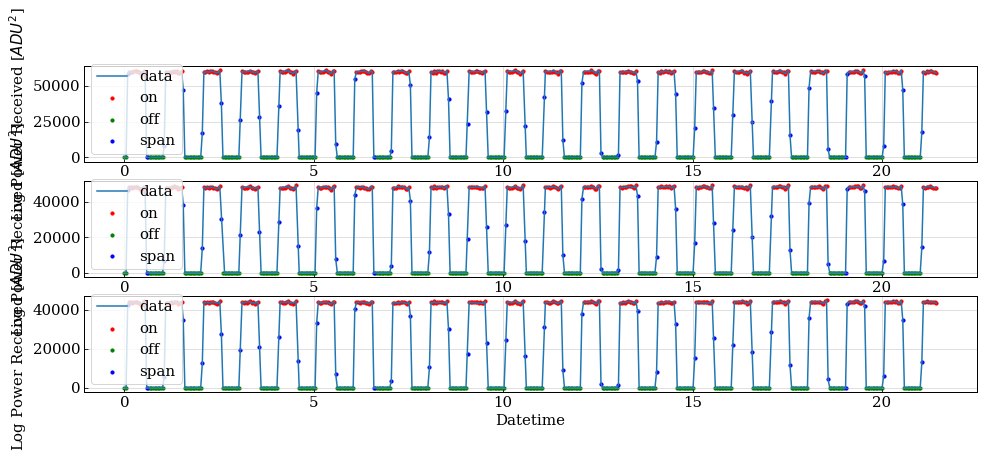

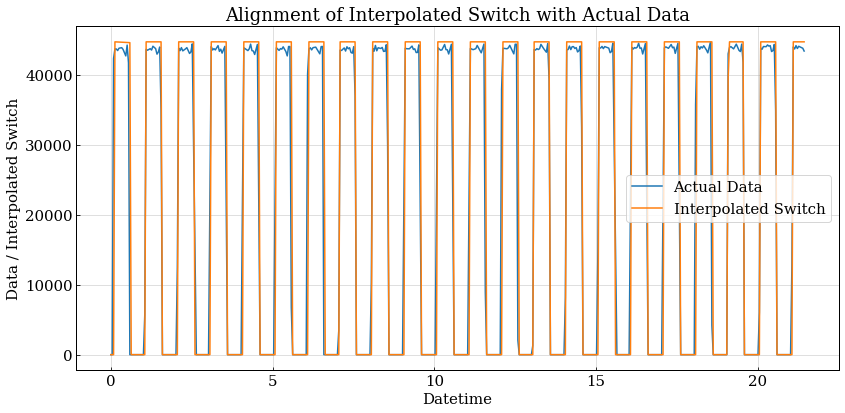

Frequency bin: 890
on_inds_f890_0702.csv
30.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [664. 659. 665.]
  --> t_deltas = [-0.336 -0.341 -0.335]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3358000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


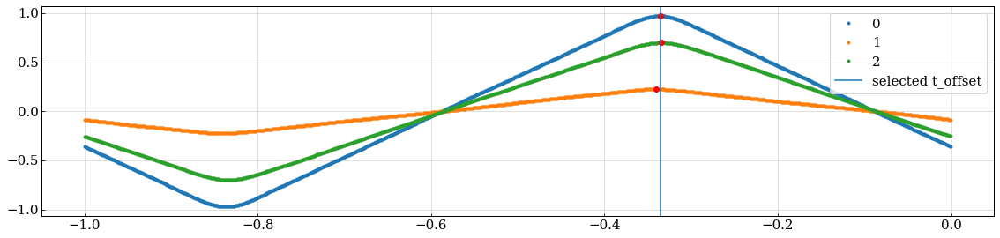

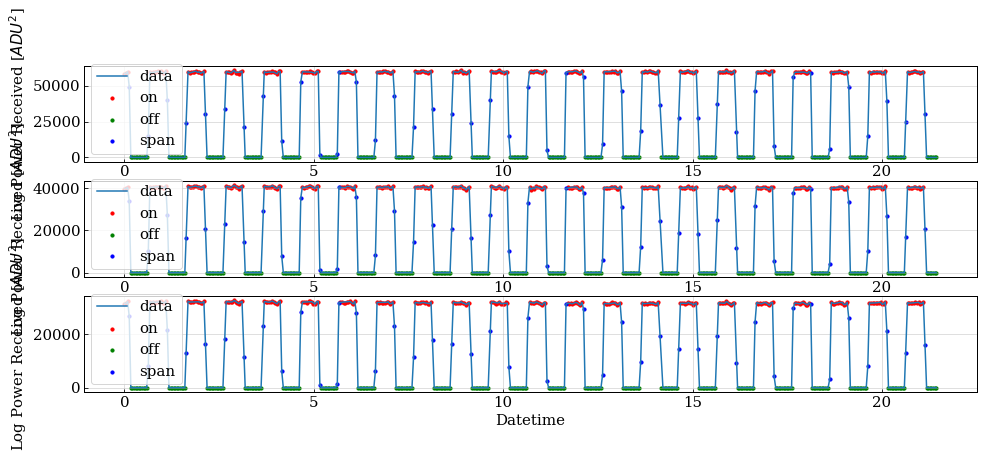

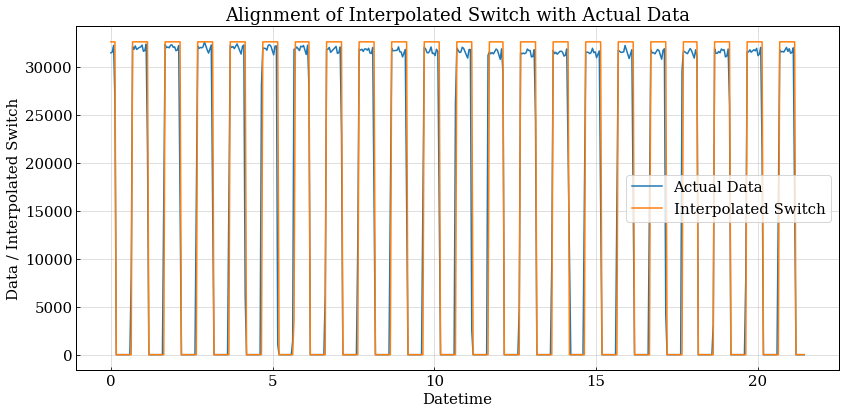

Frequency bin: 890
on_inds_f890_0702.csv
40.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [290. 289. 787.]
  --> t_deltas = [-0.71  -0.711 -0.213]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7098000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


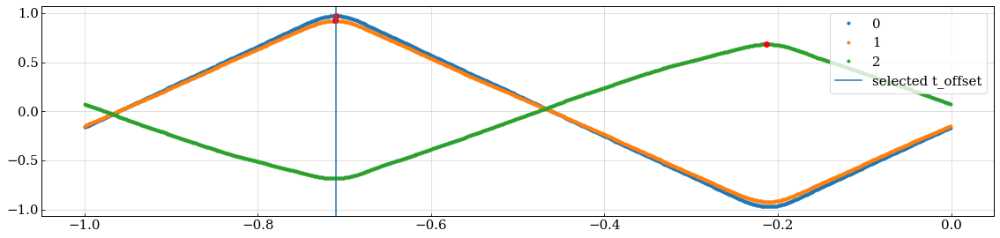

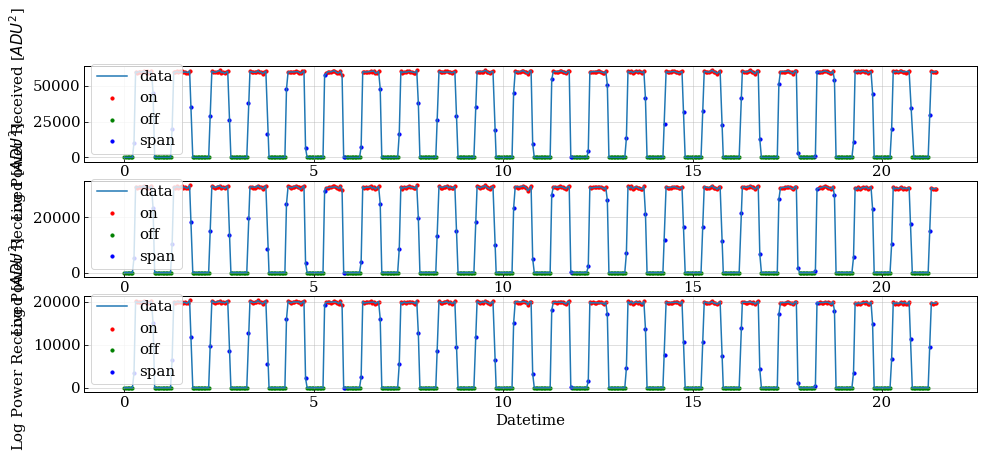

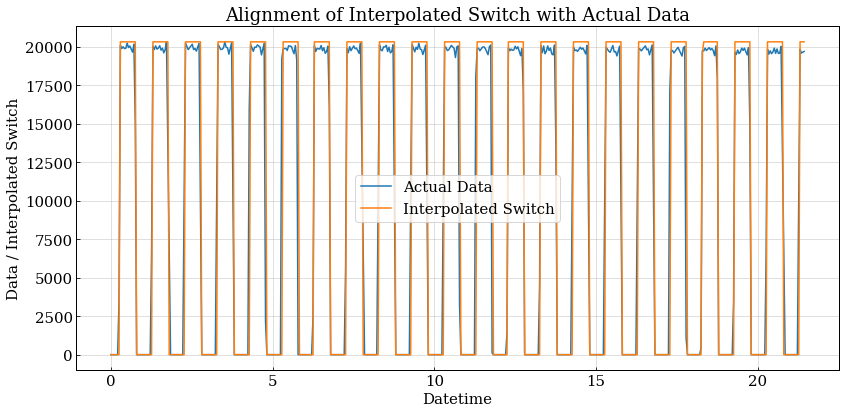

Frequency bin: 890
on_inds_f890_0702.csv
50.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [127. 627. 127.]
  --> t_deltas = [-0.873 -0.373 -0.873]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8728000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


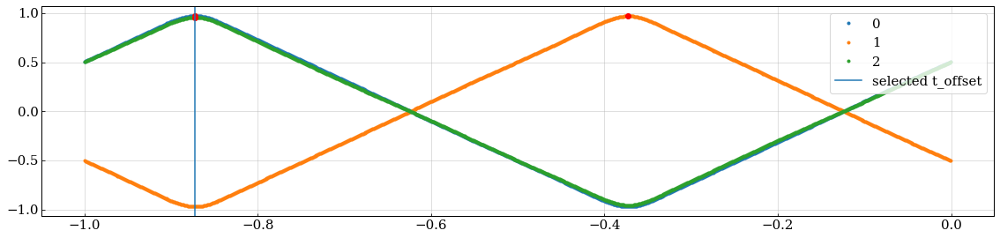

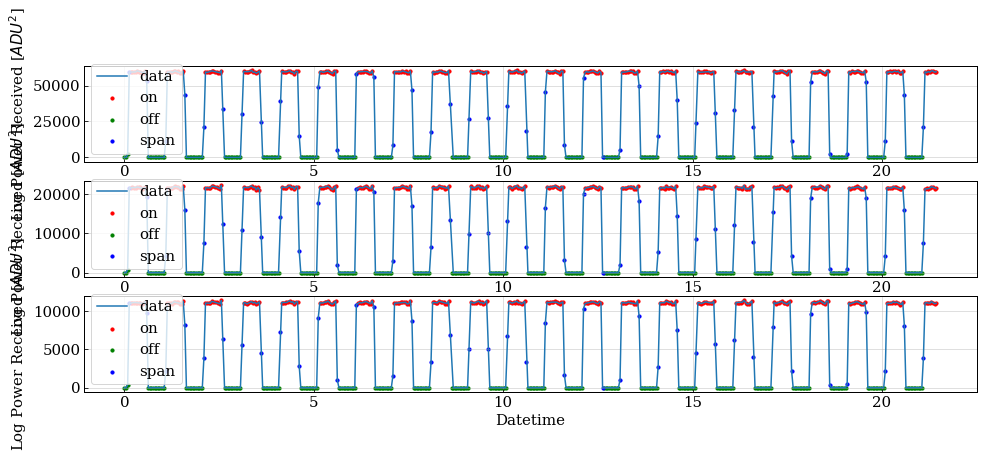

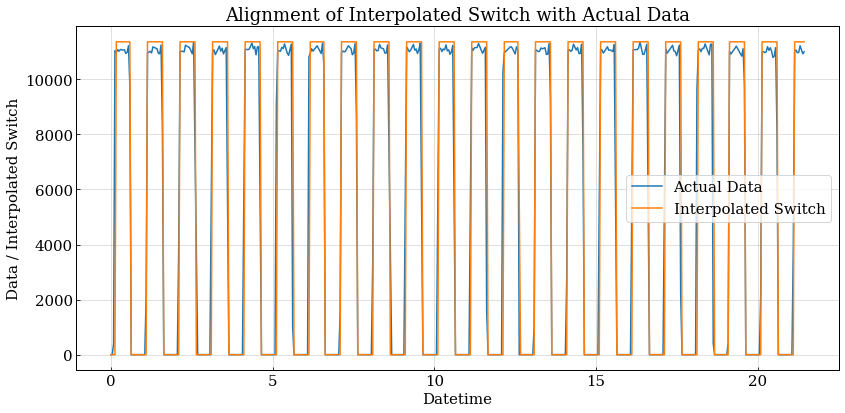

Frequency bin: 890
on_inds_f890_0702.csv
60.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [226. 726. 227.]
  --> t_deltas = [-0.774 -0.274 -0.773]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7738000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


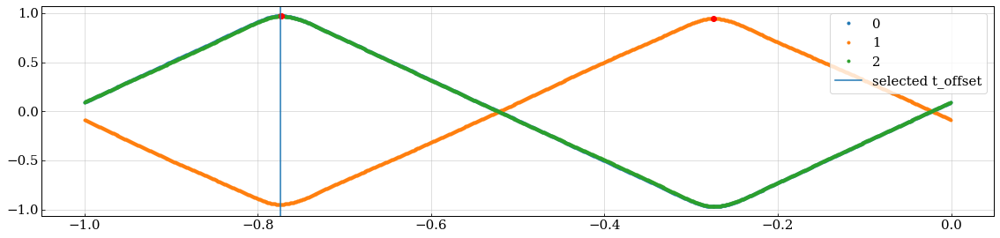

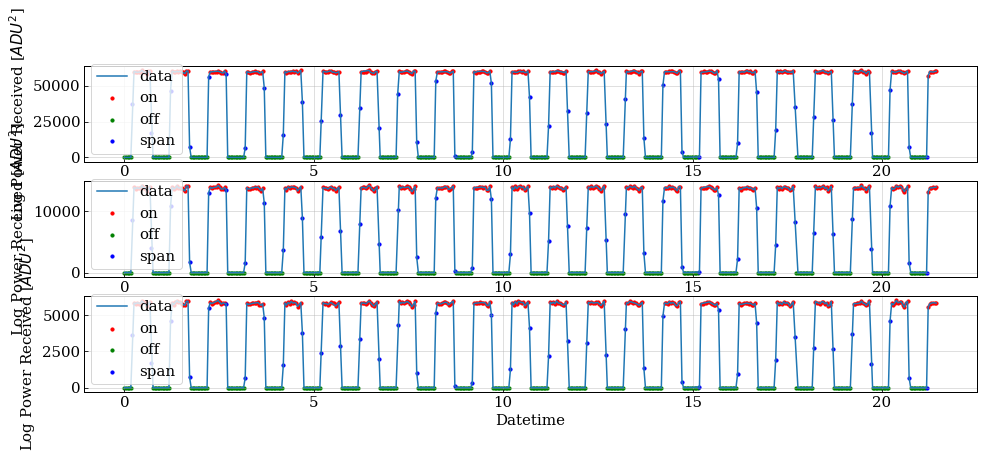

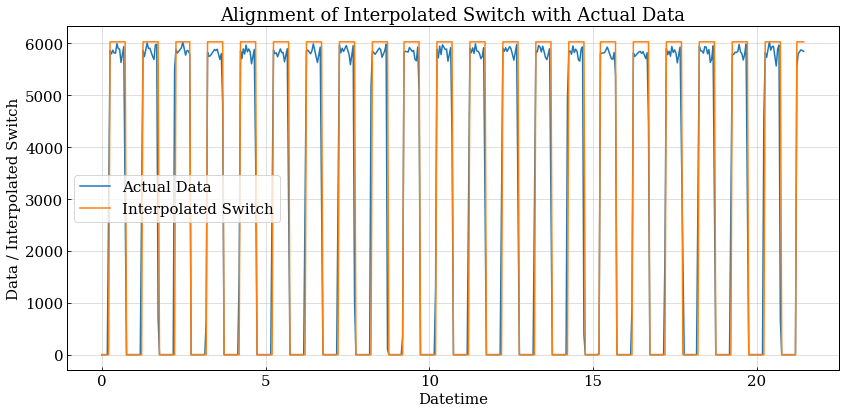

Frequency bin: 890
on_inds_f890_0702.csv
70.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 64. 566.  64.]
  --> t_deltas = [-0.936 -0.434 -0.936]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9358000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


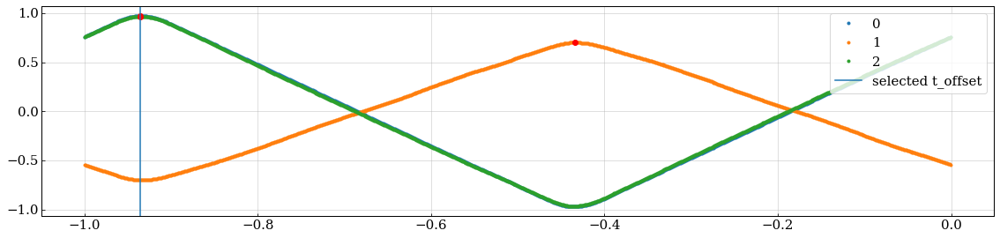

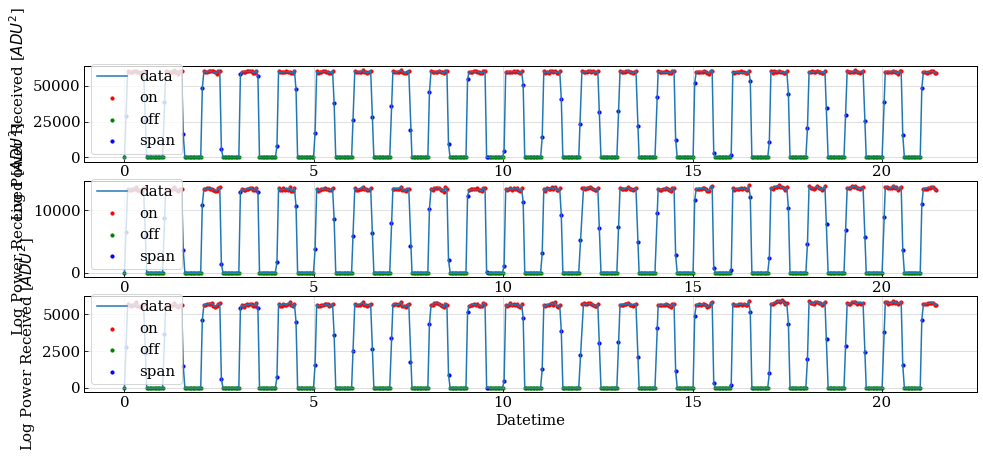

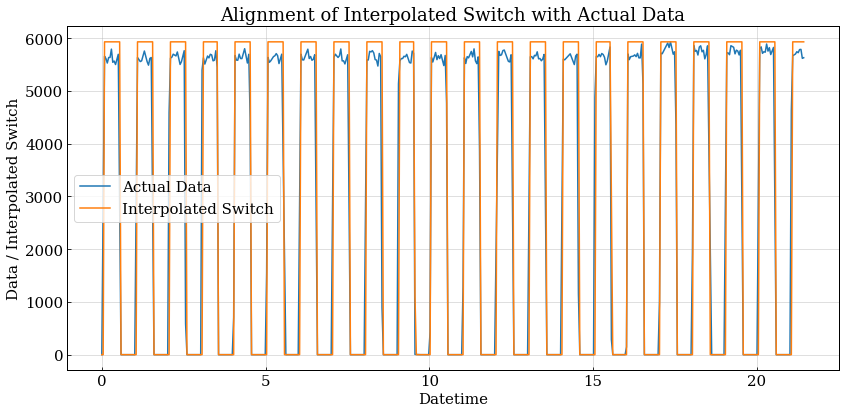

Frequency bin: 890
on_inds_f890_0702.csv
80.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [167. 666. 166.]
  --> t_deltas = [-0.833 -0.334 -0.834]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8328000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


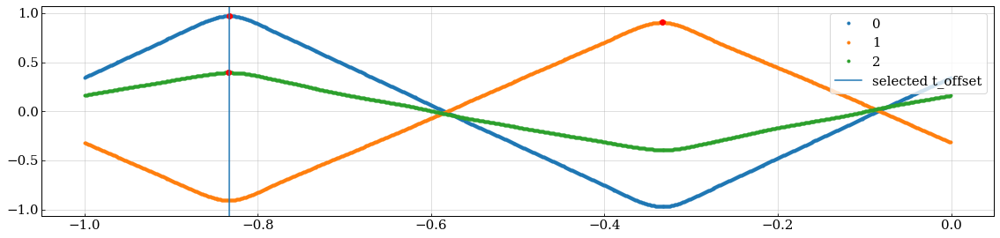

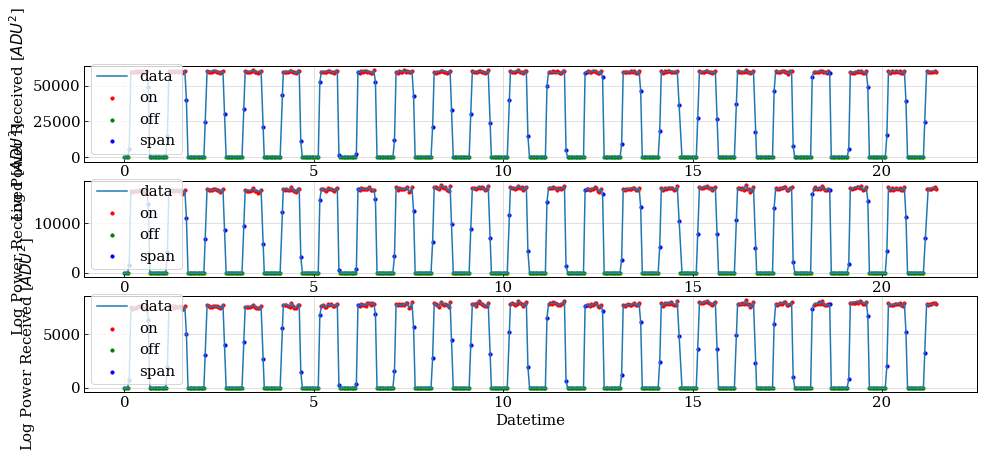

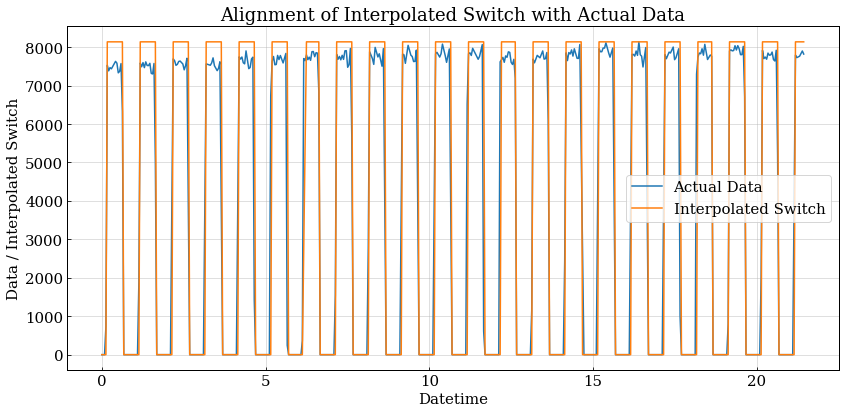

Frequency bin: 890
on_inds_f890_0702.csv
90.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [266. 270. 765.]
  --> t_deltas = [-0.734 -0.73  -0.235]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7338000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


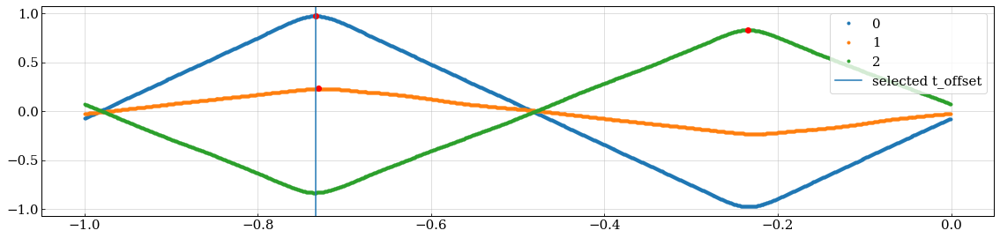

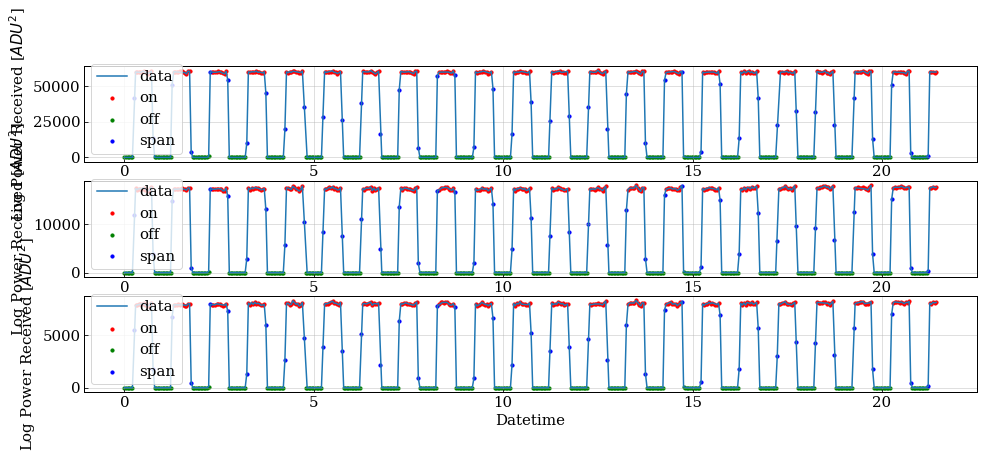

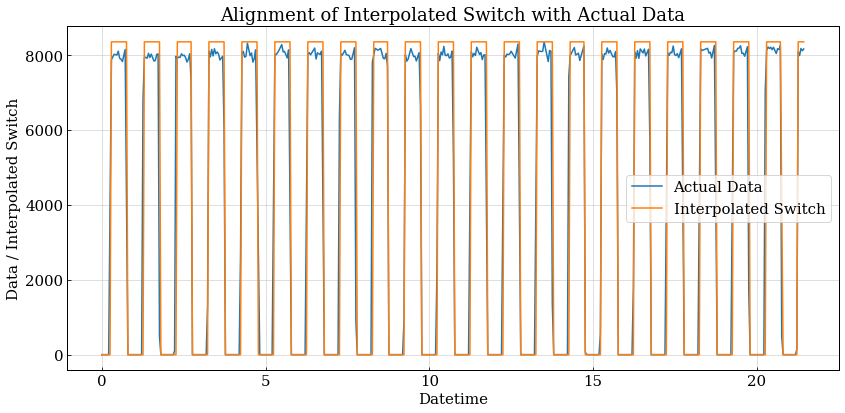

Frequency bin: 890
on_inds_f890_0702.csv
100.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [368. 871. 369.]
  --> t_deltas = [-0.632 -0.129 -0.631]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6318000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


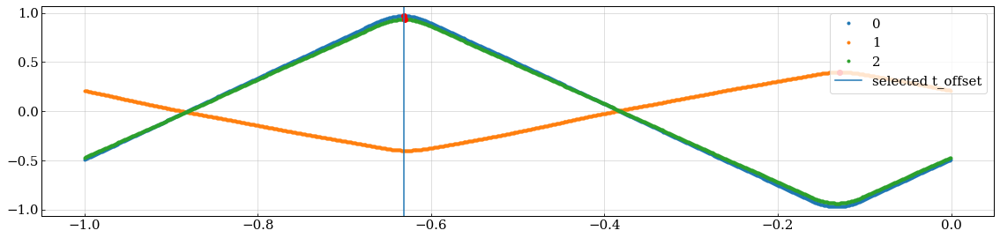

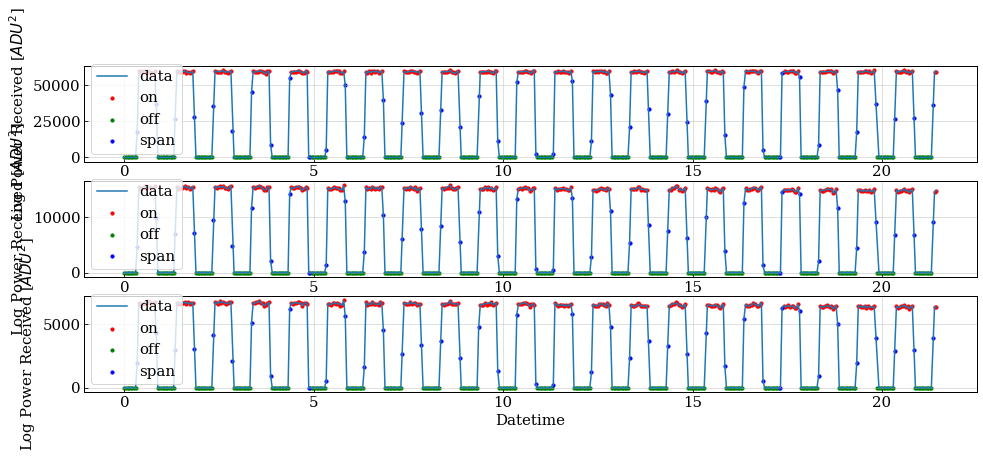

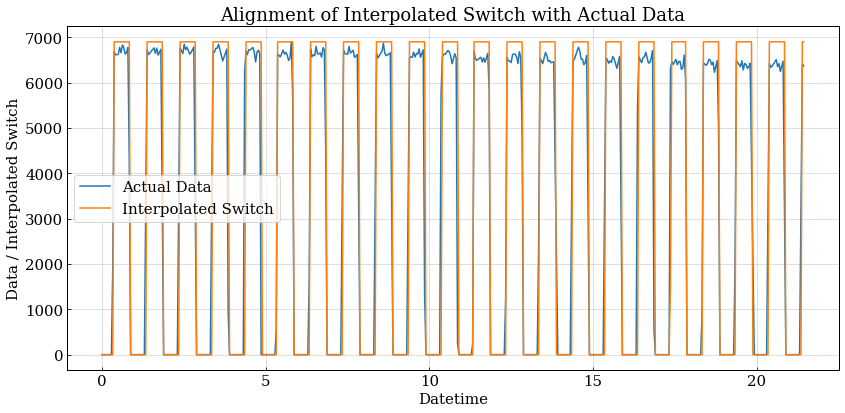

Frequency bin: 890
on_inds_f890_0702.csv
110.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [207. 207. 708.]
  --> t_deltas = [-0.793 -0.793 -0.292]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7928000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


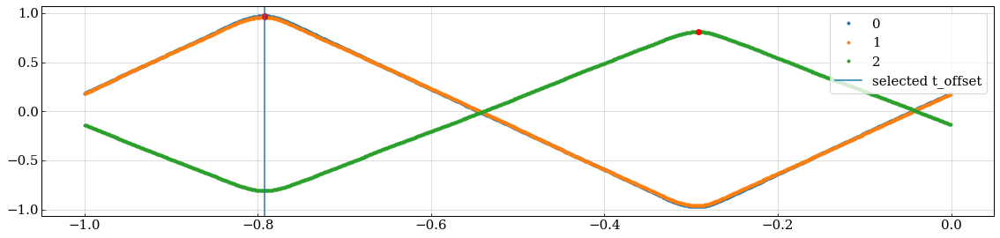

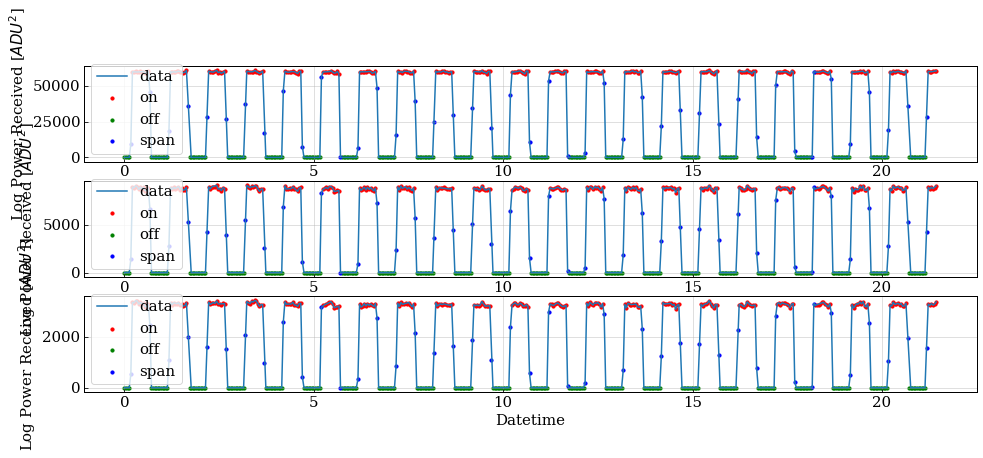

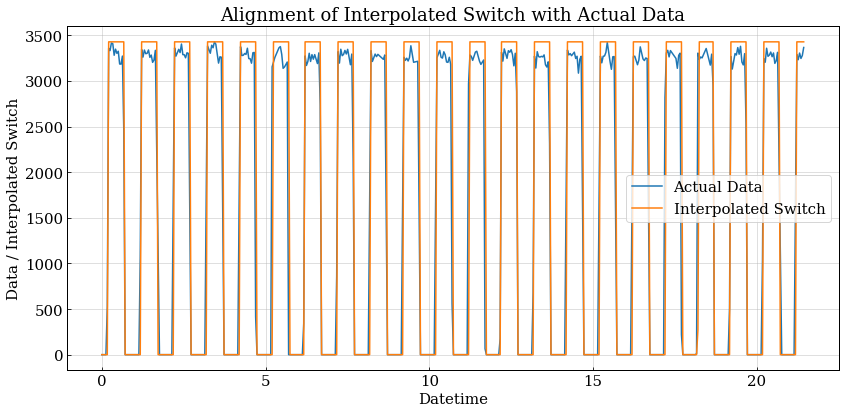

Frequency bin: 890
on_inds_f890_0702.csv
120.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [45. 58. 43.]
  --> t_deltas = [-0.955 -0.942 -0.957]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9548000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


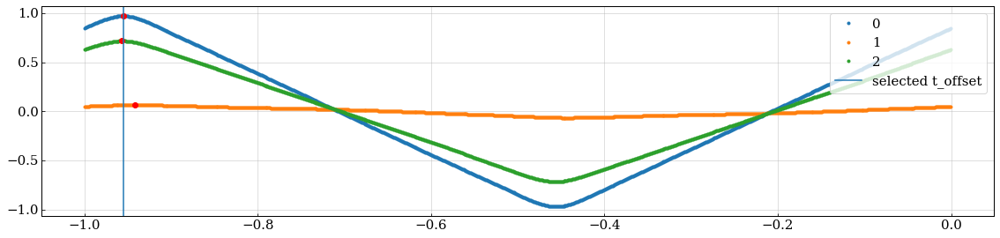

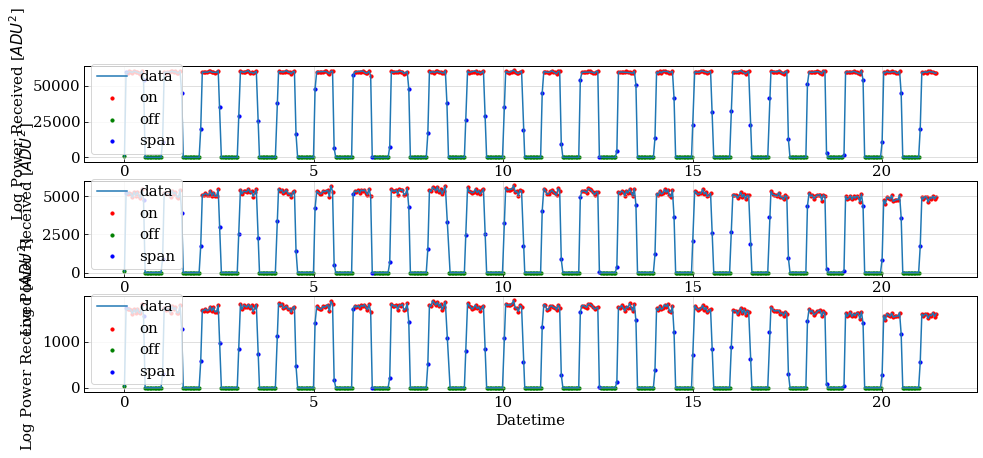

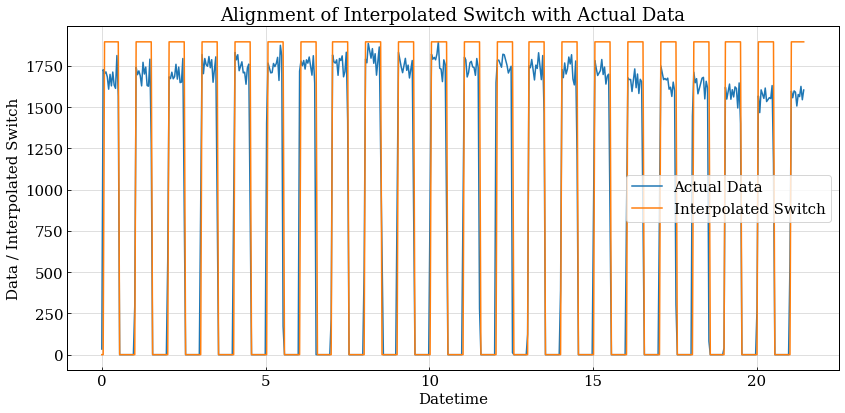

Frequency bin: 890
on_inds_f890_0702.csv
130.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [881. 382. 879.]
  --> t_deltas = [-0.119 -0.618 -0.121]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1188000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


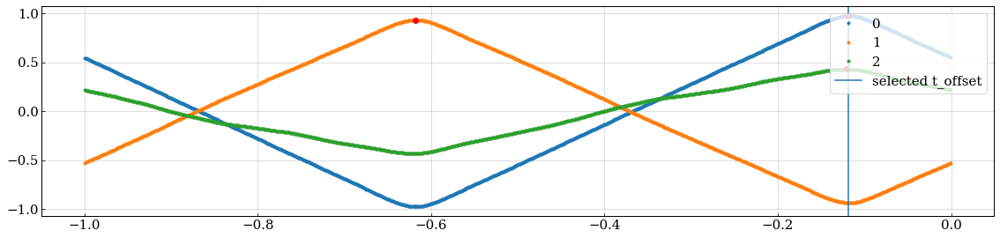

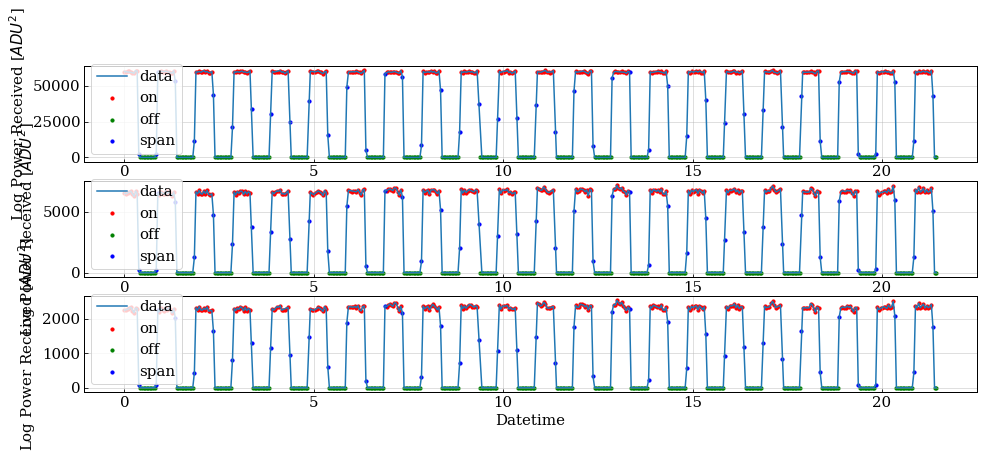

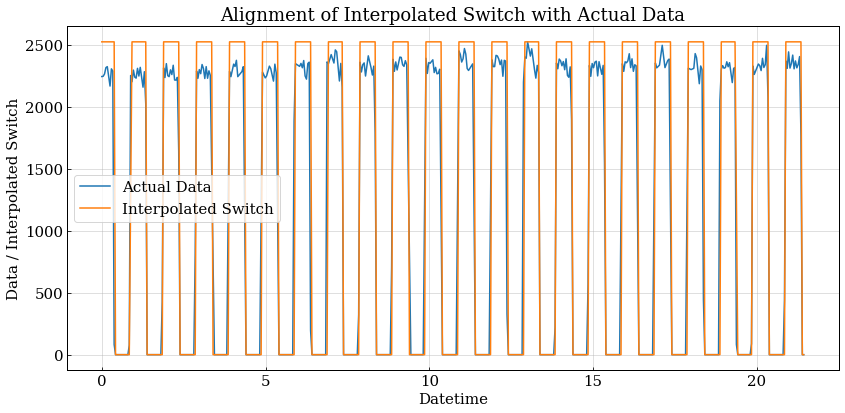

Frequency bin: 890
on_inds_f890_0702.csv
140.0
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [981. 482. 981.]
  --> t_deltas = [-0.019 -0.518 -0.019]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0188000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


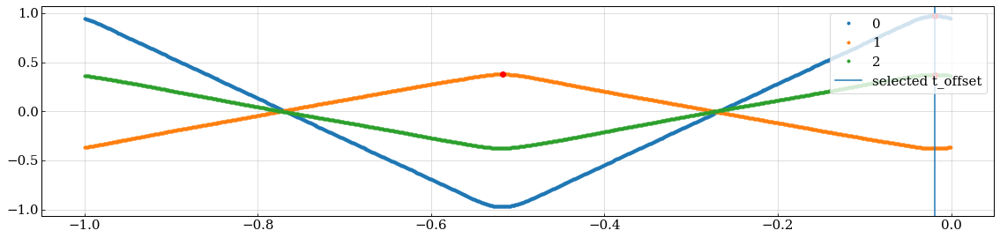

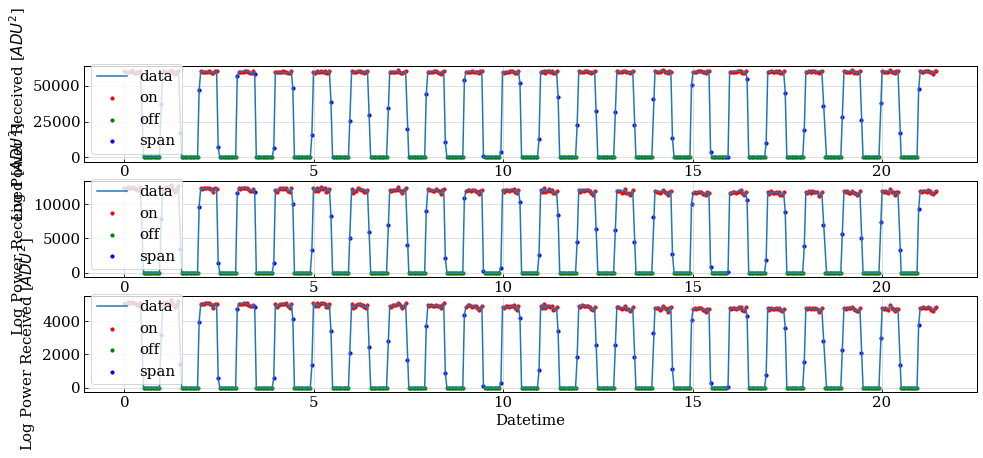

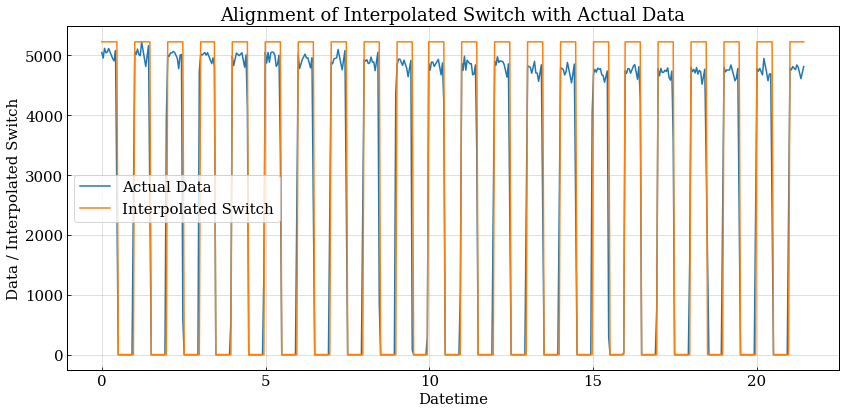

Frequency bin: 890
on_inds_f890_0702.csv


In [10]:
for angle in angles:
    corr_on_inds(angle)

-120
Done!!!!!!!
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [957. 456. 947.]
  --> t_deltas = [-0.042 -0.543 -0.052]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0418000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


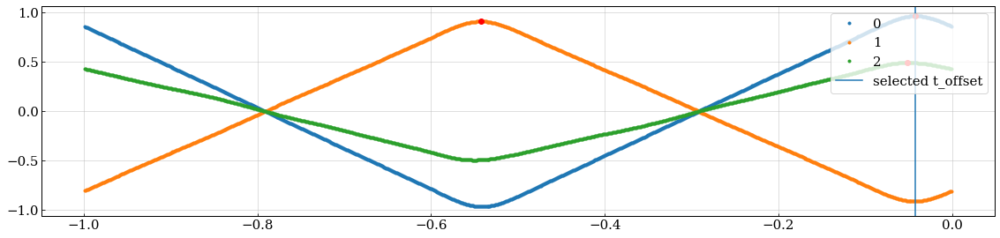

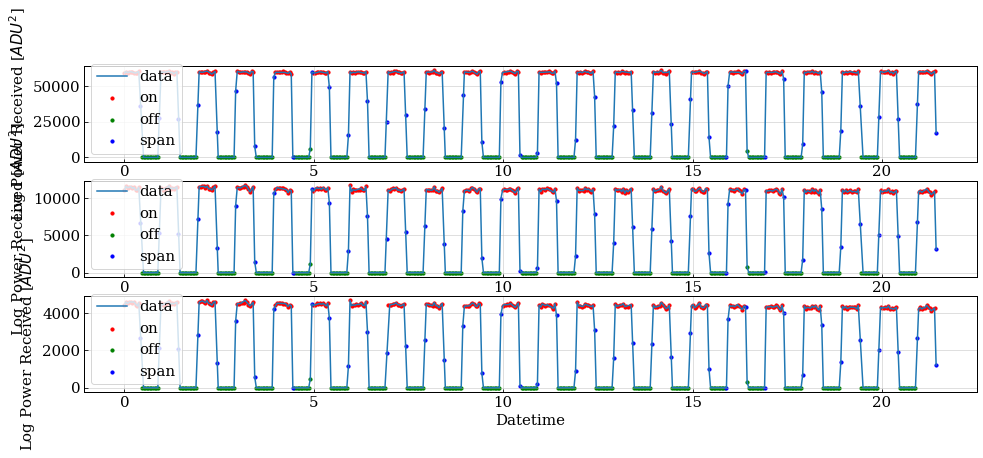

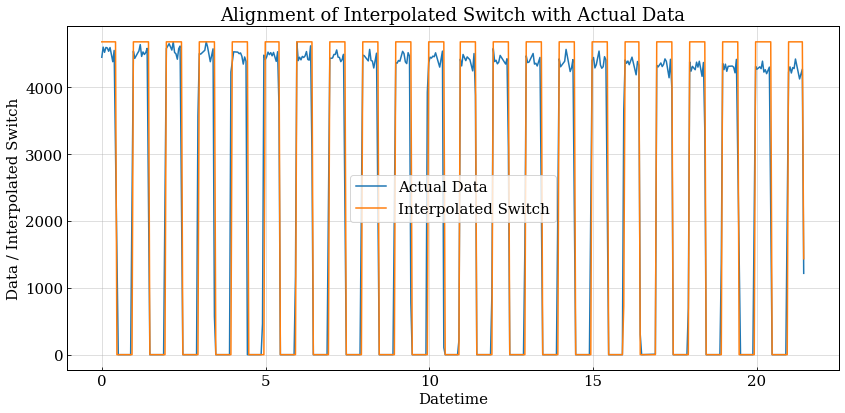

Frequency bin: 890
on_inds_f890_0702.csv


In [11]:
corr_on_inds(-120,period=0.9988e6)

In [7]:
#Using the same "on" indicies to get SNR values and make waterfalls 
#So basically using the same "on" indicies for all frequency bins because they'll basically the same

f_plot = 890

csv_filename = 'on_inds_f'+str(f_plot)+'_0702.csv'
# Initialize an empty list to store rows
import ast  # For literal_eval

# Initialize empty lists for each column
angles = []
on_inds = []

# Read CSV file and populate lists
with open(csv_filename, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Skip header if exists
    for row in csvreader:
        angles.append(row[0])  # Assuming the first column is single integers
        on_inds.append(ast.literal_eval(row[1]))  # Convert string representation of list to actual list


#start with one channel and one angle


channels = [0,1,4]

n_freq_bins= len(pow_mag[0,:,0]) #this probably isn't right so fix it
freq_bins = list(range(n_freq_bins))

# Initialize nested dictionaries to store data
data = {}

for channel in channels:
    data[channel] = {}
    for j in range(len(angles)):
        ang = float(angles[j])
        on_ind = on_inds[j]
        
        f_start = angle_to_files[ang][0]
        f_stop = angle_to_files[ang][-1]
        corr_data = read_corr_mode_h5(file_path, f_start=f_start, f_stop=f_stop)
        pow_mag, pow_phase = get_mag_phase(corr_data.vis)
        
        data[channel][str(ang)] = {'signal': [], 'noise': []}
        for n in range(n_freq_bins):
            all_data = pow_mag[:, n, channel]
            mag_data = all_data[on_ind]
            signal = np.mean(mag_data)
            noise = np.std(mag_data)
            data[channel][str(ang)]['signal'].append(signal)
            data[channel][str(ang)]['noise'].append(noise)
    

#make a log version of signal_data as well
#so we need a regual signal data plot, a linearlly normalized to 1 signal data plot, and a linearlly normalized + logged signal plot
#And a SNR plot

Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done

In [8]:
# Function to extract and sort signals and noises
# sorting because they angles were measured out of order to make plotting easier

def extract_and_sort_signals(data_index):
    # Initialize lists to store signals and noises
    signals = []
    noises = []

    # Extract angles from keys and convert to float
    angles = [float(ang_str) for ang_str in data[data_index].keys()]

    # Sort angles numerically
    sorted_angles = sorted(angles)

    # Reorganize signals and noises according to sorted angles
    for ang in sorted_angles:
        ang_str = str(ang)  # Convert back to string to access data
        signals.append(data[data_index][ang_str]['signal'])
        noises.append(data[data_index][ang_str]['noise'])

    # Convert to numpy arrays for easier manipulation later
    signals = np.array(signals)
    noises = np.array(noises)

    return signals, noises

# Extract and sort signals and noises for index 0 (already done)
signals_00, noise_00 = extract_and_sort_signals(0)

# Extract and sort signals and noises for index 1
signals_01, noise_01 = extract_and_sort_signals(1)

# Extract and sort signals and noises for index 4
signals_11, noise_11 = extract_and_sort_signals(4)

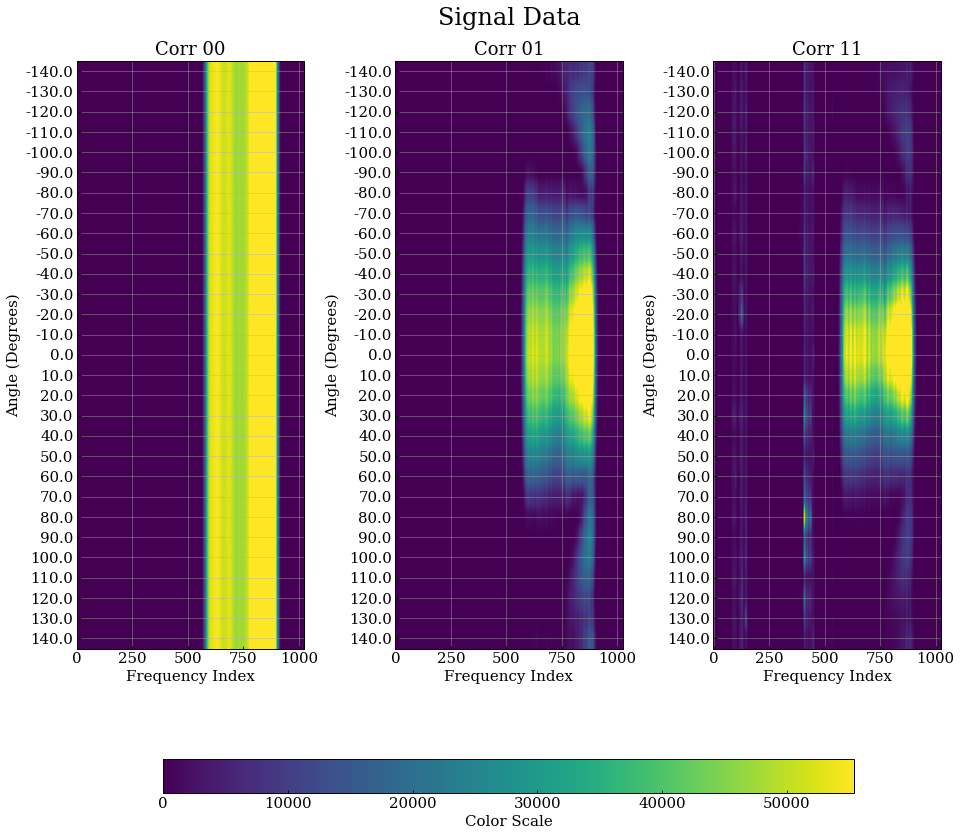

In [9]:
#Waterfall Plot of Raw Signal Data


# Compute global min and max for color scale
all_signals = np.concatenate([signals_00.ravel(), signals_01.ravel(), signals_11.ravel()])
global_vmin = np.nanpercentile(all_signals, 5)
global_vmax = np.nanpercentile(all_signals, 95)

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 15))  # Don't share y-axis

# Define the angle labels
angles_labels = sorted([float(ang_str) for ang_str in data[0].keys()])  # Adjust this according to the data
yticks_positions = np.arange(len(angles_labels))

# Plot for signals_00
cax1 = axes[0].imshow(signals_00, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[0].set_xlabel("Frequency Index")
axes[0].set_ylabel("Angle (Degrees)")
axes[0].set_title("Corr 00")
axes[0].set_yticks(ticks=yticks_positions)
axes[0].set_yticklabels(angles_labels)

# Plot for signals_01
cax2 = axes[1].imshow(signals_01, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[1].set_xlabel("Frequency Index")
axes[1].set_ylabel("Angle (Degrees)")
axes[1].set_title("Corr 01")
axes[1].set_yticks(ticks=yticks_positions)
axes[1].set_yticklabels(angles_labels)

# Plot for signals_11
cax3 = axes[2].imshow(signals_11, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[2].set_xlabel("Frequency Index")
axes[2].set_ylabel("Angle (Degrees)")
axes[2].set_title("Corr 11")
axes[2].set_yticks(ticks=yticks_positions)
axes[2].set_yticklabels(angles_labels)

# Adjust subplot parameters to add space between plots and center the middle plot
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.4, bottom=0.2)

# Add a single color bar at the bottom with adjusted size
cbar = fig.colorbar(cax1, ax=axes, orientation='horizontal', pad=0.15, fraction=0.05, shrink=0.8)
cbar.set_label('Color Scale')

# Add an overall title for the entire figure
plt.suptitle("Signal Data", fontsize=24,y=0.93)

plt.show()


<ipython-input-15-a95a866b9f8b>:2: RuntimeWarning: divide by zero encountered in divide
  snr_00 = np.where(noise_00 != 0, signals_00 / noise_00, 0)
<ipython-input-15-a95a866b9f8b>:2: RuntimeWarning: invalid value encountered in divide
  snr_00 = np.where(noise_00 != 0, signals_00 / noise_00, 0)
<ipython-input-15-a95a866b9f8b>:3: RuntimeWarning: divide by zero encountered in divide
  snr_01 = np.where(noise_01 != 0, signals_01 / noise_01, 0)
<ipython-input-15-a95a866b9f8b>:3: RuntimeWarning: invalid value encountered in divide
  snr_01 = np.where(noise_01 != 0, signals_01 / noise_01, 0)
<ipython-input-15-a95a866b9f8b>:4: RuntimeWarning: divide by zero encountered in divide
  snr_11 = np.where(noise_11 != 0, signals_11 / noise_11, 0)
<ipython-input-15-a95a866b9f8b>:4: RuntimeWarning: invalid value encountered in divide
  snr_11 = np.where(noise_11 != 0, signals_11 / noise_11, 0)


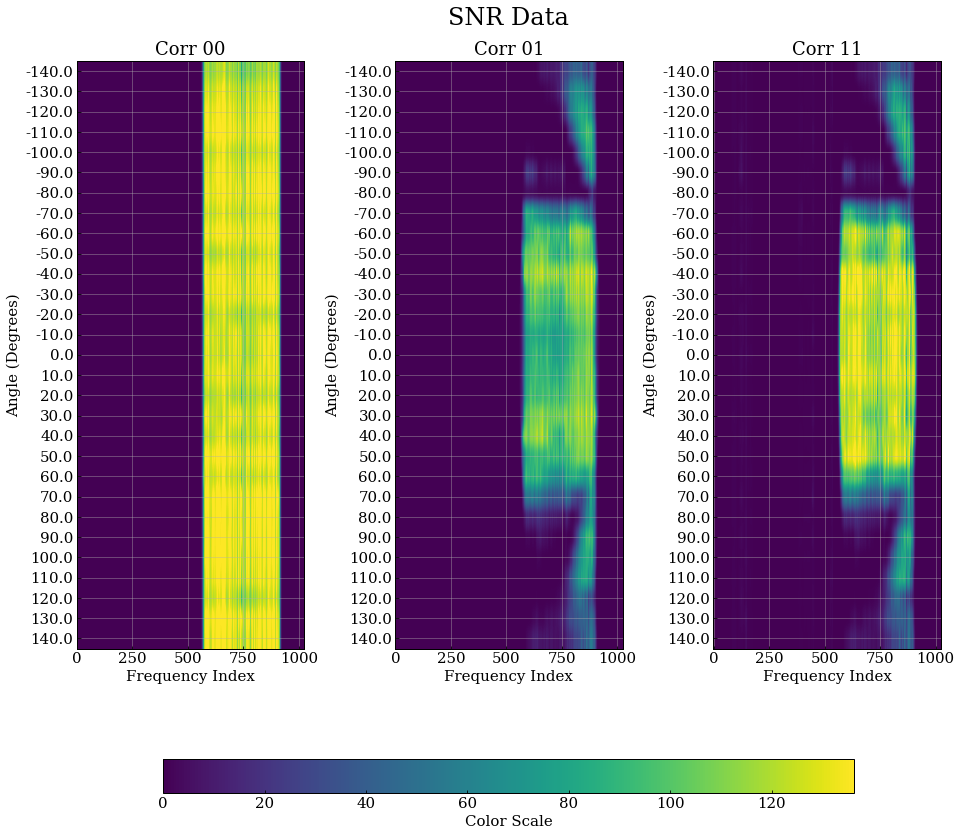

In [15]:
#Waterfall plot of SNR data

# Prevent divide-by-zero errors
snr_00 = np.where(noise_00 != 0, signals_00 / noise_00, 0)
snr_01 = np.where(noise_01 != 0, signals_01 / noise_01, 0)
snr_11 = np.where(noise_11 != 0, signals_11 / noise_11, 0)

# Compute global min and max for color scale
all_snr = np.concatenate([snr_00.ravel(), snr_01.ravel(), snr_11.ravel()])
global_vmin = np.nanpercentile(all_snr, 5)
global_vmax = np.nanpercentile(all_snr, 95)

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 15))  # Don't share y-axis

# Define the angle labels
angles_labels = sorted([float(ang_str) for ang_str in data[0].keys()])  # Adjust this according to the data
yticks_positions = np.arange(len(angles_labels))

# Plot for snr_00
cax1 = axes[0].imshow(snr_00, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[0].set_xlabel("Frequency Index")
axes[0].set_ylabel("Angle (Degrees)")
axes[0].set_title("Corr 00")
axes[0].set_yticks(ticks=yticks_positions)
axes[0].set_yticklabels(angles_labels)

# Plot for snr_01
cax2 = axes[1].imshow(snr_01, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[1].set_xlabel("Frequency Index")
axes[1].set_ylabel("Angle (Degrees)")
axes[1].set_title("Corr 01")
axes[1].set_yticks(ticks=yticks_positions)
axes[1].set_yticklabels(angles_labels)

# Plot for snr_11
cax3 = axes[2].imshow(snr_11, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[2].set_xlabel("Frequency Index")
axes[2].set_ylabel("Angle (Degrees)")
axes[2].set_title("Corr 11")
axes[2].set_yticks(ticks=yticks_positions)
axes[2].set_yticklabels(angles_labels)

# Adjust subplot parameters to add space between plots and center the middle plot
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.4, bottom=0.2)

# Add a single color bar at the bottom with adjusted size
cbar = fig.colorbar(cax1, ax=axes, orientation='horizontal', pad=0.15, fraction=0.05, shrink=0.8)
cbar.set_label('Color Scale')

# Add an overall title for the entire figure
plt.suptitle("SNR Data", fontsize=24,y=0.93)

plt.show()


<ipython-input-16-70aa32da415f>:9: RuntimeWarning: divide by zero encountered in divide
  signals_00_norm = np.where(max_values_00 != 0, signals_00 / max_values_00, 0)
<ipython-input-16-70aa32da415f>:9: RuntimeWarning: invalid value encountered in divide
  signals_00_norm = np.where(max_values_00 != 0, signals_00 / max_values_00, 0)
<ipython-input-16-70aa32da415f>:10: RuntimeWarning: divide by zero encountered in divide
  signals_01_norm = np.where(max_values_01 != 0, signals_01 / max_values_01, 0)
<ipython-input-16-70aa32da415f>:10: RuntimeWarning: invalid value encountered in divide
  signals_01_norm = np.where(max_values_01 != 0, signals_01 / max_values_01, 0)
<ipython-input-16-70aa32da415f>:11: RuntimeWarning: divide by zero encountered in divide
  signals_11_norm = np.where(max_values_11 != 0, signals_11 / max_values_11, 0)
<ipython-input-16-70aa32da415f>:11: RuntimeWarning: invalid value encountered in divide
  signals_11_norm = np.where(max_values_11 != 0, signals_11 / max_value

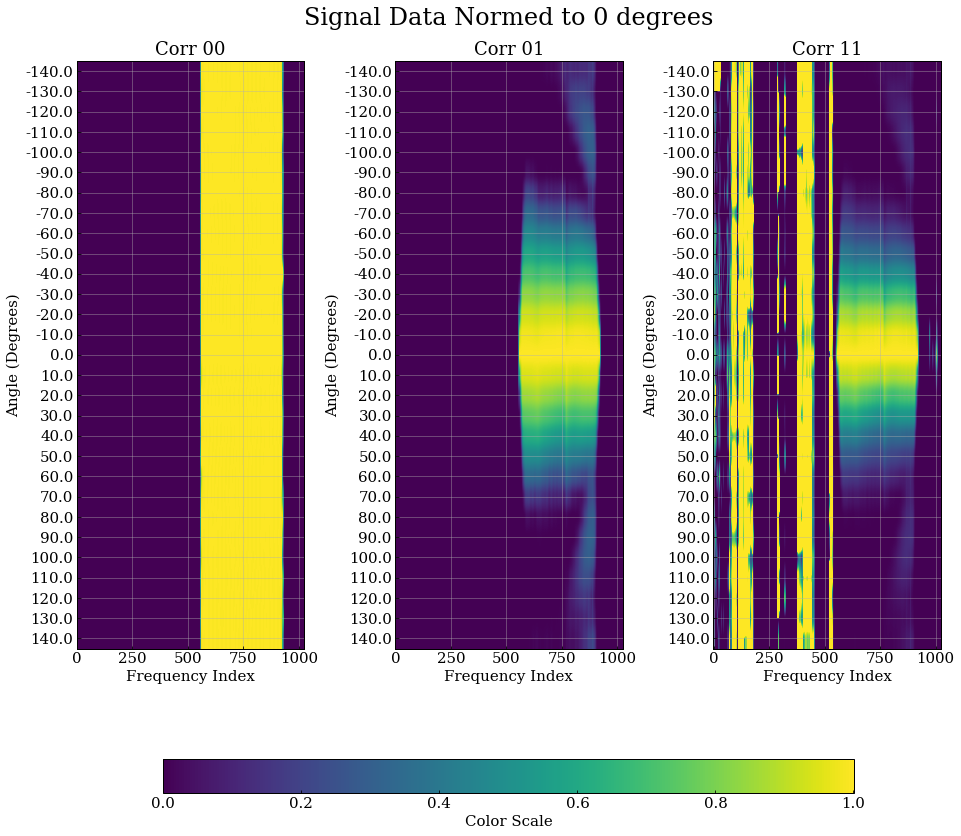

In [16]:
#Signal Data Normed to Max (=1)

# Assume signals_00 is your (29, 1024) array
# Extract the maximum values at signal_00[14] for each frequency
max_values_00 = signals_00[14, :]
max_values_01 = signals_01[14, :]
max_values_11 = signals_11[14, :]

# Normalize the signals_00 array
# Avoid divide-by-zero errors by using np.where to handle cases where max_values is 0
signals_00_norm = np.where(max_values_00 != 0, signals_00 / max_values_00, 0)
signals_01_norm = np.where(max_values_01 != 0, signals_01 / max_values_01, 0)
signals_11_norm = np.where(max_values_11 != 0, signals_11 / max_values_11, 0)


# Compute global min and max for color scale
all_signals = np.concatenate([signals_00_norm.ravel(), signals_01_norm.ravel(), signals_11_norm.ravel()])
global_vmin = np.nanpercentile(all_signals, 5)
global_vmax = np.nanpercentile(all_signals, 95)

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 15))  # Don't share y-axis

# Define the angle labels
angles_labels = sorted([float(ang_str) for ang_str in data[0].keys()])  # Adjust this according to the data
yticks_positions = np.arange(len(angles_labels))

# Plot for signals_00
cax1 = axes[0].imshow(signals_00_norm, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[0].set_xlabel("Frequency Index")
axes[0].set_ylabel("Angle (Degrees)")
axes[0].set_title("Corr 00")
axes[0].set_yticks(ticks=yticks_positions)
axes[0].set_yticklabels(angles_labels)

# Plot for signals_01
cax2 = axes[1].imshow(signals_01_norm, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[1].set_xlabel("Frequency Index")
axes[1].set_ylabel("Angle (Degrees)")
axes[1].set_title("Corr 01")
axes[1].set_yticks(ticks=yticks_positions)
axes[1].set_yticklabels(angles_labels)

# Plot for signals_11
cax3 = axes[2].imshow(signals_11_norm, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[2].set_xlabel("Frequency Index")
axes[2].set_ylabel("Angle (Degrees)")
axes[2].set_title("Corr 11")
axes[2].set_yticks(ticks=yticks_positions)
axes[2].set_yticklabels(angles_labels)

# Adjust subplot parameters to add space between plots and center the middle plot
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.4, bottom=0.2)

# Add a single color bar at the bottom with adjusted size
cbar = fig.colorbar(cax1, ax=axes, orientation='horizontal', pad=0.15, fraction=0.05, shrink=0.8)
cbar.set_label('Color Scale')

# Add an overall title for the entire figure
plt.suptitle("Signal Data Normed to 0 degrees", fontsize=24,y=0.93)

plt.show()

<ipython-input-22-6618e2f32d7c>:1: RuntimeWarning: divide by zero encountered in log10
  signals_00_norm_db = np.where(signals_00_norm != 0, 10*np.log10(signals_00_norm),0)
<ipython-input-22-6618e2f32d7c>:2: RuntimeWarning: divide by zero encountered in log10
  signals_01_norm_db = np.where(signals_01_norm != 0, 20*np.log10(signals_01_norm),0)
<ipython-input-22-6618e2f32d7c>:3: RuntimeWarning: divide by zero encountered in log10
  signals_11_norm_db = np.where(signals_11_norm != 0, 10*np.log10(signals_11_norm),0)


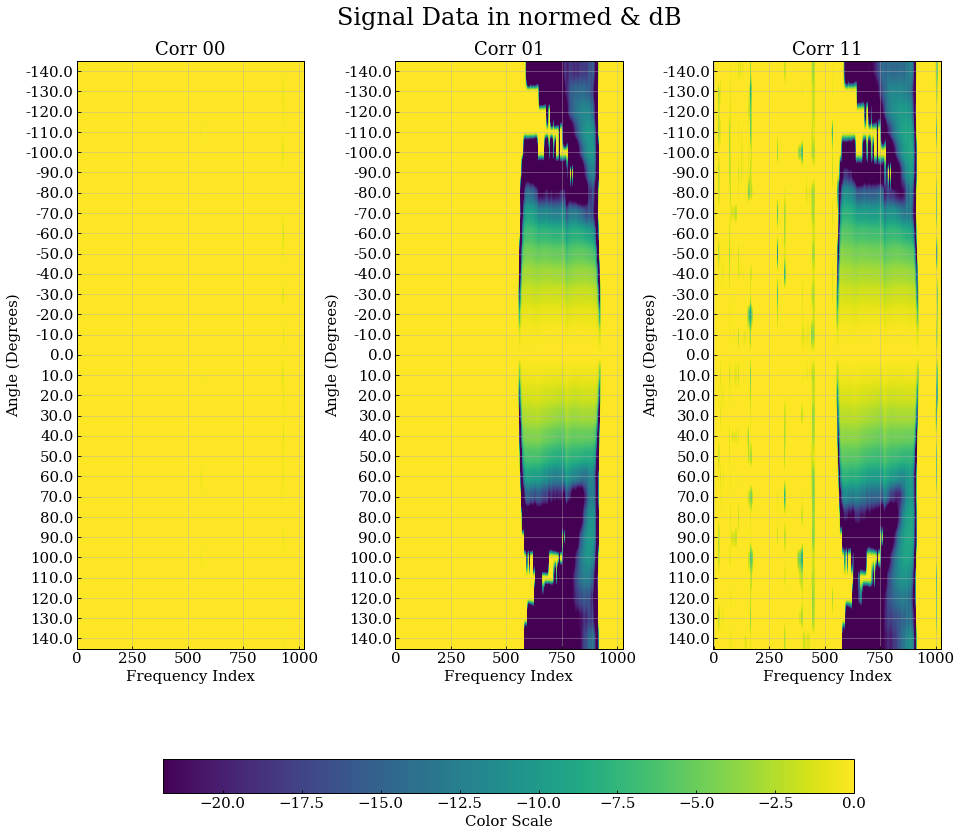

In [22]:
#Normed and dB signal data


signals_00_norm_db = np.where(signals_00_norm != 0, 10*np.log10(signals_00_norm),0)
signals_01_norm_db = np.where(signals_01_norm != 0, 20*np.log10(signals_01_norm),0)
signals_11_norm_db = np.where(signals_11_norm != 0, 10*np.log10(signals_11_norm),0)

# Compute global min and max for color scale
all_signals = np.concatenate([signals_00_norm_db.ravel(), signals_01_norm_db.ravel(), signals_11_norm_db.ravel()])
global_vmin = np.nanpercentile(all_signals, 5)
global_vmax = np.nanpercentile(all_signals, 95)

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 15))  # Don't share y-axis

# Define the angle labels
angles_labels = sorted([float(ang_str) for ang_str in data[0].keys()])  # Adjust this according to the data
yticks_positions = np.arange(len(angles_labels))

# Plot for signals_00
cax1 = axes[0].imshow(signals_00_norm_db, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[0].set_xlabel("Frequency Index")
axes[0].set_ylabel("Angle (Degrees)")
axes[0].set_title("Corr 00")
axes[0].set_yticks(ticks=yticks_positions)
axes[0].set_yticklabels(angles_labels)

# Plot for signals_01
cax2 = axes[1].imshow(signals_01_norm_db, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[1].set_xlabel("Frequency Index")
axes[1].set_ylabel("Angle (Degrees)")
axes[1].set_title("Corr 01")
axes[1].set_yticks(ticks=yticks_positions)
axes[1].set_yticklabels(angles_labels)

# Plot for signals_11
cax3 = axes[2].imshow(signals_11_norm_db, aspect='auto', vmin=global_vmin, vmax=global_vmax)
axes[2].set_xlabel("Frequency Index")
axes[2].set_ylabel("Angle (Degrees)")
axes[2].set_title("Corr 11")
axes[2].set_yticks(ticks=yticks_positions)
axes[2].set_yticklabels(angles_labels)

# Adjust subplot parameters to add space between plots and center the middle plot
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.4, bottom=0.2)

# Add a single color bar at the bottom with adjusted size
cbar = fig.colorbar(cax1, ax=axes, orientation='horizontal', pad=0.15, fraction=0.05, shrink=0.8)
cbar.set_label('Color Scale')

# Add an overall title for the entire figure
plt.suptitle("Signal Data in normed & dB", fontsize=24,y=0.93)

plt.show()

<ipython-input-23-90603ca8d326>:6: RuntimeWarning: divide by zero encountered in log10
  signals_00_norm_db = np.where(signals_00_norm != 0, 10*np.log10(signals_00_norm), 0)
<ipython-input-23-90603ca8d326>:7: RuntimeWarning: divide by zero encountered in log10
  signals_01_norm_db = np.where(signals_01_norm != 0, 20*np.log10(signals_01_norm), 0)
<ipython-input-23-90603ca8d326>:8: RuntimeWarning: divide by zero encountered in log10
  signals_11_norm_db = np.where(signals_11_norm != 0, 10*np.log10(signals_11_norm), 0)


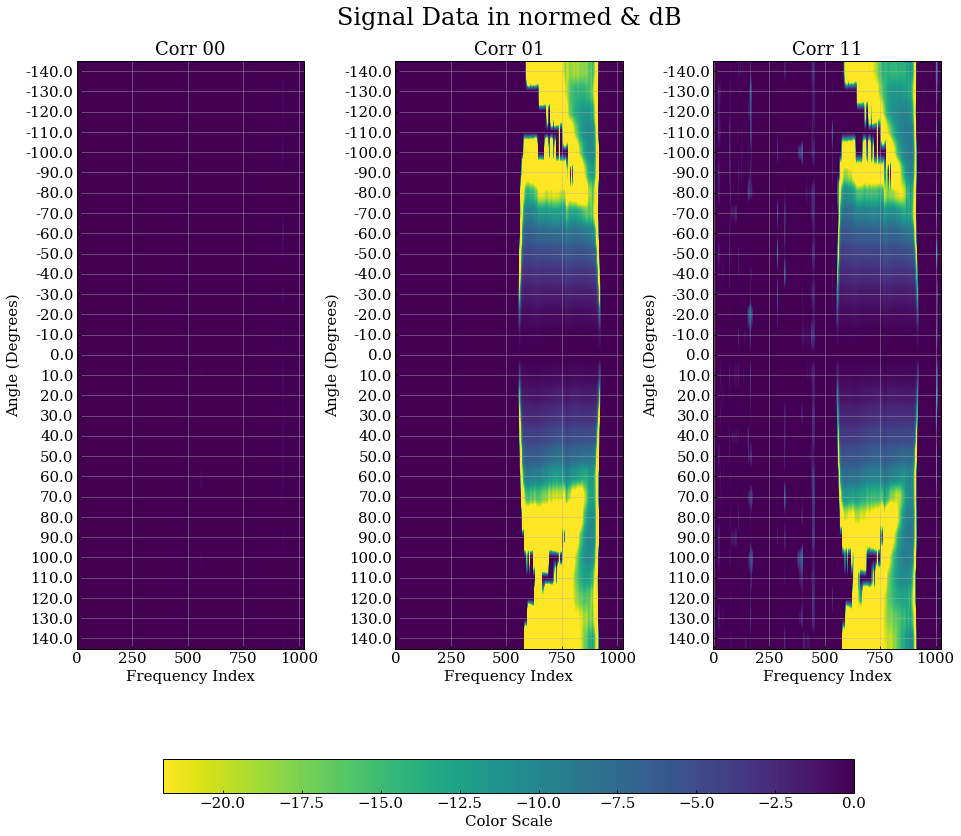

In [23]:
#Normed and db data again just inverting the colorscale

signals_00_norm_db = np.where(signals_00_norm != 0, 10*np.log10(signals_00_norm), 0)
signals_01_norm_db = np.where(signals_01_norm != 0, 20*np.log10(signals_01_norm), 0)
signals_11_norm_db = np.where(signals_11_norm != 0, 10*np.log10(signals_11_norm), 0)

# Compute global min and max for color scale
all_signals = np.concatenate([signals_00_norm_db.ravel(), signals_01_norm_db.ravel(), signals_11_norm_db.ravel()])
global_vmin = np.nanpercentile(all_signals, 95)  # Reversed
global_vmax = np.nanpercentile(all_signals, 5)   # Reversed

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 15))  # Don't share y-axis

# Define the angle labels
angles_labels = sorted([float(ang_str) for ang_str in data[0].keys()])  # Adjust this according to the data
yticks_positions = np.arange(len(angles_labels))

# Define a reversed colormap
colormap = plt.cm.viridis_r  # Example: reversing the 'viridis' colormap

# Plot for signals_00
cax1 = axes[0].imshow(signals_00_norm_db, aspect='auto', vmin=global_vmax, vmax=global_vmin, cmap=colormap)
axes[0].set_xlabel("Frequency Index")
axes[0].set_ylabel("Angle (Degrees)")
axes[0].set_title("Corr 00")
axes[0].set_yticks(ticks=yticks_positions)
axes[0].set_yticklabels(angles_labels)

# Plot for signals_01
cax2 = axes[1].imshow(signals_01_norm_db, aspect='auto', vmin=global_vmax, vmax=global_vmin, cmap=colormap)
axes[1].set_xlabel("Frequency Index")
axes[1].set_ylabel("Angle (Degrees)")
axes[1].set_title("Corr 01")
axes[1].set_yticks(ticks=yticks_positions)
axes[1].set_yticklabels(angles_labels)

# Plot for signals_11
cax3 = axes[2].imshow(signals_11_norm_db, aspect='auto', vmin=global_vmax, vmax=global_vmin, cmap=colormap)
axes[2].set_xlabel("Frequency Index")
axes[2].set_ylabel("Angle (Degrees)")
axes[2].set_title("Corr 11")
axes[2].set_yticks(ticks=yticks_positions)
axes[2].set_yticklabels(angles_labels)

# Adjust subplot parameters to add space between plots and center the middle plot
plt.subplots_adjust(left=0.1, right=0.9, wspace=0.4, bottom=0.2)

# Add a single color bar at the bottom with adjusted size
cbar = fig.colorbar(cax1, ax=axes, orientation='horizontal', pad=0.15, fraction=0.05, shrink=0.8)
cbar.set_label('Color Scale')

# Add an overall title for the entire figure
plt.suptitle("Signal Data in normed & dB", fontsize=24, y=0.93)

plt.show()


In [22]:
#Radiometer Test Attempt

f_plot = 890
csv_filename = 'on_inds_f' + str(f_plot) + '_0702.csv'

# Initialize lists for columns
angles = []
on_inds = []

# Read CSV file
with open(csv_filename, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Skip header if it exists
    for row in csvreader:
        angles.append(row[0])  # Assuming the first column is angle values
        on_inds.append(ast.literal_eval(row[1]))  # Convert string to list

# Initialize parameters
channels = [0, 1, 4]
n_freq_bins = len(pow_mag[0, :, 0])  # Ensure this is set correctly
freq_bins = list(range(n_freq_bins))

# Initialize nested dictionaries for storing results
radio_test = {}

for channel in channels:
    radio_test[channel] = {}
    for j in range(len(angles)):
        ang = float(angles[j])
        on_ind = on_inds[j]

        f_start = angle_to_files[ang][0]
        f_stop = angle_to_files[ang][-1]
        corr_data = read_corr_mode_h5(file_path, f_start=f_start, f_stop=f_stop)
        pow_mag, pow_phase = get_mag_phase(corr_data.vis)
        
        # Initialize the dictionary for the current angle if not already present
        if str(ang) not in radio_test[channel]:
            radio_test[channel][str(ang)] = {'r_test_value': []}
        
        for n in range(n_freq_bins):
            all_data = pow_mag[:, n, channel]
            mag_data = all_data[on_ind]
            signal = np.mean(mag_data)
            noise = np.var(mag_data)
            bw = len(mag_data)
            
            # Calculate r_test_value and handle division by zero
            if signal == 0:
                r_test_value = np.nan
            else:
                r_test_value = np.sqrt(bw)*noise / signal
    
            
            radio_test[channel][str(ang)]['r_test_value'].append(r_test_value)


Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done!!!!!!!
Done

No handles with labels found to put in legend.


Angles: [   0.  -10.  -20.  -30.  -40.  -50.  -60.  -70.  -80.  -90. -100. -110.
 -120. -130. -140.   10.   20.   30.   40.   50.   60.   70.   80.   90.
  100.  110.  120.  130.  140.]
R Test Values: [  68.98113735   64.72146562   71.02995082   64.16772791   67.87658245
   84.93787276   63.93681269   70.54266562   62.14800745   68.47060634
   68.83483621   63.23101844 2002.32424486   67.73329653   74.26106506
   62.7547794    74.26543679   64.27351576   64.94114603   61.50896427
   67.54124764   66.58885195   60.74177478   62.3568582    60.64213112
   61.97784197   71.1320141    64.17890292   61.53831211]


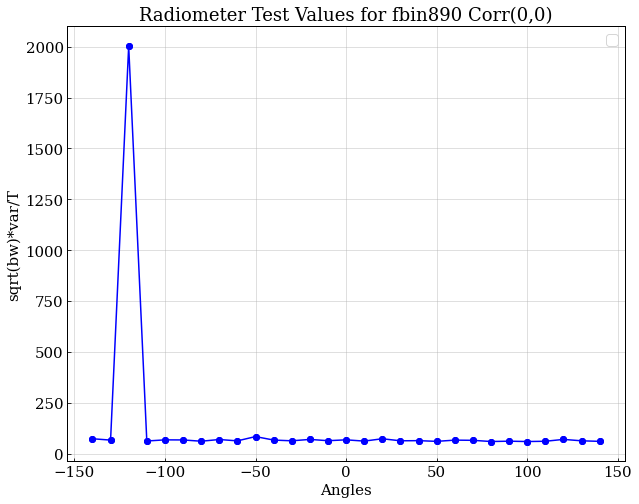

In [23]:
# Define the channel and frequency index you want to inspect
channel_to_check = 0  # Example channel
freq_index_to_check = 890  # Example frequency index

# Initialize lists to store the results
angles_list = []
r_test_values_list = []

# Extract r_test_value for all angles at the specified channel and frequency index
for ang, data in radio_test[channel_to_check].items():
    angles_list.append(float(ang))
    # Get the r_test_value for the specified frequency index
    if len(data['r_test_value']) > freq_index_to_check:
        r_test_value = data['r_test_value'][freq_index_to_check]
    else:
        r_test_value = np.nan  # Handle cases where the frequency index might be out of bounds
    r_test_values_list.append(r_test_value)

# Convert lists to numpy arrays for easier handling
angles_array = np.array(angles_list)
r_test_values_array = np.array(r_test_values_list)

# Specify the path to your CSV file
freq_csv = 'corr_stats/on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 

# Print the arrays
print("Angles:", angles_array)
print("R Test Values:", r_test_values_array)

plt.figure(figsize=(10,8))
plt.scatter(angles, r_test_values_array,color='blue')
#plt.scatter(angles,snr_00,label='T/std',color='red')
#plt.scatter(angles,snr_11,label='T/std(1,1)',color='indigo')
#plt.scatter(angles,snr,label='T/std(0,1)',color='magenta')
plt.plot([angles[i] for i in sorted_indices],[r_test_values_array[i] for i in sorted_indices],marker='o', linestyle='-',color='blue')
#plt.plot([angles[i] for i in sorted_indices], [snr_00[i] for i in sorted_indices], marker='o', linestyle='-', color='red')
#plt.plot([angles[i] for i in sorted_indices], [snr_11[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
#plt.plot([angles[i] for i in sorted_indices], [snr[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
plt.title('Radiometer Test Values for fbin'+str(freq_index_to_check)+' Corr(0,0)')
plt.xlabel("Angles")
plt.ylabel("sqrt(bw)*var/T")
plt.legend()

No handles with labels found to put in legend.


Angles: [   0.  -10.  -20.  -30.  -40.  -50.  -60.  -70.  -80.  -90. -100. -110.
 -120. -130. -140.   10.   20.   30.   40.   50.   60.   70.   80.   90.
  100.  110.  120.  130.  140.]
R Test Values: [ 97.02327396 111.41799172  94.51913015  67.8097439   45.17390717
  69.04663995  41.02151018 269.4394999  721.83187651  46.02617868
  46.04421821  34.6593936  446.16119616  49.95419793 151.43518949
  72.84793497  83.61819612  57.60916584  54.32495127  38.26175424
  48.60766916  42.38477286  81.74608469  50.60555353  67.40137079
  37.23170002 141.92173657  59.88664726 108.59805316]


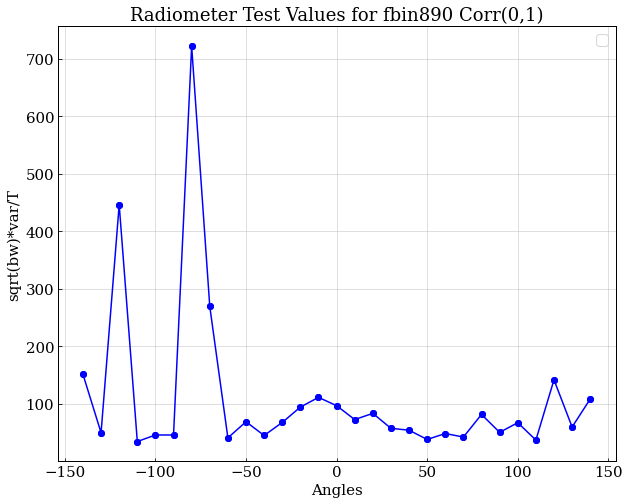

In [24]:
# Define the channel and frequency index you want to inspect
channel_to_check = 1  # Example channel
freq_index_to_check = 890  # Example frequency index

# Initialize lists to store the results
angles_list = []
r_test_values_list = []

# Extract r_test_value for all angles at the specified channel and frequency index
for ang, data in radio_test[channel_to_check].items():
    angles_list.append(float(ang))
    # Get the r_test_value for the specified frequency index
    if len(data['r_test_value']) > freq_index_to_check:
        r_test_value = data['r_test_value'][freq_index_to_check]
    else:
        r_test_value = np.nan  # Handle cases where the frequency index might be out of bounds
    r_test_values_list.append(r_test_value)

# Convert lists to numpy arrays for easier handling
angles_array = np.array(angles_list)
r_test_values_array = np.array(r_test_values_list)

# Specify the path to your CSV file
freq_csv = 'corr_stats/on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 

# Print the arrays
print("Angles:", angles_array)
print("R Test Values:", r_test_values_array)

plt.figure(figsize=(10,8))
plt.scatter(angles, r_test_values_array,color='blue')
#plt.scatter(angles,snr_00,label='T/std',color='red')
#plt.scatter(angles,snr_11,label='T/std(1,1)',color='indigo')
#plt.scatter(angles,snr,label='T/std',color='magenta')
plt.plot([angles[i] for i in sorted_indices],[r_test_values_array[i] for i in sorted_indices],marker='o', linestyle='-',color='blue')
#plt.plot([angles[i] for i in sorted_indices], [snr_00[i] for i in sorted_indices], marker='o', linestyle='-', color='red')
#plt.plot([angles[i] for i in sorted_indices], [snr_11[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
#plt.plot([angles[i] for i in sorted_indices], [snr[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
plt.title('Radiometer Test Values for fbin'+str(freq_index_to_check)+' Corr(0,1)')
plt.xlabel("Angles")
plt.ylabel("sqrt(bw)*var/T")
plt.legend()

No handles with labels found to put in legend.


Angles: [   0.  -10.  -20.  -30.  -40.  -50.  -60.  -70.  -80.  -90. -100. -110.
 -120. -130. -140.   10.   20.   30.   40.   50.   60.   70.   80.   90.
  100.  110.  120.  130.  140.]
R Test Values: [ 72.85710819  85.72284284  57.91287906  53.86120634  26.21212405
  44.27950867  11.88792248 237.05941777 374.75478705  20.85585703
  20.49283041  16.59847786 189.34511964  18.52479072  81.10993572
  61.66613577  51.86556676  53.09111648  30.84409229  16.62540671
  20.6758305   21.84420414  53.24045376  20.917265    39.53851249
  16.88395884  61.04497494  25.91238131  60.14732317]


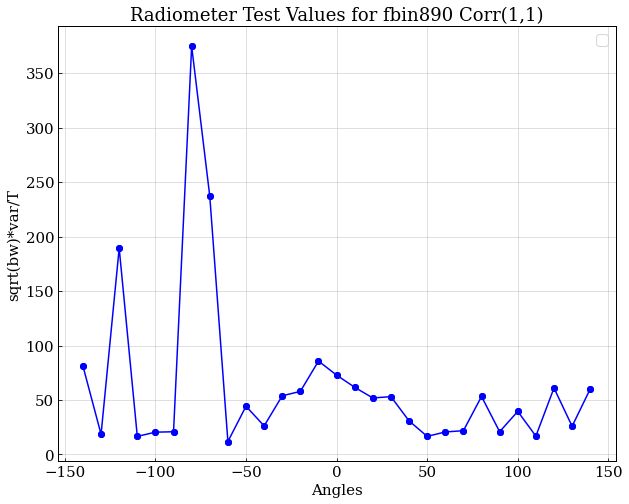

In [25]:
# Define the channel and frequency index you want to inspect
channel_to_check = 4  # Example channel
freq_index_to_check = 890  # Example frequency index

# Initialize lists to store the results
angles_list = []
r_test_values_list = []

# Extract r_test_value for all angles at the specified channel and frequency index
for ang, data in radio_test[channel_to_check].items():
    angles_list.append(float(ang))
    # Get the r_test_value for the specified frequency index
    if len(data['r_test_value']) > freq_index_to_check:
        r_test_value = data['r_test_value'][freq_index_to_check]
    else:
        r_test_value = np.nan  # Handle cases where the frequency index might be out of bounds
    r_test_values_list.append(r_test_value)

# Convert lists to numpy arrays for easier handling
angles_array = np.array(angles_list)
r_test_values_array = np.array(r_test_values_list)

# Specify the path to your CSV file
freq_csv = 'corr_stats/on_stats_f'+str(f_plot)+'_0702.csv'

# Initialize an empty list to store rows
data = []

# Open the CSV file and read its contents
with open(freq_csv, mode='r') as file:
    csv_reader = csv.reader(file)
    
    # Skip header row if present
    header = next(csv_reader)
    
    # Iterate over each row in the CSV
    for row in csv_reader:
        data.append(row)

# Suppose you want to access columns 0 (first column) and 2 (third column)
angles = [float(row[0]) for row in data] 

# Print the arrays
print("Angles:", angles_array)
print("R Test Values:", r_test_values_array)

plt.figure(figsize=(10,8))
plt.scatter(angles, r_test_values_array,color='blue')
#plt.scatter(angles,snr_00,label='T/std',color='red')
#plt.scatter(angles,snr_11,label='T/std(1,1)',color='indigo')
#plt.scatter(angles,snr,label='T/std',color='magenta')
plt.plot([angles[i] for i in sorted_indices],[r_test_values_array[i] for i in sorted_indices],marker='o', linestyle='-',color='blue')
#plt.plot([angles[i] for i in sorted_indices], [snr_00[i] for i in sorted_indices], marker='o', linestyle='-', color='red')
#plt.plot([angles[i] for i in sorted_indices], [snr_11[i] for i in sorted_indices], marker='o', linestyle='-', color='indigo')
#plt.plot([angles[i] for i in sorted_indices], [snr[i] for i in sorted_indices], marker='o', linestyle='-', color='magenta')
plt.title('Radiometer Test Values for fbin'+str(freq_index_to_check)+' Corr(1,1)')
plt.xlabel("Angles")
plt.ylabel("sqrt(bw)*var/T")
plt.legend()

In [ ]:
# difference in mag between corr channels (0,0) and (0,1)
plt.plot(pow_mag.real[:,fbin,0] - pow_mag.real[:,fbin,1], c="magenta")
#plt.ylim(0,2000)

In [ ]:
# Dividing by gain 
print(pow_mag[:,:,0])
print(gain[0,:,0])
pow_mag.real=np.array(pow_mag)
gain=np.array(gain)

i = 0
pow_mag_mod=np.zeros((5000,1024))
for i in np.arange(0,5000,1):
    pow_mag_mod[i,:] = np.divide(pow_mag[i,:,0], gain[0,:,0])
plt.figure(figsize=[15,10])
plt.plot(pow_mag_mod[4040, :], label='single time bin', c="magenta")
#plt.plot(pow_mag_mod[:,1], label='single freq bin', c="blue")
#plt.ylim(0.0074,0.0075)
#plt.xlim(0,100)
#print(pow_mag_mod[:500, 100])
print(pow_mag_mod.shape)

plt.plot(pow_mag.real[50,:,0]/gain[0,:,0])

In [ ]:
## plot time bin durations for whole data (to see any glitch)
plt.figure()
#plt.plot(np.diff(corr_data.time["irigb_time"]))
plt.plot(np.diff(corr_data.time["irigb_time"])[1:], c="blue")
delta_time = np.diff(corr_data.time["irigb_time"])[1]*1e-9
print(f"Each time bin is: {delta_time} seconds")

In [ ]:
#KBB -> Phase variation for a single time bin as a function of frequency
def plot_freq_channel_corr_data(pow_mag, freq_index, freq, corr_indices):
    fig= plt.figure(figsize=(10, 5))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    fbin = 3570
    for index, corr_index in enumerate(corr_indices):
            ax = plt.subplot(dim1, dim2, index + 1)
            plt.title(f"Corr: {corr_data.prod[corr_index]}")
            ax.plot(pow_mag[395,500:950, corr_index], c=colorsarr[500], label='tbin 395')
            #ax.plot(pow_mag[3710,510:550, corr_index], c=colorsarr[700], label='tbin 3710')
            #ax.plot(pow_mag[3860,510:550, corr_index], c=colorsarr[900], label='tbin 3860')
            #ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            ax.legend()
            plt.xlabel(f"frequency index")
            plt.ylabel(f"phase (degrees)")
            #plt.ylim(-0.01,0.01)

    plt.suptitle(f"Correlated noise phase - frequency: 400-800MHz")
    plt.tight_layout()

In [ ]:
#KBB -> Phase variation for a single time bin as a function of frequency
print(corr_data.freq) # from corr file 
#print(f['index_map']['freq'][:]) # from digital gain file 
frequency_index = 200  # why 200? -> 200th freq bin refers to 721.875 MHz
frequency = corr_data.freq[0][0] # freq at that frequency bin 
plot_freq_channel_corr_data(pow_phase,frequency_index,frequency,[1])

In [ ]:
##-- write code again for determining the slopes --##

dx1=np.diff(np.arange(0,1024,1))
dy1=np.diff(pow_phase[2947:2957,fbin,1])
slopes1 = dy1/dx1

dx2=np.diff(np.arange(0,1024,1))
dy2=np.diff(pow_phase[2947:2957,fbin,1])
slopes2=dy2/dx2

dx3=np.diff(np.arange(0,1024,1))
dy3=np.diff(pow_phase[2947:2957,fbin,1])
slopes3=dy3/dx3

# determining std of those slopes 
std1=np.std(slopes1)
std2=np.std(slopes2)
std3=np.std(slopes3)
fig = plt.figure()
ax = plt.subplot(111)

ax.plot(std1, c=colorsarr[100], label='slopes1')
ax.plot(std2, c=colorsarr[500], label='slopes2')
ax.plot(std3, c=colorsarr[800], label='slopes3')
ax.legend()

plt.show()

In [ ]:
## plotting phase curve slopes for different correlation powers 
fig = plt.figure()
ax = plt.subplot(111)

ax.plot(slopes1, c=colorsarr[100],label='time bin - 3570')
ax.plot(slopes2, c=colorsarr[500],label='time bin - 3710')
ax.plot(slopes3, c=colorsarr[800],label='time bin - 3860')

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [ ]:
#KBB -> Phase variation for a single frequency bin as a function of time
def plot_freq_channel_corr_data(pow_phase, freq_index, corr_indices):
    plt.figure(figsize=(25, 10))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for index, corr_index in enumerate(corr_indices):
            plt.subplot(dim1, dim2, index + 1)
            plt.title(f"Corr: {corr_data.prod[corr_index]}")
            plt.plot(pow_phase[4000:4500,freq_index, corr_index])

    #plt.suptitle(f"Frequency {freq} MHz")
    plt.tight_layout()

In [ ]:
#KBB -> Phase variation for a single frequency bin as a function of time
frequency_index = np.arange(600,850,1)
frequency = corr_data.freq[frequency_index][0]
print(f"Frequency: {frequency}")
plot_freq_channel_corr_data(pow_phase,frequency_index,[1])

In [ ]:
# plotting phase vs time for all correlated 1 sec time samples
def plot_freq_channel_corr_data(pow_phase,time_index, corr_indices):
    plt.figure(figsize=(25, 10))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for index, corr_index in enumerate(corr_indices):
            plt.subplot(dim1, dim2, index + 1)
            plt.title(f"Corr: {corr_data.prod[corr_index]}")
            plt.plot(pow_phase[time_index,740:870, corr_index])

    #plt.suptitle(f"Frequency {freq} MHz")
    plt.tight_layout()

time_index = np.arange(5005,6005)
plot_freq_channel_corr_data(pow_phase,time_index,[1])

In [ ]:
#### beam pattern ###

In [ ]:
## -- correlator data 
# reading the required only corr files for plotting beam pattern
file_path = '/Volumes/EXTRSSD/corr_dat4/20240702T150724Z_WVUc52/corr/*/*' 

# reading files for 0 degrees angle between rx and tx
corr_data0 = read_corr_mode_h5(file_path, f_start=20, f_stop=22)
pow_mag0, pow_phase0 = get_mag_phase(corr_data0.vis)
# reading files for negative 10 degrees angle between rx and tx
corr_data10n = read_corr_mode_h5(file_path, f_start=56, f_stop=58)
pow_mag10n, pow_phase10n = get_mag_phase(corr_data10n.vis)
# reading files for negative 20 degrees angle between rx and tx
corr_data20n = read_corr_mode_h5(file_path, f_start=62, f_stop=64)
pow_mag20n, pow_phase20n = get_mag_phase(corr_data20n.vis)
# reading files for negative 30 degrees angle between rx and tx
corr_data30n = read_corr_mode_h5(file_path, f_start=69, f_stop=71)
pow_mag30n, pow_phase30n = get_mag_phase(corr_data30n.vis)
# reading files for negative 40 degrees angle between rx and tx
corr_data40n = read_corr_mode_h5(file_path, f_start=75, f_stop=77)
pow_mag40n, pow_phase40n = get_mag_phase(corr_data40n.vis)
# reading files for negative 50 degrees angle between rx and tx
corr_data50n = read_corr_mode_h5(file_path, f_start=82, f_stop=85)
pow_mag50n, pow_phase50n = get_mag_phase(corr_data50n.vis)
# reading files for negative 60 degrees angle between rx and tx
corr_data60n = read_corr_mode_h5(file_path, f_start=90, f_stop=92)
pow_mag60n, pow_phase60n = get_mag_phase(corr_data60n.vis)
# reading files for negative 70 degrees angle between rx and tx
corr_data70n = read_corr_mode_h5(file_path, f_start=98, f_stop=100)
pow_mag70n, pow_phase70n = get_mag_phase(corr_data70n.vis)
# reading files for negative 80 degrees angle between rx and tx 
corr_data80n = read_corr_mode_h5(file_path, f_start=104, f_stop=106)
pow_mag80n, pow_phase80n = get_mag_phase(corr_data80n.vis)
# reading files for negative 90 degrees angle between rx and tx 
corr_data90n = read_corr_mode_h5(file_path, f_start=113, f_stop=115)
pow_mag90n, pow_phase90n = get_mag_phase(corr_data90n.vis)
# reading files for negative 100 degrees angle between rx and tx 
corr_data100n = read_corr_mode_h5(file_path, f_start=120, f_stop=122)
pow_mag100n, pow_phase100n = get_mag_phase(corr_data100n.vis)
# reading files for negative 110 degrees angle between rx and tx 
corr_data110n = read_corr_mode_h5(file_path, f_start=127, f_stop=129)
pow_mag110n, pow_phase110n = get_mag_phase(corr_data110n.vis)
# reading files for negative 120 degrees angle between rx and tx 
corr_data120n = read_corr_mode_h5(file_path, f_start=133, f_stop=135)
pow_mag120n, pow_phase120n = get_mag_phase(corr_data120n.vis)
# reading files for negative 130 degrees angle between rx and tx 
corr_data130n = read_corr_mode_h5(file_path, f_start=140, f_stop=142)
pow_mag130n, pow_phase130n = get_mag_phase(corr_data130n.vis)
# reading files for negative 140 degrees angle between rx and tx 
corr_data140n = read_corr_mode_h5(file_path, f_start=147, f_stop=149)
pow_mag140n, pow_phase140n = get_mag_phase(corr_data140n.vis)


# reading files for positive 10 degrees angle between rx and tx
corr_data10p = read_corr_mode_h5(file_path, f_start=159, f_stop=161)
pow_mag10p, pow_phase10p = get_mag_phase(corr_data10p.vis)
# reading files for positive 20 degrees angle between rx and tx 
corr_data20p = read_corr_mode_h5(file_path, f_start=164, f_stop=166)
pow_mag20p, pow_phase20p = get_mag_phase(corr_data20p.vis)
# reading files for positive 30 degrees angle between rx and tx
corr_data30p = read_corr_mode_h5(file_path, f_start=170, f_stop=172)
pow_mag30p, pow_phase30p = get_mag_phase(corr_data30p.vis)
# reading files for positive 40 degrees angle between rx and tx 
corr_data40p = read_corr_mode_h5(file_path, f_start=180, f_stop=182)
pow_mag40p, pow_phase40p = get_mag_phase(corr_data40p.vis)
# reading files for positive 50 degrees angle between rx and tx
corr_data50p = read_corr_mode_h5(file_path, f_start=187, f_stop=189)
pow_mag50p, pow_phase50p = get_mag_phase(corr_data50p.vis)
# reading files for positive 60 degrees angle between rx and tx 
corr_data60p = read_corr_mode_h5(file_path, f_start=195, f_stop=197)
pow_mag60p, pow_phase60p = get_mag_phase(corr_data60p.vis)
# reading files for positive 70 degrees angle between rx and tx
corr_data70p = read_corr_mode_h5(file_path, f_start=202, f_stop=204)
pow_mag70p, pow_phase70p = get_mag_phase(corr_data70p.vis)
# reading files for positive 80 degrees angle between rx and tx 
corr_data80p = read_corr_mode_h5(file_path, f_start=210, f_stop=212)
pow_mag80p, pow_phase80p = get_mag_phase(corr_data80p.vis)
# reading files for positive 90 degrees angle between rx and tx 
corr_data90p = read_corr_mode_h5(file_path, f_start=218, f_stop=220)
pow_mag90p, pow_phase90p = get_mag_phase(corr_data90p.vis)
# reading files for positive 100 degrees angle between rx and tx 
corr_data100p = read_corr_mode_h5(file_path, f_start=226, f_stop=228)
pow_mag100p, pow_phase100p = get_mag_phase(corr_data100p.vis)
# reading files for positive 110 degrees angle between rx and tx 
corr_data110p = read_corr_mode_h5(file_path, f_start=233, f_stop=235)
pow_mag110p, pow_phase110p = get_mag_phase(corr_data110p.vis)
# reading files for positive 120 degrees angle between rx and tx 
corr_data120p = read_corr_mode_h5(file_path, f_start=240, f_stop=242)
pow_mag120p, pow_phase120p = get_mag_phase(corr_data120p.vis)
# reading files for positive 130 degrees angle between rx and tx 
corr_data130p = read_corr_mode_h5(file_path, f_start=247, f_stop=249)
pow_mag130p, pow_phase130p = get_mag_phase(corr_data130p.vis)
# reading files for positive 140 degrees angle between rx and tx 
corr_data140p = read_corr_mode_h5(file_path, f_start=255, f_stop=257)
pow_mag140p, pow_phase140p = get_mag_phase(corr_data140p.vis)


print("getting autocorrelation magnitudes and phase")
print("done getting pow_mag and pow_phase")

In [ ]:
## averaging 0.5 sec ON pulse datapoints -- correlator data 
# mean values are calulated at fbin 862

fbin = 890
m00=np.mean(pow_mag0[222:233,fbin,0])
m01=np.mean(pow_mag0[222:233,fbin,1])
m04=np.mean(pow_mag0[222:233,fbin,4])
#print(m00, m01, m04) -- 76814.09090909091 71796.04457820252 73003.36363636363

m10n0=np.mean(pow_mag10n[209:219,fbin,0])
m10n1=np.mean(pow_mag10n[209:219,fbin,1])
m10n4=np.mean(pow_mag10n[209:219,fbin,4])
#print(m10n0, m10n1, m10n4) -- 76870.9 71534.50809523166 71436.5
m20n0=np.mean(pow_mag20n[222:233,fbin,0])
m20n1=np.mean(pow_mag20n[222:233,fbin,1])
m20n4=np.mean(pow_mag20n[222:233,fbin,4])
#print(m20n0, m20n1, m20n4) -- 76798.45454545454 66708.46996172458 63415.72727272727
m30n0=np.mean(pow_mag30n[242:253,fbin,0])
m30n1=np.mean(pow_mag30n[242:253,fbin,1])
m30n4=np.mean(pow_mag30n[242:253,fbin,4])
#print(m30n0, m30n1, m30n4) -- 76813.09090909091 59186.12904448933 50725.181818181816
m40n0=np.mean(pow_mag40n[232:243,fbin,0])
m40n1=np.mean(pow_mag40n[232:243,fbin,1])
m40n4=np.mean(pow_mag40n[232:243,fbin,4])
#print(m40n0, m40n1, m40n4) -- 76637.36363636363 49138.78544461206 35808.181818181816
m50n0=np.mean(pow_mag50n[204:215,fbin,0])
m50n1=np.mean(pow_mag50n[204:215,fbin,1])
m50n4=np.mean(pow_mag50n[204:215,fbin,4])
#print(m50n0, m50n1, m50n4) -- 76647.45454545454 38053.945078826044 22652.0
m60n0=np.mean(pow_mag60n[207:218,fbin,0])
m60n1=np.mean(pow_mag60n[207:218,fbin,1])
m60n4=np.mean(pow_mag60n[207:218,fbin,4])
#print(m60n0, m60n1, m60n4) -- 76609.27272727272 25914.80216270764 11906.0
m70n0=np.mean(pow_mag70n[209:220,fbin,0])
m70n1=np.mean(pow_mag70n[209:220,fbin,1])
m70n4=np.mean(pow_mag70n[209:220,fbin,4])
#print(m70n0, m70n1, m70n4) -- 76689.36363636363 10108.28377342954 3287.090909090909
m80n0=np.mean(pow_mag80n[223:234,fbin,0])
m80n1=np.mean(pow_mag80n[223:234,fbin,1])
m80n4=np.mean(pow_mag80n[223:234,fbin,4])
#print(m80n0, m80n1, m80n4) -- 76742.54545454546 2685.678522579958 681.9090909090909
m90n0=np.mean(pow_mag90n[208:219,fbin,0])
m90n1=np.mean(pow_mag90n[208:219,fbin,1])
m90n4=np.mean(pow_mag90n[208:219,fbin,4])
#print(m90n0, m90n1, m90n4) -- 76558.54545454546 11586.59287893152 3916.909090909091
m100n0=np.mean(pow_mag100n[204:215,fbin,0])
m100n1=np.mean(pow_mag100n[204:215,fbin,1])
m100n4=np.mean(pow_mag100n[204:215,fbin,4])
#print(m100n0, m100n1, m100n4) -- 76576.0 19698.285928951216 7951.363636363636
m110n0=np.mean(pow_mag110n[224:235,fbin,0])
m110n1=np.mean(pow_mag110n[224:235,fbin,1])
m110n4=np.mean(pow_mag110n[224:235,fbin,4])
#print(m110n0, m110n1, m110n4) -- 76681.27272727272 21741.107291859822 9152.636363636364
m120n0=np.mean(pow_mag120n[214:225,fbin,0])
m120n1=np.mean(pow_mag120n[214:225,fbin,1])
m120n4=np.mean(pow_mag120n[214:225,fbin,4])
#print(m120n0, m120n1, m120n4) -- 76400.72727272728 18972.181260660585 7567.181818181818
m130n0=np.mean(pow_mag130n[210:221,fbin,0])
m130n1=np.mean(pow_mag130n[210:221,fbin,1])
m130n4=np.mean(pow_mag130n[210:221,fbin,4])
#print(m130n0, m130n1, m130n4) -- 76563.72727272728 12573.796967319306 4348.090909090909
m140n0=np.mean(pow_mag140n[206:217,fbin,0])
m140n1=np.mean(pow_mag140n[206:217,fbin,1])
m140n4=np.mean(pow_mag140n[206:217,fbin,4])
#print(m140n0, m140n1, m140n4) -- 76585.90909090909 8754.049153678543 2754.818181818182

m10p0=np.mean(pow_mag10p[210:221,fbin,0])
m10p1=np.mean(pow_mag10p[210:221,fbin,1])
m10p4=np.mean(pow_mag10p[210:221,fbin,4])
#print(m10p0, m10p1, m10p4) -- 76721.81818181818 67830.58646559835 65417.454545454544
m20p0=np.mean(pow_mag20p[217:228,fbin,0])
m20p1=np.mean(pow_mag20p[217:228,fbin,1])
m20p4=np.mean(pow_mag20p[217:228,fbin,4])
#print(m20p0, m20p1, m20p4) -- 76554.36363636363 60359.71473172708 52673.72727272727
m30p0=np.mean(pow_mag30p[207:218,fbin,0])
m30p1=np.mean(pow_mag30p[207:218,fbin,1])
m30p4=np.mean(pow_mag30p[207:218,fbin,4])
#print(m30p0, m30p1, m30p4) -- 76570.27272727272 51048.79444861101 38492.818181818184
m40p0=np.mean(pow_mag40p[222:233,fbin,0])
m40p1=np.mean(pow_mag40p[222:233,fbin,1])
m40p4=np.mean(pow_mag40p[222:233,fbin,4])
#print(m40p0, m40p1, m40p4) -- 76471.09090909091 39584.6025623369 24255.545454545456
m50p0=np.mean(pow_mag50p[218:229,fbin,0])
m50p1=np.mean(pow_mag50p[218:229,fbin,1])
m50p4=np.mean(pow_mag50p[218:229,fbin,4])
#print(m50p0, m50p1, m50p4) -- 76596.72727272728 27659.34766187499 13226.545454545454
m60p0=np.mean(pow_mag60p[220:231,fbin,0])
m60p1=np.mean(pow_mag60p[220:231,fbin,1])
m60p4=np.mean(pow_mag60p[220:231,fbin,4])
#print(m60p0, m60p1, m60p4) -- 76626.18181818182 15434.229450044695 5707.363636363636
m70p0=np.mean(pow_mag70p[217:228,fbin,0])
m70p1=np.mean(pow_mag70p[217:228,fbin,1])
m70p4=np.mean(pow_mag70p[217:228,fbin,4])
#print(m70p0, m70p1, m70p4) -- 76708.54545454546 10842.313662787377 3595.909090909091
m80p0=np.mean(pow_mag80p[219:230,fbin,0])
m80p1=np.mean(pow_mag80p[219:230,fbin,1])
m80p4=np.mean(pow_mag80p[219:230,fbin,4])
#print(m80p0, m80p1, m80p4) -- 76603.45454545454 16730.798732680134 6398.090909090909
m90p0=np.mean(pow_mag90p[221:232,fbin,0])
m90p1=np.mean(pow_mag90p[221:232,fbin,1])
m90p4=np.mean(pow_mag90p[221:232,fbin,4])
#print(m90p0, m90p1, m90p4) -- 76516.36363636363 21192.316171763017 8865.0
m100p0=np.mean(pow_mag100p[224:235,fbin,0])
m100p1=np.mean(pow_mag100p[224:235,fbin,1])
m100p4=np.mean(pow_mag100p[224:235,fbin,4])
#print(m100p0, m100p1, m100p4) -- 76564.27272727272 21175.523276848347 8818.818181818182
m110p0=np.mean(pow_mag110p[220:231,fbin,0])
m110p1=np.mean(pow_mag110p[220:231,fbin,1])
m110p4=np.mean(pow_mag110p[220:231,fbin,4])
#print(m110p0, m110p1, m110p4) -- 76495.45454545454 17016.147452077774 6536.363636363636
m120p0=np.mean(pow_mag120p[216:227,fbin,0])
m120p1=np.mean(pow_mag120p[216:227,fbin,1])
m120p4=np.mean(pow_mag120p[216:227,fbin,4])
#print(m120p0, m120p1, m120p4) -- 76614.54545454546 10483.185657955028 3446.909090909091
m130p0=np.mean(pow_mag130p[212:223,fbin,0])
m130p1=np.mean(pow_mag130p[212:223,fbin,1])
m130p4=np.mean(pow_mag130p[212:223,fbin,4])
#print(m130p0, m130p1, m130p4) -- 76519.36363636363 7709.4763875321405 2371.6363636363635
m140p0=np.mean(pow_mag140p[215:226,fbin,0])
m140p1=np.mean(pow_mag140p[215:226,fbin,1])
m140p4=np.mean(pow_mag140p[215:226,fbin,4])
#print(m140p0, m140p1, m140p4) -- 76531.72727272728 11078.15788186015 3716.3636363636365

In [ ]:
# extracting the required datapoints (higher correlation time bins chosen) -- correlator data 
angles = [ -140, -130, -120, -110, -100, -90, -80, -70, -60,-50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140]
autos_0x0 = [m140n0, m130n0, m120n0, m110n0, m100n0, m90n0, m80n0, m70n0, m60n0, m50n0, m40n0, m30n0, m20n0, m10n0, m00, m10p0, m20p0, m30p0, m40p0, m50p0, m60p0, m70p0, m80p0, m90p0, m100p0, m110p0, m120p0, m130p0, m140p0]
#print(autos_0x0)
crosses_0x1 = [m140n1, m130n1, m120n1, m110n1, m100n1, m90n1, m80n1, m70n1, m60n1, m50n1, m40n1, m30n1, m20n1, m10n1, m01, m10p1, m20p1, m30p1, m40p1, m50p1, m60p1, m70p1, m80p1, m90p1, m100p1, m110p1, m120p1, m130p1, m140p1]
#print(crosses_0x1)
autos_1x1 = [m140n4, m130n4, m120n4, m110n4, m100n4, m90n4, m80n4, m70n4, m60n4, m50n4, m40n4, m30n4, m20n4, m10n4, m04, m10p4, m20p4, m30p4, m40p4, m50p4, m60p4, m70p4, m80p4, m90p4, m100p4, m110p4, m120p4, m130p4, m140p4]
#print(autos_1x1)

In [ ]:
##conversion to log scale  -- correlator data 
# dividing factor -- np.sqrt(autos_0x0)

autolog_0x0=10*np.log10(autos_0x0)- 72.5 # giving offset of 74.5dB to match the range of VNA plots 
crosslog_0x1=20*np.log10(crosses_0x1/np.sqrt(autos_0x0)) - 62.1 # giving offset of 72.5dB to match the range of VNA plots 
autolog_1x1=10*np.log10(autos_1x1)- 62.5 # giving offset of 74.5dB to match the range of VNA plots 

In [ ]:
# KBB's version of understanding -- DO NOT RUN THIS CELL
##conversion to log scale  -- correlator data

autolog_0x0=20*np.log10(crosses_0x1/np.sqrt(autos_1x1)) - 72.1
crosslog_0x1=10*np.log10(crosses_0x1) - 71.7
autolog_1x1=20*np.log10(crosses_0x1/np.sqrt(autos_0x0)) - 71.3 # v0 is not constant
#autolog_1x1=10*np.log10(autos_1x1) - 71.7 # v0 is constant


In [ ]:
##plotting beam pattern just with correlator data 
colorsarr=cm.gnuplot2(np.linspace(0,1,1024))
fig = plt.figure(figsize=[10,8])
ax = plt.subplot(111)

# linear scale -- 
#ax.plot(angles, autos_0x0, ".--", c=colorsarr[fbin], label='Corr: (0,0)')
#ax.plot(angles, crosses_0x1, "s--",  c=colorsarr[fbin-200],label='Corr: (0,1)')
#ax.plot(angles, autos_1x1, "^--", c=colorsarr[fbin-300],label='Corr: (1,1)')

# logarithmic scale --
#ax.plot(angles, autolog_0x0, ".--", c=colorsarr[fbin], label='Corr: (0,0)')
ax.plot(angles, crosslog_0x1, "s--",  c=colorsarr[fbin-200],label='Corr: (0,1)')
ax.plot(angles, autolog_1x1, "^--", c=colorsarr[fbin-500],label='Corr: (1,1)')

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.legend()
#plt.ylim(-10,10)
plt.title("Corr: (0,1) and (1,1) at freq bin {}".format(fbin))
plt.xlabel("angle (deg)")
plt.ylabel("corr power (dB)")
plt.show()

In [ ]:
### Using touchstone files from VNA (.s2p files) ###

In [ ]:
## reading all s2p files and saving them in dictionary "dataframes" first with keys and 
## extracting every file in list "s12f" using key

directory = os.getcwd()
data_folder = os.path.join(directory, "/Volumes/EXTRSSD/7_1_AnechoicChamber/7_1_Anechoic_Chamber_SecondTest/s2p_files/")
s2p_files = os.listdir(data_folder)

prefix_ext=len('.s2p')
sorteds2p_files=sorted(s2p_files, key = lambda x: float(x[:-prefix_ext]))
dataframes = {}

s12f = []
for file in sorteds2p_files:
    dataframe_name = file.split(".")[0]  # Get the name of the file without the extension
    dataframes[dataframe_name] = Network(os.path.join(data_folder, file))
    s12f.append(dataframes[dataframe_name]) 
    

In [ ]:
## extracting s12 parameter for frequency bin of a choice using plotting functions of Network class from skrf

s12mag_arr = []
s12mags = []
for i in np.arange(1, len(s12f), 2, dtype=int):
    s12=s12f[i]["452.3949169MHz"].s12.s_db
    s12mag_arr.append(s12)

for j in np.arange(0, np.floor(len(s12f)/2), dtype=int):
    s12mags.append(s12mag_arr[j][0][0][0])

In [ ]:
##plotting beam pattern with correlator as well as vna data 

colorsarr=cm.gnuplot2(np.linspace(0,1,1024))
fig = plt.figure(figsize=[10,8])
ax = plt.subplot(111)

# logarithmic scale --
#angles1 = np.array([-135,-130,-125,-120,-115,-110,-105,-100,-95,-90,-85,-80,-75,-70,-65,-60,-55,-50,-45,-40,-35,-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100,105,110,115,120,125,130,135])
angles1=np.arange(-130,140,10)
angles = [ -140, -130, -120, -110, -100, -90, -80, -70, -60,-50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140]
ax.plot(angles1, s12mags, "v-", c=colorsarr[fbin-300], label='VNA measurements')
ax.plot(angles, crosslog_0x1, "s-",  c=colorsarr[fbin-200],label='Corr: (0,1)')
ax.plot(angles, autolog_1x1, "^-", c=colorsarr[fbin-500],label='Corr: (1,1)')

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.legend()
plt.ylim(-35,-10)
plt.title("Corr: (0,1) and (1,1) at freq bin {}".format(fbin))
plt.xlabel("angle (deg)")
plt.ylabel("corr power (dB)")
plt.show()

In [ ]:
## VNA data -- Morgan's code  

In [ ]:
## VNA data -- Morgan's code  
import csv
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import wfdb
from PIL import Image
from IPython.display import display, Image

In [ ]:
## Morgan's code -- VNA data 
## Get the data files and store them in dataframes where they can be called on as dataframes["name##"]

# Get the current directory
directory = os.getcwd()

# Path to the data folder
data_folder = os.path.join(directory, "/Users/kalyanibhopi94/Downloads/anechoic_chamber_data2/") #replace with your path to the data

# List all files in the data folder
files = os.listdir(data_folder)

# Filter files that start with "antwo" and end with ".csv"
outside_files = [file for file in files if file.startswith("antwo") and file.endswith(".csv")]

# Create a dictionary to hold the dataframes
dataframes = {}

# Read each CSV file into a dataframe and store it in the dictionary
for file in outside_files:
    dataframe_name = file.split(".")[0]  # Get the name of the file without the extension
    dataframes[dataframe_name] = pd.read_csv(os.path.join(data_folder, file))

In [ ]:
## Morgan's code -- VNA data
def csv_reframe(csv_file):
    # Load the CSV file into a DataFrame (assuming csv_file is already a DataFrame)
    df = csv_file
    
    # Step 1: Find the index where the first column contains the value "Frequency [Hz]" and "Bridge Name"
    index_frequency = df.index[df.iloc[:, 0] == "Frequency [Hz]"].tolist()[0]
    index_bridge = df.index[df.iloc[:, 0] == "Bridge Mode"].tolist()

    # Extract suffix_name_1 and suffix_name_2 as strings
    suffix_name_1 = str(df.iloc[index_bridge[0], 1])
    suffix_name_2 = str(df.iloc[index_bridge[0], 5])
    
    # Step 3: Extract the row at index `index_frequency` as new column names
    new_column_names = df.iloc[index_frequency].astype(str).tolist()  # Ensure all names are strings

    # Step 4: Check for duplicate column names and add distinguishing suffix
    seen = {}
    suffix_counter = {}
    
    for i, name in enumerate(new_column_names):
        if name not in seen:
            seen[name] = 1  # First occurrence, use suffix_name_1
            new_column_names[i] += f"_{suffix_name_1}"
        else:
            seen[name] += 1
            if seen[name] == 2:
                new_column_names[i] += f"_{suffix_name_2}"  # Second occurrence, use suffix_name_2
            elif seen[name] % 4 == 3:  # Third occurrence (and every fourth occurrence)
                new_column_names[i] += f"_{suffix_name_1}_1"  # Use suffix_name_1 + _1
            else:
                new_column_names[i] += f"_{suffix_name_2}"  # Fourth occurrence, use suffix_name_2

    # Step 5: Copy and store rows including and after the index_frequency row
    new_df = df.iloc[index_frequency+1:].copy()

    # Step 6: Set the new column names
    new_df.columns = new_column_names

    # Step 7: Remove columns with NaN names
    new_df = new_df.dropna(axis=1, how='all')

    # Return the new DataFrame
    return new_df

In [ ]:
## Morgan's code -- VNA data 
#reframing all the data

# Dictionary to hold reframed dataframes
reframed_dfs = {}

for filename, dataframe in dataframes.items():
    # Extract the number from the filename
    num_str = filename.split("antwo")[1].split(".csv")[0]
    num = int(num_str) if num_str else 0
    # Call csv_reframe function on the current dataframe
    reframed_dfs[f"antwo_{num}"] = csv_reframe(dataframe)

In [ ]:
## Morgan's code -- VNA data 
#Displaying as an example

reframed_dfs["antwo_5"]

In [ ]:
## Morgan's code -- VNA data 
# Define function to retrieve specific CSV files from the dataframes dictionary

def retrieve_files(dataframes, file_numbers):
    retrieved_dataframes = {}
    for num in file_numbers:
        filename = f"antwo_{num}"
        if filename in dataframes:
            retrieved_dataframes[filename] = dataframes[filename]
        else:
            print(f"DataFrame {filename} not found.")
    return retrieved_dataframes

In [ ]:
## Morgan's code -- VNA data 
#place where I define & retrieve the files of the different groups of measurements I want

s21_12 = [5,7,8,11,12,15,16,19,20,23,24,27,28,31,32,35,36,39,40,42,45,46,49,50,53,54,57,58,61,62,65,66,69,70,73,74,77]
s11_22 = [4,6,9,10,13,14,17,18,21,22,25,26,29,30,33,34,37,38,41,43,44,47,48,51,52,55,56,59,60,63,64,67,68,71,72,75,76]

s21_12_data = retrieve_files(reframed_dfs,s21_12)
s11_22_data = retrieve_files(reframed_dfs,s11_22)

In [ ]:
## Morgan's code -- VNA data 
#To Match Kalyani's bins

def interpolate_value(step, total_steps, start_value, end_value):
    # Calculate the fraction of the total range
    fraction = step / total_steps
    
    # Interpolate to find the value at the specified step
    interpolated_value = start_value + fraction * (end_value - start_value)
    
    return interpolated_value

# Given values
total_steps = 1024
start_value = 800e6
end_value = 400e6

step_to_find = 778 #enter whatever you want here

# Calculate the interpolated value at step 245
value_at_step = interpolate_value(step_to_find, total_steps, start_value, end_value)

print(f"The value at bin "+str(step_to_find)+" is: " +str(value_at_step)+" Hz")


In [ ]:
colorsarr=cm.gnuplot2(np.linspace(0,1,1024))
desired_freq = value_at_step  
frequency_column = (s21_12_data['antwo_5']['Frequency [Hz]_S21']).astype(float)

# Find the index of the closest value
fav_freq_index = (np.abs(frequency_column - desired_freq)).idxmin()

# Get the actual closest value
closest_value = frequency_column[fav_freq_index]

#print("Index of Closest Value:", fav_freq_index)
#print("Closest Value:", closest_value)

s21mags = []
s21phases = []
for key, df in s21_12_data.items():
    # Extract magnitude and phase values for S21 from specific row and column indices
    mag = df.iloc[:, 1]
    all_mags_corrected1 = mag.astype(float) 
    mag = all_mags_corrected1[fav_freq_index]
    phase = float(df.iloc[fav_freq_index, 2]) % 360  # Ensure the value is numeric before applying modulo
    if phase > 180:
        phase -= 360
    # Append the values to the arrays
    s21mags.append(mag)
    s21phases.append(phase)

s12mags = []
s12phases = []
for key, df in s21_12_data.items():
    # Extract magnitude and phase values for S12 from specific row and column indices
    mag = df.iloc[:, 4]
    all_mags_corrected1 = mag.astype(float)
    mag = all_mags_corrected1[fav_freq_index]
    phase = float(df.iloc[fav_freq_index, 5]) % 360  # Ensure the value is numeric before applying modulo
    if phase > 180:
        phase -= 360
    # Append the values to the arrays
    # Append the values to the arrays
    s12mags.append(mag)
    s12phases.append(phase)

# Convert angles1 and s21mags to numpy arrays for easier handling

angles1 = np.array([-90,-85,-80,-75,-70,-65,-60,-55,-50,-45,-40,-35,-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90])
mags21_float = np.array([float(value) for value in s21mags])
mags12_float = np.array([float(value) for value in s12mags])

fig = plt.figure(figsize=[7,5])
ax = plt.subplot(111)
# Plotting scatter plot with bolder dots
#plt.scatter(angles1, mags1_float, marker='o', s=20, label='Bicolog Transmission on Chime Antenna', alpha=0.75, edgecolors='black',c='orange')  # Increased 's' for larger dots, 'alpha' for transparency, 'edgecolors' for bolder dots

# Plotting line connecting the points
ax.plot(angles1, mags12_float, "s--", color= colorsarr[fbin], label='VNA (S12) measurements')  # Adjust linestyle, linewidth, and alpha as needed
ax.plot(angles, crosslog_0x1, "v--",  c=colorsarr[fbin-300],label='Corr: (0,1)')
ax.plot(angles, autolog_1x1, "^--", c=colorsarr[fbin-600],label='Corr: (1,1)')
#Marking the actual peaks
#plt.axvline(x=angles1[mags1_float.index(max(mags1_float))], color='pink', linestyle='--')
plt.xlabel('Angle (degrees)')
plt.ylabel('Received power (dB)')
# Adding values to x-axis ticks
#plt.xticks(ticks=all_angles, labels=[f'{angle}' for angle in angles1])
# Adding dB unit to y-axis ticks
#plt.yticks(ticks=plt.yticks()[0], labels=[f'{gain} dB' for gain in plt.yticks()[0]])
plt.title('Freq ' +str(s21_12_data['antwo_5']['Frequency [Hz]_S21'][fav_freq_index])+' MHz (freq bin '+str(step_to_find)+')')
plt.legend(loc='upper left',bbox_to_anchor=(1.05, 1))
plt.grid(True, alpha=0.5)
plt.show()

In [ ]:

### Using touchstone files from VNA (.s2p files) ### -- learning how to use functions -- IGNORE THIS SECTION


In [ ]:
## reading single s2p file 
s00 = Network('/Volumes/EXTRSSD/7_1_AnechoicChamber/7_1_Anechoic_Chamber_SecondTest/s2p_files/000.s2p')

In [ ]:
s00

In [ ]:
s00.plot_s_db() # plot magnitude of s-parameters in log scale

In [ ]:
s00.plot_s_db(0,1) ## S12 parameter

In [ ]:
s00.plot_s_deg() # plot phase of s-parameters in degrees

In [ ]:
s00.plot_s_deg(0,0) # plot phase of s11 

In [ ]:
s00.plot_s_smith() # plot complex s-parameters on Smith Chart

In [ ]:
s00.plot_s_smith(1,1)  # plot complex s22 on smith chart

In [ ]:
np.shape(s00.s) # size of every s2p file

In [ ]:
## slicing the data point you want from s2p file 
s12=s00.s[fbin,0,1]